#Instructions:

This is a long code with many user inputs required! Please read all instructions carefully.

This code is split into multiple sections. Each section conducts spatial k-fold tests for a specific percentage of additional random 0s. For instance, the first section (Titled "0% 0s") conducts testing on featurized labels in which there are 0% the amount of random 0s to 1s, in addition to the 1:1 ratio of neighbor 0s to 1s. The next section (Titled "1% 0s") conducts the same test on featurized labels in which there are 1% the amount of random 0s to 1s, still with the 1:1 ratio of neighbor 0s to 1s. And so on, up to 400%.

For each section, the labels used should have been created in the "00_create_label_data" code in Github. They must also have been featurized using GEE (yes, this code is GEE dependent - other spatial softwares will not work). The test will not work if you do not have both 0s and 1s in the indicator column of your label data. So even if you are using 0% random 0s as described above, you should still have some 0s in the data created by the two-neighbor-over process in the "00_create_label_data" code.

At the end of each section, data points from the tests are added to a master data frame "df_long". At the end of the code, a series of figures are generated with this master data frame to demonstrate the effectiveness of different ratios of 0s to 1s.

#User Input Information:
At the beginning of each section there are two lines that require user input, indicated by the "USER INPUT" label.

The first line requests the folder path corresponding to the specific percentage of additional random 0s. Input the folder path where the corresponding .csv files from GEE live.

The second line requests the file pattern name of those labels. This allows the code to pick up all files within the specified folder that follow a specific naming pattern. Type in the common name for all of the data files, followed by a * when the names begin to diverge.

At the very end of the code in the figures section, if you would like to save the figures, you must input the save location. You must also input the saving location in the first block of code below.

That's it!

Packages required for the whole code:

In [1]:
import pandas as pd
import glob
import os
import datetime

from google.colab import drive

drive.mount('/content/drive', force_remount=True)


today_date = datetime.date.today().strftime("%Y-%m-%d")

#------USER INPUT--------#
#Insert the output folder path where you would like to save everything
output_folder = '/content/drive/MyDrive/MOSAIKS/superfund_project_summer2026/Results/Figures/Testing Phase'

Mounted at /content/drive


#For 0% 0s

In [2]:
#------USER INPUT--------#
#Input the folder path and file list where your GEE featurized 0% random 0s .csv label files are stored
folder_path = '/content/drive/MyDrive/Research/Young/MOSAIKS/superfund_project_summer2026/Data/Intermediate/Spatial K Folds/Federal/0/' #file path here
file_pattern = os.path.join(folder_path, 'GEE_featurization_federal_*.csv') #name pattern of files from GEE here
file_list = glob.glob(file_pattern)

print(f"Found {len(file_list)} files to combine.")

#Read each file into a list of DataFrames
df_list = [pd.read_csv(f) for f in file_list]

#Concatenate (stack) them into one master DataFrame
full_df = pd.concat(df_list, ignore_index=True)

#Check the final count to make sure it matches your # of points
print(f"Final combined row count: {len(full_df)}")
full_df.head()

gdf_test=full_df

Found 7 files to combine.
Final combined row count: 3216


In [3]:
pip install spatial-kfold

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 288.3/288.3 kB 3.7 MB/s eta 0:00:00


In [4]:
import numpy as np
import seaborn as sns
import geopandas as gpd
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import LeaveOneGroupOut
from sklearn.model_selection import cross_validate
import matplotlib.pyplot as plt
from matplotlib import cm
import matplotlib.colors as colors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from sklearn.metrics import roc_curve, roc_auc_score

from spatialkfold.blocks import spatial_blocks
from spatialkfold.datasets import load_ames
from spatialkfold.clusters import spatial_kfold_clusters
from spatialkfold.plotting import spatial_kfold_plot
from spatialkfold.stats import spatial_kfold_stats

from sklearn.metrics import auc, RocCurveDisplay
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import FixedThresholdClassifier

from sklearn.metrics import accuracy_score, precision_score, log_loss

from matplotlib.ticker import ScalarFormatter



In [5]:
#Global list to store all results for df_long
all_results_data = []

# Helper function to add a row of data to the global list
def add_result_row(pct, cv_type, metric, mean, median, std, min_val, max_val, q1, q3):
    all_results_data.append({
        'Pct': pct, 'Type': cv_type, 'Metric': metric,
        'Mean': mean, 'Median': median, 'Std': std,
        'Min': min_val, 'Max': max_val, 'Q1': q1, 'Q3': q3
    })


FIXING: Converting gdf_test from DataFrame to GeoDataFrame.
Re-projecting data to UTM for accurate clustering...
Starting spatial clustering into 10 folds (3216 points)...


/tmp/ipykernel_2629/1396755428.py:51: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cols_tab = cm.get_cmap('tab20', 10)


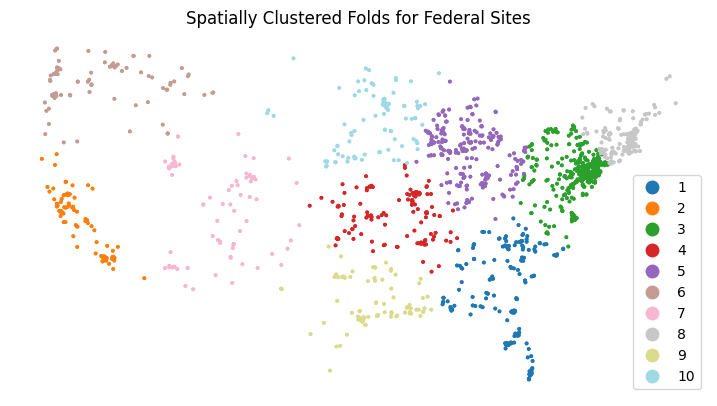

Clustering complete. Found 10 unique folds.


In [6]:
#Spatial Clustering

#Re-initialize gdf_test from the original full_df, ensuring 'indicator' is present and is a pandas DataFrame, so the subsequent `if` block correctly converts it.
gdf_test = full_df.copy()

# Assuming 'gdf_test' currently exists as a Pandas DataFrame with 'lon'/'lat'
# First, ensure gdf_test is a GeoDataFrame, potentially converting it.
if not isinstance(gdf_test, gpd.GeoDataFrame) or 'geometry' not in gdf_test.columns:
    print("FIXING: Converting gdf_test from DataFrame to GeoDataFrame.")

    # 1. Define bands (assuming they start with 'A') THIS IS GEE DEPENDENT!
    bands = [col for col in gdf_test.columns if col.startswith('A')]

    # 2. DROP NaN ROWS HERE
    initial_len = len(gdf_test)
    gdf_test = gdf_test.dropna(subset=bands).reset_index(drop=True)
    dropped = initial_len - len(gdf_test)
    if dropped > 0:
        print(f"Dropped {dropped} rows with NaN satellite features.")

    # 3. Recreate the GeoDataFrame structure
    gdf_test = gpd.GeoDataFrame(
        gdf_test,
        geometry=gpd.points_from_xy(gdf_test['lon'], gdf_test['lat']),
        crs="EPSG:4326"
    )

# 4. Add an 'id' column: This MUST be done after gdf_test is definitively a GeoDataFrame
# and before it's used for clustering, as previous map cells don't add it.
gdf_test['id'] = range(len(gdf_test))

# --- 1. PREPARE GEODATAFRAME for Clustering ---
# The estimate_utm_crs() requires a GeoDataFrame input.
print("Re-projecting data to UTM for accurate clustering...")
federal_prj = gdf_test.copy().to_crs(gdf_test.estimate_utm_crs())

# --- 2. SPATIAL CLUSTER RESAMPLING ---
print(f"Starting spatial clustering into 10 folds ({len(federal_prj)} points)...")

federal_clusters = spatial_kfold_clusters(
  gdf=federal_prj,
  name='id',
  nfolds=10,
  algorithm='kmeans',
  n_init="auto",
  random_state=569
  )

# --- 3. PLOTTING ---
# Get the 'tab20' colormap
cols_tab = cm.get_cmap('tab20', 10)
cols = [cols_tab(i) for i in range(10)]
color_ramp = ListedColormap(cols)

# Create a final GeoDataFrame containing the original CRS and the new fold information
federal_clusters_map = gdf_test.merge(
    federal_clusters[['id', 'folds']],
    left_on='id',
    right_on='id'
)

fig, ax = plt.subplots(1,1 , figsize=(9, 9))
federal_clusters_map.plot(
    column='folds',
    ax=ax,
    cmap=color_ramp,
    markersize=3,
    legend=True,
    categorical=True
)
ax.set_title('Spatially Clustered Folds for Federal Sites')
ax.set_axis_off()

plt.show()

print(f"Clustering complete. Found {federal_clusters['folds'].nunique()} unique folds.")

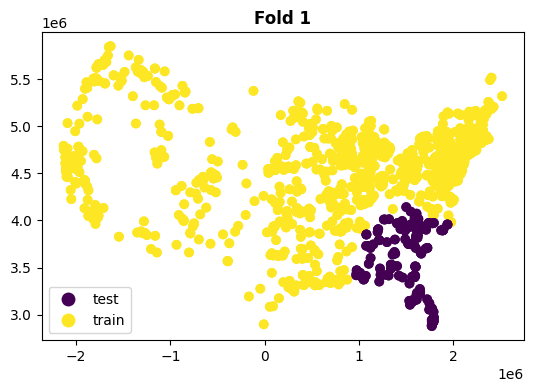

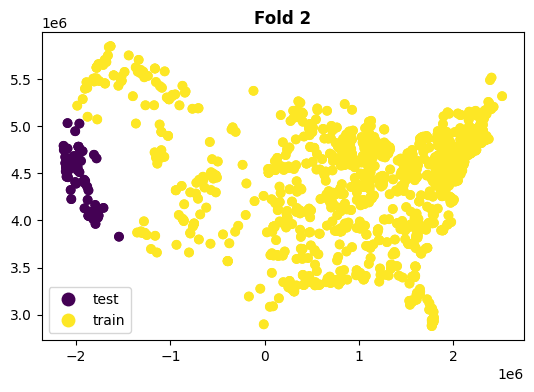

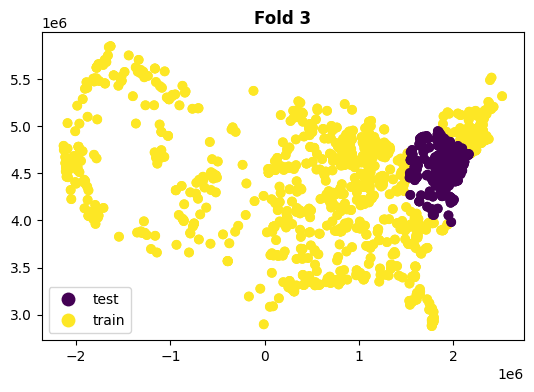

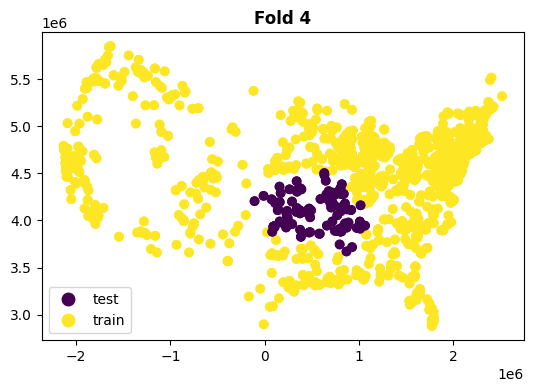

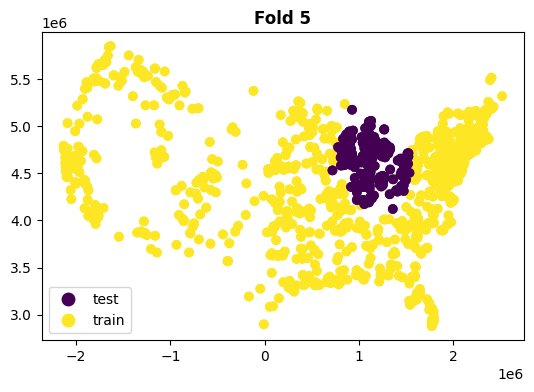

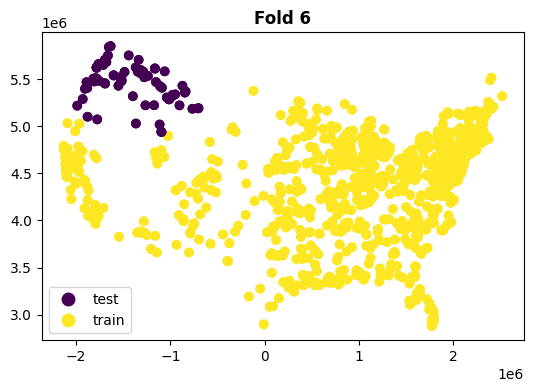

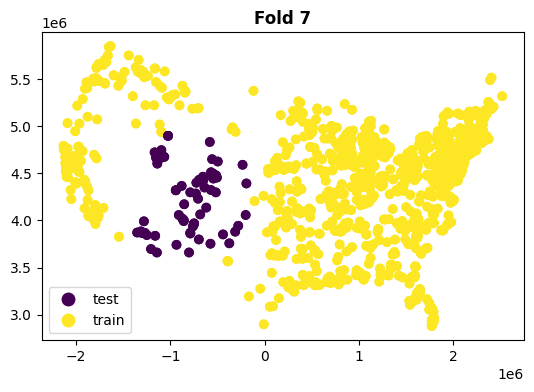

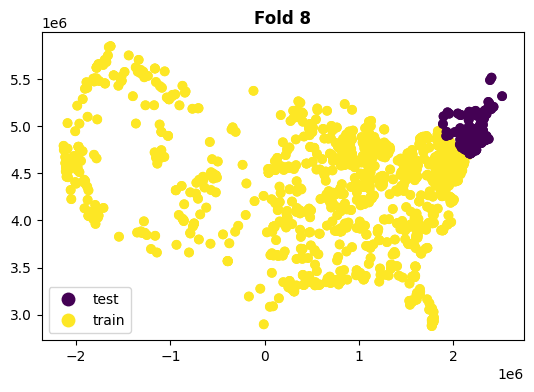

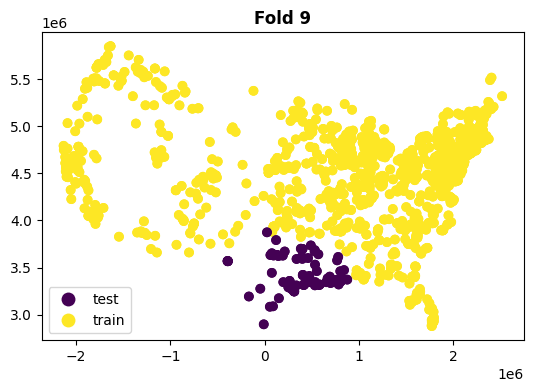

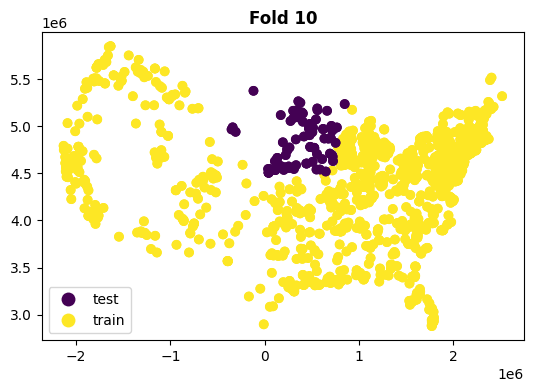

In [7]:
#Split for Spatial Clustering
for i in range(1,11):
    fig, ax = plt.subplots(1, 1 ,figsize=(9, 4))

    spatial_kfold_plot(X=federal_clusters,
                       geometry=federal_clusters.geometry,
                       groups=federal_clusters.folds,
                       fold_num=i, cmap='viridis', ax=ax)

The following code defines the features as constants and the indicator column as the variable of interest, then tells us the shape of the data - excludes everything like lat/lon column, id, county, and shape.


In [8]:
# 1. Define the percentiles exported in the GEE .csv files
percentiles = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# 2. Create the list of feature columns matching the Axx_pxx format
feature_cols = []
for i in range(64):
    # Format band name to A00, A01... A63
    band_name = f"A0{i}" if i < 10 else f"A{i}"

    for p in percentiles:
        # Construct the column name like A00_p30
        col_name = f"{band_name}_p{p}"

        # Only add it if it actually exists in your merged dataframe
        if col_name in federal_prj.columns:
            feature_cols.append(col_name)

# 3. Define your target variable
y = federal_prj['indicator']

# 4. Filter your features to only include those in the list
X = federal_prj[feature_cols]

print(f"Total features identified: {len(feature_cols)}")

Total features identified: 704


In [9]:
#Check: make sure feature_cols consists of the correct A_ labels
print(feature_cols)

['A00_p0', 'A00_p10', 'A00_p20', 'A00_p30', 'A00_p40', 'A00_p50', 'A00_p60', 'A00_p70', 'A00_p80', 'A00_p90', 'A00_p100', 'A01_p0', 'A01_p10', 'A01_p20', 'A01_p30', 'A01_p40', 'A01_p50', 'A01_p60', 'A01_p70', 'A01_p80', 'A01_p90', 'A01_p100', 'A02_p0', 'A02_p10', 'A02_p20', 'A02_p30', 'A02_p40', 'A02_p50', 'A02_p60', 'A02_p70', 'A02_p80', 'A02_p90', 'A02_p100', 'A03_p0', 'A03_p10', 'A03_p20', 'A03_p30', 'A03_p40', 'A03_p50', 'A03_p60', 'A03_p70', 'A03_p80', 'A03_p90', 'A03_p100', 'A04_p0', 'A04_p10', 'A04_p20', 'A04_p30', 'A04_p40', 'A04_p50', 'A04_p60', 'A04_p70', 'A04_p80', 'A04_p90', 'A04_p100', 'A05_p0', 'A05_p10', 'A05_p20', 'A05_p30', 'A05_p40', 'A05_p50', 'A05_p60', 'A05_p70', 'A05_p80', 'A05_p90', 'A05_p100', 'A06_p0', 'A06_p10', 'A06_p20', 'A06_p30', 'A06_p40', 'A06_p50', 'A06_p60', 'A06_p70', 'A06_p80', 'A06_p90', 'A06_p100', 'A07_p0', 'A07_p10', 'A07_p20', 'A07_p30', 'A07_p40', 'A07_p50', 'A07_p60', 'A07_p70', 'A07_p80', 'A07_p90', 'A07_p100', 'A08_p0', 'A08_p10', 'A08_p20',

In [10]:
#Check: see the number of 1s and 0s in your data
print(gdf_test['indicator'].value_counts())

indicator
1    1618
0    1598
Name: count, dtype: int64


The following code randomly splits the dataframe to see performance. Then it does a k-folds test to see how it performs when we change to spatial clustering.

The next bits are for random: turns it into a logistic (binary) regression, randomly splits data into train and test. This is not where the spatial clustering testing is done, it's more of a baseline.

In [11]:
# 1. Define your base model
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)

# Wrap it with FixedThresholdClassifier -- changes by what share of random zeros we have
custom_threshold_clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# --- 2. Keep the Cross-Validation Split ---
# kf remains the same (Random KFold)
# Fix: Use StratifiedKFold to ensure each fold has both classes, especially with imbalanced data.
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# --- 3. Change Scoring to Classificationa Metrics ---
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss' # A classification equivalent of mean squared error
]

# --- 4. Evaluate the model and collect the results ---
random_n_scores = cross_validate(
    custom_threshold_clf,
    X,
    y.values.ravel(),
    scoring=classification_scoring,
    cv=kf,
    n_jobs=-1,
    error_score='raise'
)

# Output the results dictionary
print("--- Cross-Validation Results (Classification) ---")
print(random_n_scores)

--- Cross-Validation Results (Classification) ---
{'fit_time': array([0.76103115, 0.4450407 , 0.53611207, 0.38055897, 0.89936185,
       0.60844064, 0.82422757, 0.78391719, 0.57388759, 0.52915359]), 'score_time': array([0.10169363, 0.06424212, 0.11983323, 0.03267121, 0.0833168 ,
       0.14696741, 0.03323936, 0.06477165, 0.07576036, 0.03188777]), 'test_roc_auc': array([0.61616512, 0.61257716, 0.6216821 , 0.57287809, 0.590625  ,
       0.62955247, 0.60113363, 0.56025313, 0.64875776, 0.53920807]), 'test_accuracy': array([0.59627329, 0.5931677 , 0.56521739, 0.55900621, 0.58074534,
       0.60869565, 0.57632399, 0.5576324 , 0.59813084, 0.55140187]), 'test_precision': array([0.60126582, 0.59872611, 0.56179775, 0.56024096, 0.57803468,
       0.60465116, 0.58333333, 0.55882353, 0.60526316, 0.54913295]), 'test_neg_log_loss': array([-0.67590688, -0.67837404, -0.67763575, -0.70517149, -0.70239897,
       -0.66587782, -0.6800886 , -0.7060643 , -0.65709329, -0.71501891])}


Generation of cross-validated ROC curve- adapted from https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc_crossval.html

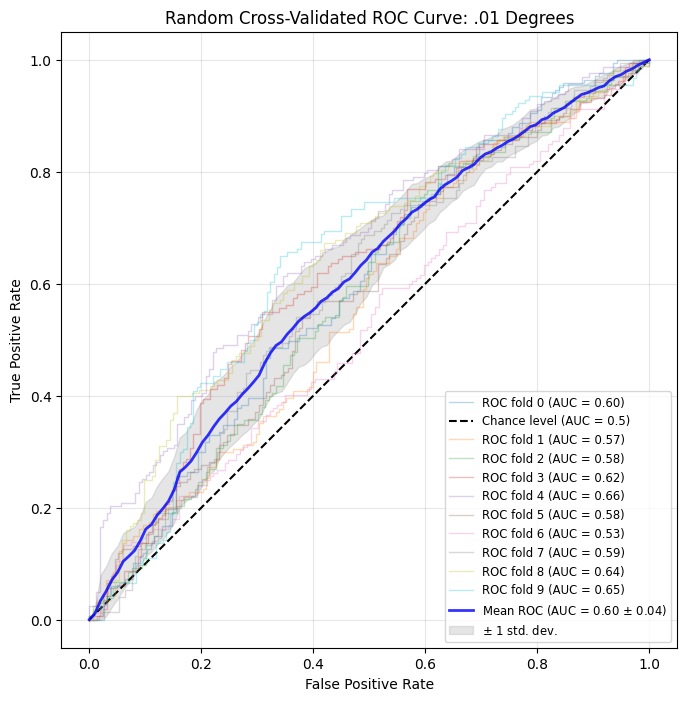

In [12]:
plt.close('all')
# --- 1. Setup ---
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)
clf = FixedThresholdClassifier(base_clf, threshold=0.5)
cv = KFold(n_splits=10, shuffle=True, random_state=123)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# --- 2. The Cross-Validation Loop ---
for fold, (train, test) in enumerate(cv.split(X, y)):
    # Fit on training data
    clf.fit(X.iloc[train], y.iloc[train].values.ravel())

    # Generate the curve for this fold
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test],
        y.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3, # Faded lines for individual folds
        lw=1,
        ax=ax,
        plot_chance_level=(fold == 0) # Only plot the 'Luck' line once
    )

    # Interpolate TPR to a common FPR grid to allow averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 3. Calculate Mean and Std Dev  ---
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

# Plot the strong Mean ROC line
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

# Add the shaded confidence interval (Standard Deviation)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

# --- 4. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Random Cross-Validated ROC Curve: .01 Degrees"
)
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()



K Fold Testing: these give us values to tell us how well the model does across spatial folds

In [13]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Random Results: Full Numerical Assessment ---")
print(spatial_summary.round(4))

#These results will be added to the final dataframe

--- Random Results: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.5993     0.5801    0.5787    0.6864
Median       0.6069     0.5807    0.5785    0.6792
Std Dev      0.0337     0.0216    0.0199    0.0194
Min (Worst)  0.5392     0.5491    0.5514    0.6571
Max (Best)   0.6488     0.6053    0.6087    0.7150
Q1 (25%)     0.5773     0.5606    0.5606    0.6763
Q3 (75%)     0.6203     0.6006    0.5955    0.7045


The following code does "leave one out" cross validation- trains the model on 9/10 sites and then tests it on the 10th. Uses a manual loop in case one fold contains only 0s.


In [14]:
# --- RE-ESTABLISHING federal_prj_filtered ---

# 1. Merge the cluster/fold info into your main data
federal_prj = gdf_test.merge(federal_clusters[['id', 'folds']], on='id')

# 2. Identify and Drop empty folds (Option 1)
fold_summary = federal_prj.groupby('folds')['indicator'].sum()
empty_folds = fold_summary[fold_summary == 0].index.tolist()

print(f"Empty folds found: {empty_folds}")

# 3. Create the variable the model is looking for
federal_prj_filtered = federal_prj[~federal_prj['folds'].isin(empty_folds)].copy()

print(f"Variable 'federal_prj_filtered' is now defined with {len(federal_prj_filtered)} rows.")

Empty folds found: []
Variable 'federal_prj_filtered' is now defined with 3216 rows.


In [15]:
X = federal_prj_filtered[feature_cols]
y = federal_prj_filtered['indicator']
groups = federal_prj_filtered['folds']

logo = LeaveOneGroupOut()
clf = LogisticRegression(max_iter=5000, C=1.0, random_state=123)

# Lists to store metrics for each fold
aucs, accs, precs, log_losses = [], [], [], []
skipped_folds = []

print(f"Starting Spatial CV on {len(X)} samples...\n")

for train_idx, test_idx in logo.split(X, y, groups=groups):
    current_fold = groups.iloc[test_idx].unique()[0]
    y_test = y.iloc[test_idx]

    # 1. Skip check for single-label test sets
    if len(np.unique(y_test)) < 2:
        print(f"Fold {current_fold}: SKIPPED (No variance in test labels)")
        skipped_folds.append(current_fold)
        continue

    # 2. Train
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # 3. Predict (Probabilities for AUC/Log-Loss, Classes for Acc/Precision)
    y_probs = clf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = clf.predict(X.iloc[test_idx])

    # 4. Calculate and store metrics
    aucs.append(roc_auc_score(y_test, y_probs))
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=0))
    # neg_log_loss is -1 * log_loss
    log_losses.append(-log_loss(y_test, clf.predict_proba(X.iloc[test_idx])))

    print(f"Fold {current_fold}: PROCESSED (AUC: {aucs[-1]:.4f})")

# --- Final Summary Table ---
print(f"\n--- Final Results (Averages across {len(aucs)} folds) ---")
print(f"ROC-AUC:       {np.mean(aucs):.4f}")
print(f"Accuracy:      {np.mean(accs):.4f}")
print(f"Precision:     {np.mean(precs):.4f}")
print(f"Neg. Log Loss: {np.mean(log_losses):.4f}")

if skipped_folds:
    print(f"\nNote: Folds {skipped_folds} were excluded from these averages.")

Starting Spatial CV on 3216 samples...

Fold 1: PROCESSED (AUC: 0.5840)
Fold 2: PROCESSED (AUC: 0.6579)
Fold 3: PROCESSED (AUC: 0.6225)
Fold 4: PROCESSED (AUC: 0.5590)
Fold 5: PROCESSED (AUC: 0.6225)
Fold 6: PROCESSED (AUC: 0.6403)
Fold 7: PROCESSED (AUC: 0.5566)
Fold 8: PROCESSED (AUC: 0.6864)
Fold 9: PROCESSED (AUC: 0.5886)
Fold 10: PROCESSED (AUC: 0.5894)

--- Final Results (Averages across 10 folds) ---
ROC-AUC:       0.6107
Accuracy:      0.5866
Precision:     0.5878
Neg. Log Loss: -0.6852


Starting Spatial CV on 3216 samples with 10 clusters...



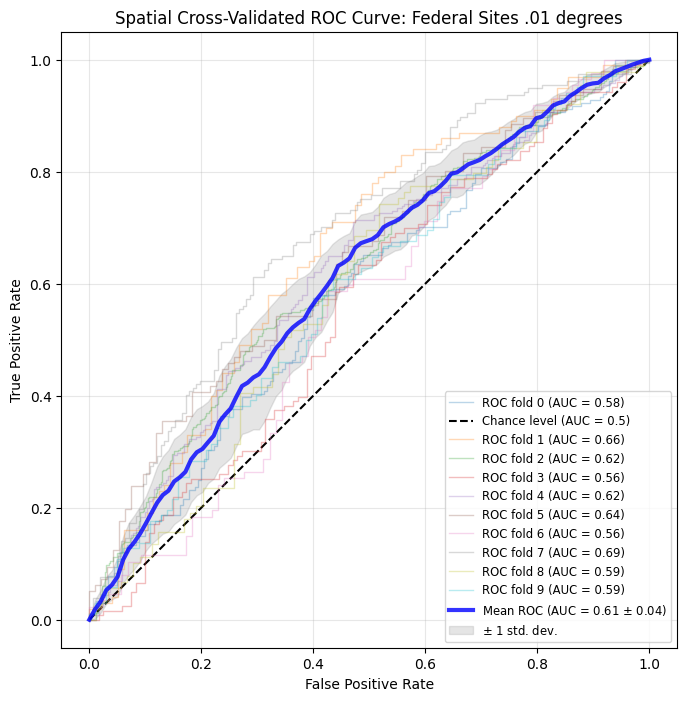

In [16]:
plt.close('all')

# --- 1. SETUP ---
logo = LeaveOneGroupOut()
tprs = [] # True Positive Rates
aucs = [] # Area Under the Curves
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# Use the features (X), labels (y), and spatial groups defined earlier
print(f"Starting Spatial CV on {len(X)} samples with {len(groups.unique())} clusters...\n")

# --- 2. The Spatial LOGO Loop ---
for fold, (train_idx, test_idx) in enumerate(logo.split(X, y, groups=groups)):
    y_test = y.iloc[test_idx]
    if len(np.unique(y_test)) < 2:
        continue

    # Train on everything EXCEPT the current cluster
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # Plot individual fold curve (thin, pastel colors)
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test_idx],
        y.iloc[test_idx],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        # Plot the dotted chance level line ONLY for the first valid fold
        plot_chance_level=(len(tprs) == 0)
    )

    # 3. INTERPOLATION for averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0 # Force curve to start at 0,0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 4. CACLULATE SPATIAL MEAN & VARIANCE ---
if tprs:
    # Calculate the mean of the True Positive Rates across all spatial folds
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    # Calculate Area under the MEAN curve (a slightly more robust statistic)
    mean_auc = auc(mean_fpr, mean_tpr)
    # Calculate Standard Deviation of the AUC values
    std_auc = np.std(aucs)

    # Plot the thick blue Mean ROC line
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="blue",
        # Text from the example: AUC = Mean ± StdDev
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=3, # Thick line
        alpha=0.8,
    )

    # Calculate and Plot the Shaded Variance Region (Standard Deviation)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1) # Keep upper boundary <= 1
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0) # Keep lower boundary >= 0

    # Fill the region
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

# --- 5. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Spatial Cross-Validated ROC Curve: Federal Sites .01 degrees"
)

# Use small legend and multiple columns to fit all the folds, matching the look
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

# Display the plot
plt.show()

Black-box run through - no information about specific folds.


In [17]:
from sklearn.linear_model import LogisticRegression # We will use this untrained estimator
from sklearn.model_selection import LeaveOneGroupOut, cross_validate, FixedThresholdClassifier

# Assuming 'federal_prj_filtered' and 'federal_clusters' are available from previous cells.
# 'X' and 'y' are derived from 'federal_prj_filtered'.

# --- 0. Pre-filter data for cross_validate to avoid single-class test folds ---
# Identify groups that contain only one unique label (0 or 1)
# This is crucial for metrics like log_loss and roc_auc, which require at least two classes.
# We use federal_prj_filtered because X and y are based on it.
unique_labels_per_fold = federal_prj_filtered.groupby('folds')['indicator'].nunique()
problematic_folds_ids = unique_labels_per_fold[unique_labels_per_fold == 1].index.tolist()

# Filter X, y, and the groups array if problematic folds are found
if problematic_folds_ids:
    print(f"Warning: The following folds contain only one class and will be excluded from `cross_validate`: {problematic_folds_ids}")
    # Create a boolean mask for the rows to keep
    mask = ~federal_prj_filtered['folds'].isin(problematic_folds_ids)

    X_filtered = X[mask]
    y_filtered = y[mask]
    # Re-create spatial_folds_filtered to ensure it matches the filtered X and y
    spatial_folds_filtered = federal_prj_filtered[mask]['folds'].values.ravel()
else:
    X_filtered = X
    y_filtered = y
    spatial_folds_filtered = federal_prj_filtered['folds'].values.ravel() # Ensure this is always from federal_prj_filtered


# --- 1. Define the Estimator and Cross-Validator ---

# FIX: Use a fresh LogisticRegression estimator.
# We add stability settings (max_iter) and set regularization (C) to default.
clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# Initiate the Leave One Group Out cross-validator
group_cvs = LeaveOneGroupOut()

# --- 2. Evaluate the model and collect the results ---

# Use Classification Scoring
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss'
]

print("Starting Leave One Group Out (Spatial) Cross-Validation...")
# We pass the groups array directly to the 'groups' parameter of cross_validate.
spatial_cluster_scores = cross_validate(
    clf, # Uses the new LogisticRegression estimator
    X_filtered, # Use filtered X
    y_filtered.values.ravel(), # Use filtered y
    scoring=classification_scoring,
    cv=group_cvs,  # Pass the LOGO object
    groups=spatial_folds_filtered, # Pass the filtered spatial group IDs
    n_jobs=-1,
    error_score='raise'
)

print("\n--- Spatial Cross-Validation Complete ---")
print(f"Number of folds run: {len(spatial_cluster_scores['test_roc_auc'])}")
print("Results Summary:")
print(spatial_cluster_scores)

Starting Leave One Group Out (Spatial) Cross-Validation...

--- Spatial Cross-Validation Complete ---
Number of folds run: 10
Results Summary:
{'fit_time': array([0.308249  , 0.57423711, 0.17596483, 0.44121766, 0.34732842,
       0.59576964, 0.37295532, 0.41682935, 0.31187439, 0.23143554]), 'score_time': array([0.03720045, 0.07186651, 0.03698087, 0.0670917 , 0.06202316,
       0.03602552, 0.03276062, 0.07526422, 0.0284965 , 0.03268051]), 'test_roc_auc': array([0.58403929, 0.65793814, 0.62254076, 0.55895989, 0.62251644,
       0.64034498, 0.5566125 , 0.68635644, 0.58856205, 0.58940012]), 'test_accuracy': array([0.54293629, 0.6142132 , 0.57997699, 0.57377049, 0.60780287,
       0.6031746 , 0.55747126, 0.6433121 , 0.56741573, 0.57635468]), 'test_precision': array([0.53252033, 0.58219178, 0.58239278, 0.56462585, 0.60465116,
       0.65671642, 0.55952381, 0.63473054, 0.58108108, 0.58      ]), 'test_neg_log_loss': array([-0.69457046, -0.68850979, -0.67405313, -0.71245932, -0.6768949 ,
      

In [18]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---")
print(spatial_summary.round(4))

#These results will be added to the final dataframe

--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.6107     0.5878    0.5866    0.6852
Median       0.6060     0.5816    0.5782    0.6879
Std Dev      0.0426     0.0362    0.0301    0.0191
Min (Worst)  0.5566     0.5325    0.5429    0.6463
Max (Best)   0.6864     0.6567    0.6433    0.7125
Q1 (25%)     0.5852     0.5685    0.5690    0.6748
Q3 (75%)     0.6359     0.5991    0.6066    0.6936


In [19]:
# The global list 'all_results_data' and 'add_result_row' function are defined in a previous cell.

# --- Calculate summary statistics for Random CV (0% case) ---
df_random_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Random CV'
})
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
random_summary_0 = df_random_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
random_summary_0.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# spatial_summary is already available from previous cell
# Re-create it here for clarity and to ensure it uses the correct data
df_spatial_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})
spatial_summary_0 = df_spatial_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
spatial_summary_0.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# --- POPULATING WITH YOUR PROVIDED NUMBERS (0% data)

# 0% - Auto-populated with current run results
add_result_row(0, 'Random', 'auc', random_summary_0.loc['Mean', 'auc'], random_summary_0.loc['Median', 'auc'], random_summary_0.loc['Std Dev', 'auc'], random_summary_0.loc['Min (Worst)', 'auc'], random_summary_0.loc['Max (Best)', 'auc'], random_summary_0.loc['Q1 (25%)', 'auc'], random_summary_0.loc['Q3 (75%)', 'auc'])
add_result_row(0, 'Random', 'precision', random_summary_0.loc['Mean', 'precision'], random_summary_0.loc['Median', 'precision'], random_summary_0.loc['Std Dev', 'precision'], random_summary_0.loc['Min (Worst)', 'precision'], random_summary_0.loc['Max (Best)', 'precision'], random_summary_0.loc['Q1 (25%)', 'precision'], random_summary_0.loc['Q3 (75%)', 'precision'])
add_result_row(0, 'Random', 'accuracy', random_summary_0.loc['Mean', 'accuracy'], random_summary_0.loc['Median', 'accuracy'], random_summary_0.loc['Std Dev', 'accuracy'], random_summary_0.loc['Min (Worst)', 'accuracy'], random_summary_0.loc['Max (Best)', 'accuracy'], random_summary_0.loc['Q1 (25%)', 'accuracy'], random_summary_0.loc['Q3 (75%)', 'accuracy'])
add_result_row(0, 'Random', 'log_loss', random_summary_0.loc['Mean', 'log_loss'], random_summary_0.loc['Median', 'log_loss'], random_summary_0.loc['Std Dev', 'log_loss'], random_summary_0.loc['Min (Worst)', 'log_loss'], random_summary_0.loc['Max (Best)', 'log_loss'], random_summary_0.loc['Q1 (25%)', 'log_loss'], random_summary_0.loc['Q3 (75%)', 'log_loss'])
add_result_row(0, 'K fold', 'auc', spatial_summary_0.loc['Mean', 'auc'], spatial_summary_0.loc['Median', 'auc'], spatial_summary_0.loc['Std Dev', 'auc'], spatial_summary_0.loc['Min (Worst)', 'auc'], spatial_summary_0.loc['Max (Best)', 'auc'], spatial_summary_0.loc['Q1 (25%)', 'auc'], spatial_summary_0.loc['Q3 (75%)', 'auc'])
add_result_row(0, 'K fold', 'precision', spatial_summary_0.loc['Mean', 'precision'], spatial_summary_0.loc['Median', 'precision'], spatial_summary_0.loc['Std Dev', 'precision'], spatial_summary_0.loc['Min (Worst)', 'precision'], spatial_summary_0.loc['Max (Best)', 'precision'], spatial_summary_0.loc['Q1 (25%)', 'precision'], spatial_summary_0.loc['Q3 (75%)', 'precision'])
add_result_row(0, 'K fold', 'accuracy', spatial_summary_0.loc['Mean', 'accuracy'], spatial_summary_0.loc['Median', 'accuracy'], spatial_summary_0.loc['Std Dev', 'accuracy'], spatial_summary_0.loc['Min (Worst)', 'accuracy'], spatial_summary_0.loc['Max (Best)', 'accuracy'], spatial_summary_0.loc['Q1 (25%)', 'accuracy'], spatial_summary_0.loc['Q3 (75%)', 'accuracy'])
add_result_row(0, 'K fold', 'log_loss', spatial_summary_0.loc['Mean', 'log_loss'], spatial_summary_0.loc['Median', 'log_loss'], spatial_summary_0.loc['Std Dev', 'log_loss'], spatial_summary_0.loc['Min (Worst)', 'log_loss'], spatial_summary_0.loc['Max (Best)', 'log_loss'], spatial_summary_0.loc['Q1 (25%)', 'log_loss'], spatial_summary_0.loc['Q3 (75%)', 'log_loss'])

df_long = pd.DataFrame(all_results_data)

# Display the head of the DataFrame to verify its content
display(df_long.head())

,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
0,0,Random,auc,0.599283,0.606855,0.033723,0.539208,0.648758,0.577315,0.620303
1,0,Random,precision,0.580127,0.580684,0.021568,0.549133,0.605263,0.560630,0.600631
2,0,Random,accuracy,0.578659,0.578535,0.019899,0.551402,0.608696,0.560559,0.595497
3,0,Random,log_loss,0.686363,0.679231,0.019394,0.657093,0.715019,0.676339,0.704478
4,0,K fold,auc,0.610727,0.605958,0.042650,0.556612,0.686356,0.585170,0.635894


#For 1% 0s

In [20]:
#For 1%
#------USER INPUT--------#
#input the folder path where your GEE .csv files are stored
folder_path = '/content/drive/MyDrive/Research/Young/MOSAIKS/superfund_project_summer2026/Data/Intermediate/Spatial K Folds/Federal/1/'
file_pattern = os.path.join(folder_path, 'GEE_featurization_federal_*.csv') #name pattern of files from GEE
file_list = glob.glob(file_pattern)

print(f"Found {len(file_list)} files to combine.")

# 3. Read each file into a list of DataFrames
df_list = [pd.read_csv(f) for f in file_list]

# 4. Concatenate (stack) them into one master DataFrame
full_df = pd.concat(df_list, ignore_index=True)

# 5. Check the final count to make sure it matches your # of points
print(f"Final combined row count: {len(full_df)}")
full_df.head()

gdf_test=full_df

Found 7 files to combine.
Final combined row count: 3232


FIXING: Converting gdf_test from DataFrame to GeoDataFrame.
Re-projecting data to UTM for accurate clustering...
Starting spatial clustering into 10 folds (3232 points)...


/tmp/ipykernel_2629/2168819861.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cols_tab = cm.get_cmap('tab20', 10)


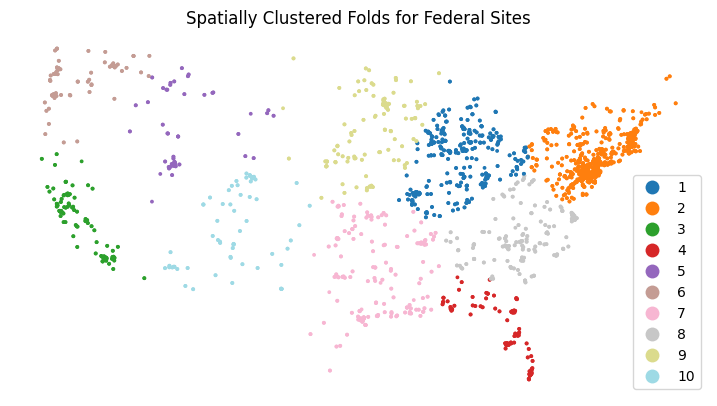

Clustering complete. Found 10 unique folds.


In [21]:
#Spatial Clustering

# 0. Re-initialize gdf_test from the original full_df, ensuring 'indicator' is present
#    and it is a pandas DataFrame, so the subsequent `if` block correctly converts it.
gdf_test = full_df.copy()

# Assuming 'gdf_test' currently exists as a Pandas DataFrame with 'lon'/'lat'
# First, ensure gdf_test is a GeoDataFrame, potentially converting it.
if not isinstance(gdf_test, gpd.GeoDataFrame) or 'geometry' not in gdf_test.columns:
    print("FIXING: Converting gdf_test from DataFrame to GeoDataFrame.")

    # 1. Define bands (assuming they start with 'A')
    bands = [col for col in gdf_test.columns if col.startswith('A')]

    # 2. DROP NaN ROWS HERE
    initial_len = len(gdf_test)
    gdf_test = gdf_test.dropna(subset=bands).reset_index(drop=True)
    dropped = initial_len - len(gdf_test)
    if dropped > 0:
        print(f"Dropped {dropped} rows with NaN satellite features.")

    # 3. Recreate the GeoDataFrame structure
    gdf_test = gpd.GeoDataFrame(
        gdf_test,
        geometry=gpd.points_from_xy(gdf_test['lon'], gdf_test['lat']),
        crs="EPSG:4326"
    )

# 4. Add an 'id' column: This MUST be done after gdf_test is definitively a GeoDataFrame
# and before it's used for clustering, as previous map cells don't add it.
gdf_test['id'] = range(len(gdf_test))

# --- 1. PREPARE GEODATAFRAME for Clustering ---
# The estimate_utm_crs() requires a GeoDataFrame input.
print("Re-projecting data to UTM for accurate clustering...")
federal_prj = gdf_test.copy().to_crs(gdf_test.estimate_utm_crs())

# --- 2. SPATIAL CLUSTER RESAMPLING ---
print(f"Starting spatial clustering into 10 folds ({len(federal_prj)} points)...")

federal_clusters = spatial_kfold_clusters(
  gdf=federal_prj,
  name='id',
  nfolds=10,
  algorithm='kmeans',
  n_init="auto",
  random_state=569
  )

# --- 3. PLOTTING ---
# Get the 'tab20' colormap
cols_tab = cm.get_cmap('tab20', 10)
cols = [cols_tab(i) for i in range(10)]
color_ramp = ListedColormap(cols)

# Create a final GeoDataFrame containing the original CRS and the new fold information
federal_clusters_map = gdf_test.merge(
    federal_clusters[['id', 'folds']],
    left_on='id',
    right_on='id'
)

fig, ax = plt.subplots(1,1 , figsize=(9, 9))
federal_clusters_map.plot(
    column='folds',
    ax=ax,
    cmap=color_ramp,
    markersize=3,
    legend=True,
    categorical=True
)
ax.set_title('Spatially Clustered Folds for Federal Sites')
ax.set_axis_off()

plt.show()

print(f"Clustering complete. Found {federal_clusters['folds'].nunique()} unique folds.")

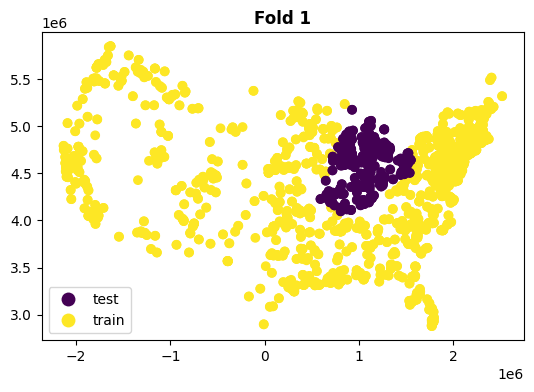

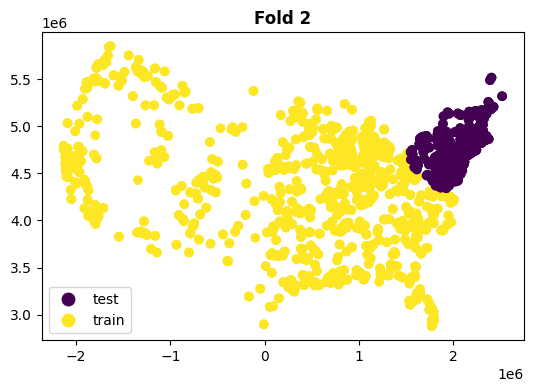

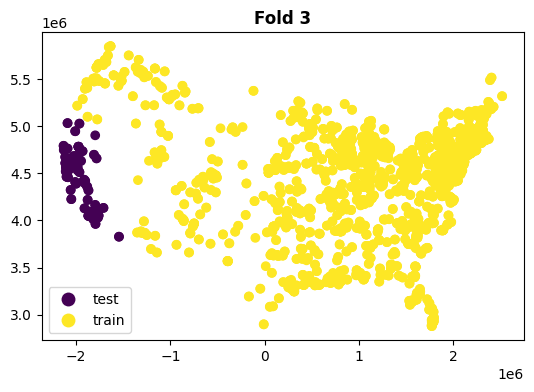

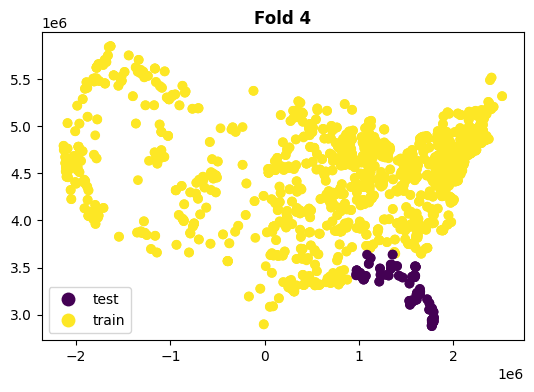

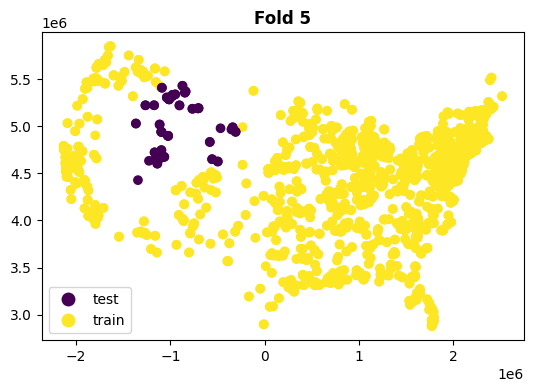

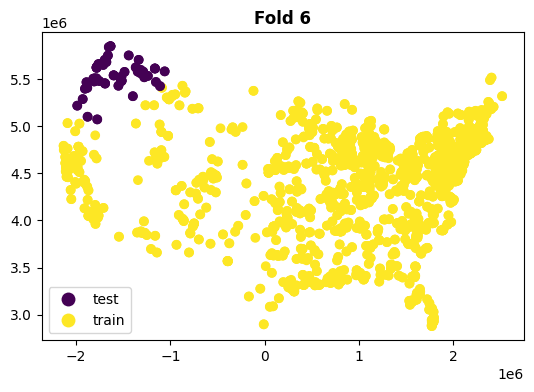

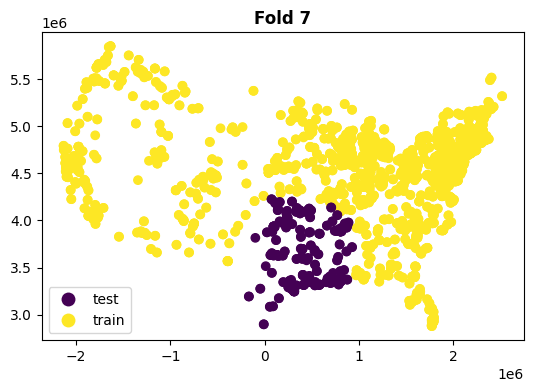

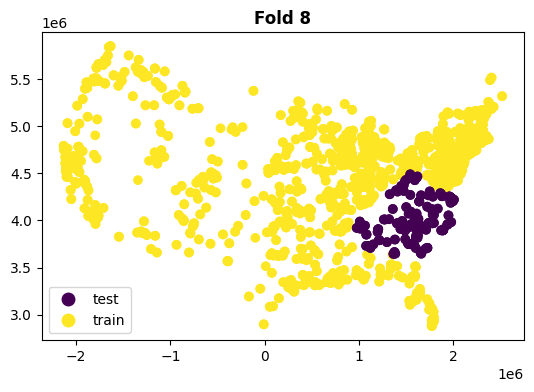

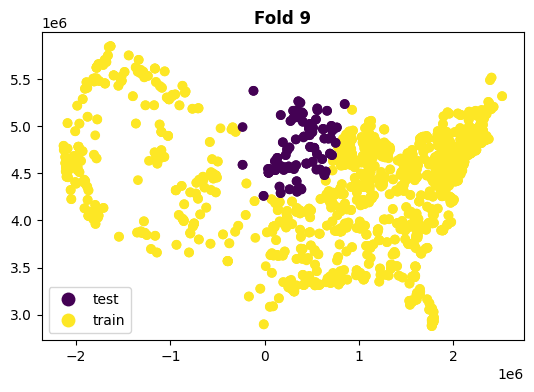

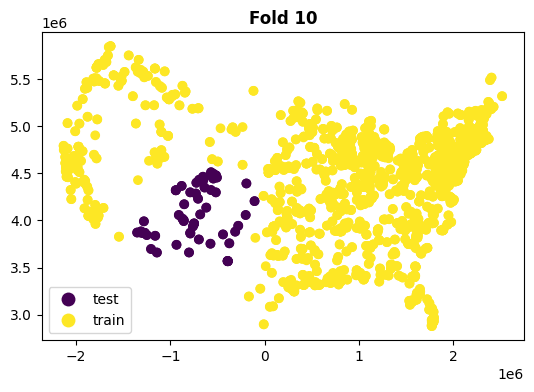

In [22]:
#Split for Spatial Clustering
for i in range(1,11):
    fig, ax = plt.subplots(1, 1 ,figsize=(9, 4))

    spatial_kfold_plot(X=federal_clusters,
                       geometry=federal_clusters.geometry,
                       groups=federal_clusters.folds,
                       fold_num=i, cmap='viridis', ax=ax)

In [23]:
# 1. Define the percentiles exported in the GEE .csv files
percentiles = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# 2. Create the list of feature columns matching the Axx_pxx format
feature_cols = []
for i in range(64):
    # Format band name to A00, A01... A63
    band_name = f"A0{i}" if i < 10 else f"A{i}"

    for p in percentiles:
        # Construct the column name like A00_p30
        col_name = f"{band_name}_p{p}"

        # Only add it if it actually exists in your merged dataframe
        if col_name in federal_prj.columns:
            feature_cols.append(col_name)

# 3. Define your target variable
y = federal_prj['indicator']

# 4. Filter your features to only include those in the list
X = federal_prj[feature_cols]

print(f"Total features identified: {len(feature_cols)}")

Total features identified: 704


In [24]:
#Check:
print(feature_cols)

['A00_p0', 'A00_p10', 'A00_p20', 'A00_p30', 'A00_p40', 'A00_p50', 'A00_p60', 'A00_p70', 'A00_p80', 'A00_p90', 'A00_p100', 'A01_p0', 'A01_p10', 'A01_p20', 'A01_p30', 'A01_p40', 'A01_p50', 'A01_p60', 'A01_p70', 'A01_p80', 'A01_p90', 'A01_p100', 'A02_p0', 'A02_p10', 'A02_p20', 'A02_p30', 'A02_p40', 'A02_p50', 'A02_p60', 'A02_p70', 'A02_p80', 'A02_p90', 'A02_p100', 'A03_p0', 'A03_p10', 'A03_p20', 'A03_p30', 'A03_p40', 'A03_p50', 'A03_p60', 'A03_p70', 'A03_p80', 'A03_p90', 'A03_p100', 'A04_p0', 'A04_p10', 'A04_p20', 'A04_p30', 'A04_p40', 'A04_p50', 'A04_p60', 'A04_p70', 'A04_p80', 'A04_p90', 'A04_p100', 'A05_p0', 'A05_p10', 'A05_p20', 'A05_p30', 'A05_p40', 'A05_p50', 'A05_p60', 'A05_p70', 'A05_p80', 'A05_p90', 'A05_p100', 'A06_p0', 'A06_p10', 'A06_p20', 'A06_p30', 'A06_p40', 'A06_p50', 'A06_p60', 'A06_p70', 'A06_p80', 'A06_p90', 'A06_p100', 'A07_p0', 'A07_p10', 'A07_p20', 'A07_p30', 'A07_p40', 'A07_p50', 'A07_p60', 'A07_p70', 'A07_p80', 'A07_p90', 'A07_p100', 'A08_p0', 'A08_p10', 'A08_p20',

In [25]:
#Check:
print(gdf_test['indicator'].value_counts())

indicator
1    1618
0    1614
Name: count, dtype: int64


In [26]:
# 1. Define your base model
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)

# Wrap it with FixedThresholdClassifier -- changes by what share of random zeros we have
custom_threshold_clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# --- 2. Keep the Cross-Validation Split ---
# kf remains the same (Random KFold)
# Fix: Use StratifiedKFold to ensure each fold has both classes, especially with imbalanced data.
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# --- 3. Change Scoring to Classificationa Metrics ---
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss' # A classification equivalent of mean squared error
]

# --- 4. Evaluate the model and collect the results ---
random_n_scores = cross_validate(
    custom_threshold_clf,
    X,
    y.values.ravel(),
    scoring=classification_scoring,
    cv=kf,
    n_jobs=-1,
    error_score='raise'
)

# Output the results dictionary
print("--- Cross-Validation Results (Classification) ---")
print(random_n_scores)

--- Cross-Validation Results (Classification) ---
{'fit_time': array([0.35243225, 0.38604712, 0.31682301, 0.36273718, 0.31974626,
       0.3421669 , 0.28012633, 0.29061794, 0.38034892, 0.31161833]), 'score_time': array([0.03681707, 0.03528714, 0.03504682, 0.03696036, 0.03531361,
       0.03479052, 0.03815055, 0.03521109, 0.03701115, 0.01894116]), 'test_roc_auc': array([0.63233501, 0.6023472 , 0.59554482, 0.58281573, 0.62134806,
       0.57660455, 0.59029216, 0.59489303, 0.64427575, 0.57978683]), 'test_accuracy': array([0.58024691, 0.55864198, 0.56346749, 0.56965944, 0.59752322,
       0.56037152, 0.56965944, 0.58513932, 0.61919505, 0.56656347]), 'test_precision': array([0.58227848, 0.55688623, 0.56069364, 0.56084656, 0.6025641 ,
       0.55555556, 0.57419355, 0.59589041, 0.61728395, 0.56363636]), 'test_neg_log_loss': array([-0.66703234, -0.68196736, -0.68748712, -0.70182004, -0.67732759,
       -0.69633619, -0.69203091, -0.68726141, -0.66472971, -0.69859913])}


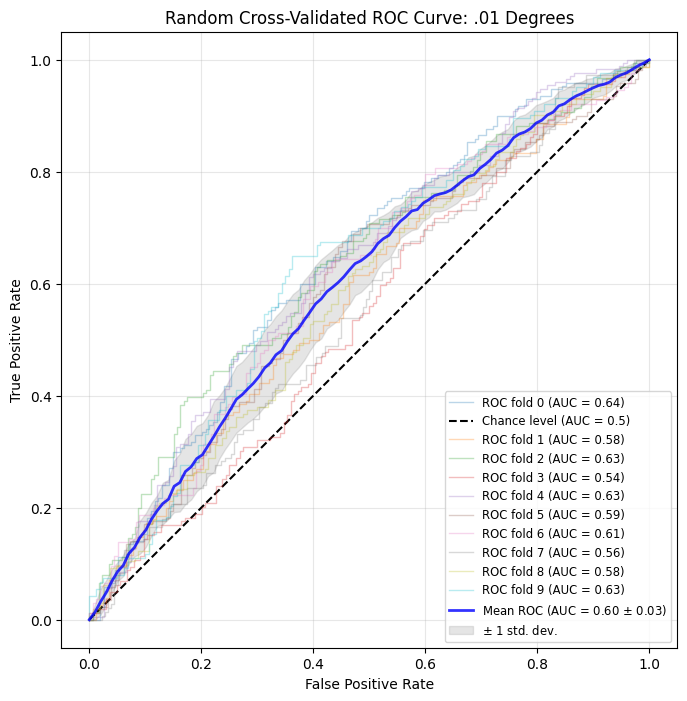

In [27]:
plt.close('all')
# --- 1. Setup ---
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)
clf = FixedThresholdClassifier(base_clf, threshold=0.5)
cv = KFold(n_splits=10, shuffle=True, random_state=123)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# --- 2. The Cross-Validation Loop ---
for fold, (train, test) in enumerate(cv.split(X, y)):
    # Fit on training data
    clf.fit(X.iloc[train], y.iloc[train].values.ravel())

    # Generate the curve for this fold
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test],
        y.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3, # Faded lines for individual folds
        lw=1,
        ax=ax,
        plot_chance_level=(fold == 0) # Only plot the 'Luck' line once
    )

    # Interpolate TPR to a common FPR grid to allow averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 3. Calculate Mean and Std Dev  ---
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

# Plot the strong Mean ROC line
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

# Add the shaded confidence interval (Standard Deviation)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

# --- 4. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Random Cross-Validated ROC Curve: .01 Degrees"
)
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [28]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Random Results: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Random Results: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.6020     0.5770    0.5770    0.6855
Median       0.5952     0.5689    0.5697    0.6874
Std Dev      0.0231     0.0217    0.0191    0.0127
Min (Worst)  0.5766     0.5556    0.5586    0.6647
Max (Best)   0.6443     0.6173    0.6192    0.7018
Q1 (25%)     0.5847     0.5607    0.5642    0.6785
Q3 (75%)     0.6166     0.5925    0.5839    0.6953


In [29]:
# --- RE-ESTABLISHING federal_prj_filtered ---

# 1. Merge the cluster/fold info into your main data
federal_prj = gdf_test.merge(federal_clusters[['id', 'folds']], on='id')

# 2. Identify and Drop empty folds (Option 1)
fold_summary = federal_prj.groupby('folds')['indicator'].sum()
empty_folds = fold_summary[fold_summary == 0].index.tolist()

print(f"Empty folds found: {empty_folds}")

# 3. Create the variable the model is looking for
federal_prj_filtered = federal_prj[~federal_prj['folds'].isin(empty_folds)].copy()

print(f"Variable 'federal_prj_filtered' is now defined with {len(federal_prj_filtered)} rows.")

Empty folds found: []
Variable 'federal_prj_filtered' is now defined with 3232 rows.


In [30]:
X = federal_prj_filtered[feature_cols]
y = federal_prj_filtered['indicator']
groups = federal_prj_filtered['folds']

logo = LeaveOneGroupOut()
clf = LogisticRegression(max_iter=5000, C=1.0, random_state=123)

# Lists to store metrics for each fold
aucs, accs, precs, log_losses = [], [], [], []
skipped_folds = []

print(f"Starting Spatial CV on {len(X)} samples...\n")

for train_idx, test_idx in logo.split(X, y, groups=groups):
    current_fold = groups.iloc[test_idx].unique()[0]
    y_test = y.iloc[test_idx]

    # 1. Skip check for single-label test sets
    if len(np.unique(y_test)) < 2:
        print(f"Fold {current_fold}: SKIPPED (No variance in test labels)")
        skipped_folds.append(current_fold)
        continue

    # 2. Train
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # 3. Predict (Probabilities for AUC/Log-Loss, Classes for Acc/Precision)
    y_probs = clf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = clf.predict(X.iloc[test_idx])

    # 4. Calculate and store metrics
    aucs.append(roc_auc_score(y_test, y_probs))
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=0))
    # neg_log_loss is -1 * log_loss
    log_losses.append(-log_loss(y_test, clf.predict_proba(X.iloc[test_idx])))

    print(f"Fold {current_fold}: PROCESSED (AUC: {aucs[-1]:.4f})")

# --- Final Summary Table ---
print(f"\n--- Final Results (Averages across {len(aucs)} folds) ---")
print(f"ROC-AUC:       {np.mean(aucs):.4f}")
print(f"Accuracy:      {np.mean(accs):.4f}")
print(f"Precision:     {np.mean(precs):.4f}")
print(f"Neg. Log Loss: {np.mean(log_losses):.4f}")

if skipped_folds:
    print(f"\nNote: Folds {skipped_folds} were excluded from these averages.")

Starting Spatial CV on 3232 samples...

Fold 1: PROCESSED (AUC: 0.6230)
Fold 2: PROCESSED (AUC: 0.6335)
Fold 3: PROCESSED (AUC: 0.6585)
Fold 4: PROCESSED (AUC: 0.6315)
Fold 5: PROCESSED (AUC: 0.6079)
Fold 6: PROCESSED (AUC: 0.6575)
Fold 7: PROCESSED (AUC: 0.5688)
Fold 8: PROCESSED (AUC: 0.6253)
Fold 9: PROCESSED (AUC: 0.5865)
Fold 10: PROCESSED (AUC: 0.5441)

--- Final Results (Averages across 10 folds) ---
ROC-AUC:       0.6137
Accuracy:      0.5842
Precision:     0.5799
Neg. Log Loss: -0.6879


Starting Spatial CV on 3232 samples with 10 clusters...



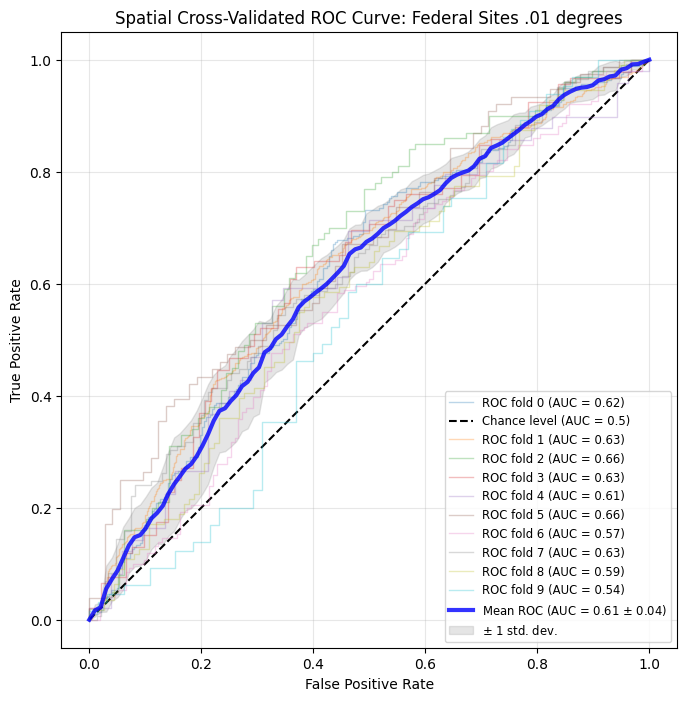

In [31]:
plt.close('all')

# --- 1. SETUP ---
logo = LeaveOneGroupOut()
tprs = [] # True Positive Rates
aucs = [] # Area Under the Curves
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# Use the features (X), labels (y), and spatial groups defined earlier
print(f"Starting Spatial CV on {len(X)} samples with {len(groups.unique())} clusters...\n")

# --- 2. The Spatial LOGO Loop ---
for fold, (train_idx, test_idx) in enumerate(logo.split(X, y, groups=groups)):
    y_test = y.iloc[test_idx]
    if len(np.unique(y_test)) < 2:
        continue

    # Train on everything EXCEPT the current cluster
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # Plot individual fold curve (thin, pastel colors)
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test_idx],
        y.iloc[test_idx],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        # Plot the dotted chance level line ONLY for the first valid fold
        plot_chance_level=(len(tprs) == 0)
    )

    # 3. INTERPOLATION for averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0 # Force curve to start at 0,0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 4. CACLULATE SPATIAL MEAN & VARIANCE ---
if tprs:
    # Calculate the mean of the True Positive Rates across all spatial folds
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    # Calculate Area under the MEAN curve (a slightly more robust statistic)
    mean_auc = auc(mean_fpr, mean_tpr)
    # Calculate Standard Deviation of the AUC values
    std_auc = np.std(aucs)

    # Plot the thick blue Mean ROC line
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="blue",
        # Text from the example: AUC = Mean ± StdDev
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=3, # Thick line
        alpha=0.8,
    )

    # Calculate and Plot the Shaded Variance Region (Standard Deviation)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1) # Keep upper boundary <= 1
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0) # Keep lower boundary >= 0

    # Fill the region
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

# --- 5. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Spatial Cross-Validated ROC Curve: Federal Sites .01 degrees" # Use your title
)

# Use small legend and multiple columns to fit all the folds, matching the look
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

# Display the plot
plt.show()

In [32]:
# Assuming 'federal_prj_filtered' and 'federal_clusters' are available from previous cells.
# 'X' and 'y' are derived from 'federal_prj_filtered'.

# --- 0. Pre-filter data for cross_validate to avoid single-class test folds ---
# Identify groups that contain only one unique label (0 or 1)
# This is crucial for metrics like log_loss and roc_auc, which require at least two classes.
# We use federal_prj_filtered because X and y are based on it.
unique_labels_per_fold = federal_prj_filtered.groupby('folds')['indicator'].nunique()
problematic_folds_ids = unique_labels_per_fold[unique_labels_per_fold == 1].index.tolist()

# Filter X, y, and the groups array if problematic folds are found
if problematic_folds_ids:
    print(f"Warning: The following folds contain only one class and will be excluded from `cross_validate`: {problematic_folds_ids}")
    # Create a boolean mask for the rows to keep
    mask = ~federal_prj_filtered['folds'].isin(problematic_folds_ids)

    X_filtered = X[mask]
    y_filtered = y[mask]
    # Re-create spatial_folds_filtered to ensure it matches the filtered X and y
    spatial_folds_filtered = federal_prj_filtered[mask]['folds'].values.ravel()
else:
    X_filtered = X
    y_filtered = y
    spatial_folds_filtered = federal_prj_filtered['folds'].values.ravel() # Ensure this is always from federal_prj_filtered


# --- 1. Define the Estimator and Cross-Validator ---

# FIX: Use a fresh LogisticRegression estimator.
# We add stability settings (max_iter) and set regularization (C) to default.
clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# Initiate the Leave One Group Out cross-validator
group_cvs = LeaveOneGroupOut()

# --- 2. Evaluate the model and collect the results ---

# Use Classification Scoring
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss'
]

print("Starting Leave One Group Out (Spatial) Cross-Validation...")
# We pass the groups array directly to the 'groups' parameter of cross_validate.
spatial_cluster_scores = cross_validate(
    clf, # Uses the new LogisticRegression estimator
    X_filtered, # Use filtered X
    y_filtered.values.ravel(), # Use filtered y
    scoring=classification_scoring,
    cv=group_cvs,  # Pass the LOGO object
    groups=spatial_folds_filtered, # Pass the filtered spatial group IDs
    n_jobs=-1,
    error_score='raise'
)

print("\n--- Spatial Cross-Validation Complete ---")
print(f"Number of folds run: {len(spatial_cluster_scores['test_roc_auc'])}")
print("Results Summary:")
print(spatial_cluster_scores)

Starting Leave One Group Out (Spatial) Cross-Validation...

--- Spatial Cross-Validation Complete ---
Number of folds run: 10
Results Summary:
{'fit_time': array([0.30553269, 0.24015641, 0.38470244, 0.38397765, 0.33862376,
       0.34491086, 0.3142879 , 0.37966657, 0.29434514, 0.29274178]), 'score_time': array([0.03476667, 0.0406723 , 0.03461838, 0.03045106, 0.03449893,
       0.031672  , 0.03770161, 0.03452682, 0.03552389, 0.01832867]), 'test_roc_auc': array([0.62302416, 0.63349599, 0.65846939, 0.63149811, 0.60792779,
       0.65753425, 0.56880537, 0.62531885, 0.5864704 , 0.54414201]), 'test_accuracy': array([0.61400359, 0.59597806, 0.63131313, 0.59782609, 0.6039604 ,
       0.61073826, 0.56393443, 0.58762887, 0.58295964, 0.45384615]), 'test_precision': array([0.60457516, 0.61842105, 0.59574468, 0.57627119, 0.57627119,
       0.69565217, 0.55696203, 0.58741259, 0.58181818, 0.40625   ]), 'test_neg_log_loss': array([-0.67649946, -0.67213971, -0.68603967, -0.67050709, -0.70064598,
      

In [33]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.6137     0.5799    0.5842    0.6879
Median       0.6242     0.5846    0.5969    0.6813
Std Dev      0.0372     0.0719    0.0494    0.0235
Min (Worst)  0.5441     0.4062    0.4538    0.6682
Max (Best)   0.6585     0.6957    0.6313    0.7461
Q1 (25%)     0.5918     0.5763    0.5841    0.6718
Q3 (75%)     0.6330     0.6024    0.6090    0.6959


In [34]:
# The global list 'all_results_data' and 'add_result_row' function are defined in a previous cell.

# --- Calculate summary statistics for Random CV (1% case) ---
df_random_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Random CV'
})
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
random_summary_1 = df_random_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
random_summary_1.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# spatial_summary is already available from previous cell
# Re-create it here for clarity and to ensure it uses the correct data
df_spatial_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})
spatial_summary_1 = df_spatial_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
spatial_summary_1.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# --- POPULATING WITH YOUR PROVIDED NUMBERS (1% data) --- (using global add_result_row)
# Percentage refers to number of 0s compared to 1s

# 1% - Auto-populated with current run results
add_result_row(1, 'Random', 'auc', random_summary_1.loc['Mean', 'auc'], random_summary_1.loc['Median', 'auc'], random_summary_1.loc['Std Dev', 'auc'], random_summary_1.loc['Min (Worst)', 'auc'], random_summary_1.loc['Max (Best)', 'auc'], random_summary_1.loc['Q1 (25%)', 'auc'], random_summary_1.loc['Q3 (75%)', 'auc'])
add_result_row(1, 'Random', 'precision', random_summary_1.loc['Mean', 'precision'], random_summary_1.loc['Median', 'precision'], random_summary_1.loc['Std Dev', 'precision'], random_summary_1.loc['Min (Worst)', 'precision'], random_summary_1.loc['Max (Best)', 'precision'], random_summary_1.loc['Q1 (25%)', 'precision'], random_summary_1.loc['Q3 (75%)', 'precision'])
add_result_row(1, 'Random', 'accuracy', random_summary_1.loc['Mean', 'accuracy'], random_summary_1.loc['Median', 'accuracy'], random_summary_1.loc['Std Dev', 'accuracy'], random_summary_1.loc['Min (Worst)', 'accuracy'], random_summary_1.loc['Max (Best)', 'accuracy'], random_summary_1.loc['Q1 (25%)', 'accuracy'], random_summary_1.loc['Q3 (75%)', 'accuracy'])
add_result_row(1, 'Random', 'log_loss', random_summary_1.loc['Mean', 'log_loss'], random_summary_1.loc['Median', 'log_loss'], random_summary_1.loc['Std Dev', 'log_loss'], random_summary_1.loc['Min (Worst)', 'log_loss'], random_summary_1.loc['Max (Best)', 'log_loss'], random_summary_1.loc['Q1 (25%)', 'log_loss'], random_summary_1.loc['Q3 (75%)', 'log_loss'])
add_result_row(1, 'K fold', 'auc', spatial_summary_1.loc['Mean', 'auc'], spatial_summary_1.loc['Median', 'auc'], spatial_summary_1.loc['Std Dev', 'auc'], spatial_summary_1.loc['Min (Worst)', 'auc'], spatial_summary_1.loc['Max (Best)', 'auc'], spatial_summary_1.loc['Q1 (25%)', 'auc'], spatial_summary_1.loc['Q3 (75%)', 'auc'])
add_result_row(1, 'K fold', 'precision', spatial_summary_1.loc['Mean', 'precision'], spatial_summary_1.loc['Median', 'precision'], spatial_summary_1.loc['Std Dev', 'precision'], spatial_summary_1.loc['Min (Worst)', 'precision'], spatial_summary_1.loc['Max (Best)', 'precision'], spatial_summary_1.loc['Q1 (25%)', 'precision'], spatial_summary_1.loc['Q3 (75%)', 'precision'])
add_result_row(1, 'K fold', 'accuracy', spatial_summary_1.loc['Mean', 'accuracy'], spatial_summary_1.loc['Median', 'accuracy'], spatial_summary_1.loc['Std Dev', 'accuracy'], spatial_summary_1.loc['Min (Worst)', 'accuracy'], spatial_summary_1.loc['Max (Best)', 'accuracy'], spatial_summary_1.loc['Q1 (25%)', 'accuracy'], spatial_summary_1.loc['Q3 (75%)', 'accuracy'])
add_result_row(1, 'K fold', 'log_loss', spatial_summary_1.loc['Mean', 'log_loss'], spatial_summary_1.loc['Median', 'log_loss'], spatial_summary_1.loc['Std Dev', 'log_loss'], spatial_summary_1.loc['Min (Worst)', 'log_loss'], spatial_summary_1.loc['Max (Best)', 'log_loss'], spatial_summary_1.loc['Q1 (25%)', 'log_loss'], spatial_summary_1.loc['Q3 (75%)', 'log_loss'])

df_long = pd.DataFrame(all_results_data)

# Display the head and tail of the DataFrame to verify its content
display(df_long.head())
display(df_long.tail())

,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
0,0,Random,auc,0.599283,0.606855,0.033723,0.539208,0.648758,0.577315,0.620303
1,0,Random,precision,0.580127,0.580684,0.021568,0.549133,0.605263,0.560630,0.600631
2,0,Random,accuracy,0.578659,0.578535,0.019899,0.551402,0.608696,0.560559,0.595497
3,0,Random,log_loss,0.686363,0.679231,0.019394,0.657093,0.715019,0.676339,0.704478
4,0,K fold,auc,0.610727,0.605958,0.042650,0.556612,0.686356,0.585170,0.635894


,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
11,1,Random,log_loss,0.685459,0.687374,0.012723,0.664730,0.701820,0.678488,0.695260
12,1,K fold,auc,0.613669,0.624172,0.037245,0.544142,0.658469,0.591835,0.632997
13,1,K fold,precision,0.579938,0.584615,0.071887,0.406250,0.695652,0.576271,0.602368
14,1,K fold,accuracy,0.584219,0.596902,0.049377,0.453846,0.631313,0.584127,0.609044
15,1,K fold,log_loss,0.687942,0.681270,0.023539,0.668249,0.746109,0.671841,0.695873


#For 5% 0s

In [35]:
#For 5%
#------USER INPUT--------#
#input the folder path where your GEE .csv files are stored
folder_path = '/content/drive/MyDrive/Research/Young/MOSAIKS/superfund_project_summer2026/Data/Intermediate/Spatial K Folds/Federal/5/'
file_pattern = os.path.join(folder_path, 'GEE_featurization_federal_*.csv') #name pattern of files from GEE
file_list = glob.glob(file_pattern)

print(f"Found {len(file_list)} files to combine.")

# 3. Read each file into a list of DataFrames
df_list = [pd.read_csv(f) for f in file_list]

# 4. Concatenate (stack) them into one master DataFrame
full_df = pd.concat(df_list, ignore_index=True)

# 5. Check the final count to make sure it matches your # of points
print(f"Final combined row count: {len(full_df)}")
full_df.head()

gdf_test=full_df

Found 7 files to combine.
Final combined row count: 3296


FIXING: Converting gdf_test from DataFrame to GeoDataFrame.
Re-projecting data to UTM for accurate clustering...
Starting spatial clustering into 10 folds (3296 points)...


/tmp/ipykernel_2629/2168819861.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cols_tab = cm.get_cmap('tab20', 10)


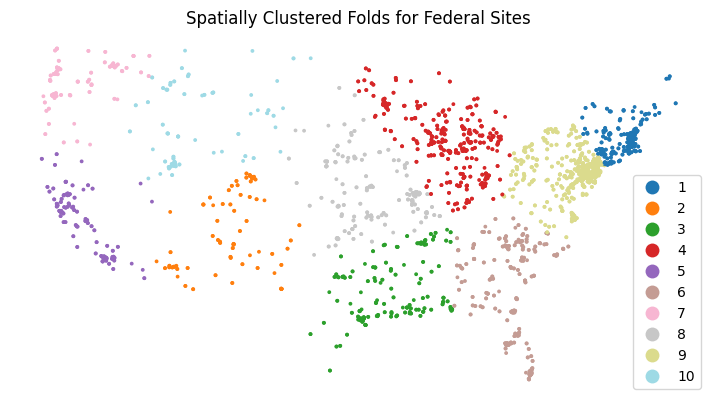

Clustering complete. Found 10 unique folds.


In [36]:
#Spatial Clustering

# 0. Re-initialize gdf_test from the original full_df, ensuring 'indicator' is present
#    and it is a pandas DataFrame, so the subsequent `if` block correctly converts it.
gdf_test = full_df.copy()

# Assuming 'gdf_test' currently exists as a Pandas DataFrame with 'lon'/'lat'
# First, ensure gdf_test is a GeoDataFrame, potentially converting it.
if not isinstance(gdf_test, gpd.GeoDataFrame) or 'geometry' not in gdf_test.columns:
    print("FIXING: Converting gdf_test from DataFrame to GeoDataFrame.")

    # 1. Define bands (assuming they start with 'A')
    bands = [col for col in gdf_test.columns if col.startswith('A')]

    # 2. DROP NaN ROWS HERE
    initial_len = len(gdf_test)
    gdf_test = gdf_test.dropna(subset=bands).reset_index(drop=True)
    dropped = initial_len - len(gdf_test)
    if dropped > 0:
        print(f"Dropped {dropped} rows with NaN satellite features.")

    # 3. Recreate the GeoDataFrame structure
    gdf_test = gpd.GeoDataFrame(
        gdf_test,
        geometry=gpd.points_from_xy(gdf_test['lon'], gdf_test['lat']),
        crs="EPSG:4326"
    )

# 4. Add an 'id' column: This MUST be done after gdf_test is definitively a GeoDataFrame
# and before it's used for clustering, as previous map cells don't add it.
gdf_test['id'] = range(len(gdf_test))

# --- 1. PREPARE GEODATAFRAME for Clustering ---
# The estimate_utm_crs() requires a GeoDataFrame input.
print("Re-projecting data to UTM for accurate clustering...")
federal_prj = gdf_test.copy().to_crs(gdf_test.estimate_utm_crs())

# --- 2. SPATIAL CLUSTER RESAMPLING ---
print(f"Starting spatial clustering into 10 folds ({len(federal_prj)} points)...")

federal_clusters = spatial_kfold_clusters(
  gdf=federal_prj,
  name='id',
  nfolds=10,
  algorithm='kmeans',
  n_init="auto",
  random_state=569
  )

# --- 3. PLOTTING ---
# Get the 'tab20' colormap
cols_tab = cm.get_cmap('tab20', 10)
cols = [cols_tab(i) for i in range(10)]
color_ramp = ListedColormap(cols)

# Create a final GeoDataFrame containing the original CRS and the new fold information
federal_clusters_map = gdf_test.merge(
    federal_clusters[['id', 'folds']],
    left_on='id',
    right_on='id'
)

fig, ax = plt.subplots(1,1 , figsize=(9, 9))
federal_clusters_map.plot(
    column='folds',
    ax=ax,
    cmap=color_ramp,
    markersize=3,
    legend=True,
    categorical=True
)
ax.set_title('Spatially Clustered Folds for Federal Sites')
ax.set_axis_off()

plt.show()

print(f"Clustering complete. Found {federal_clusters['folds'].nunique()} unique folds.")

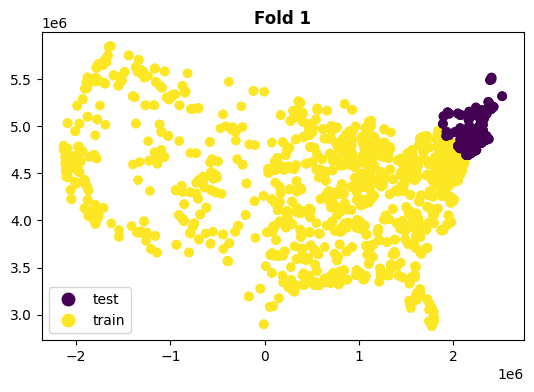

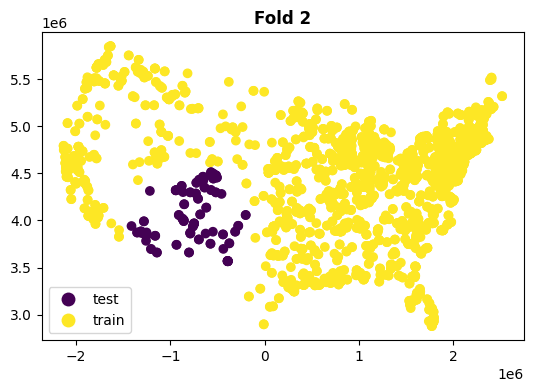

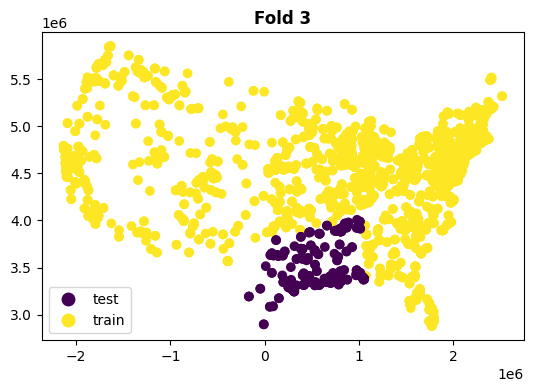

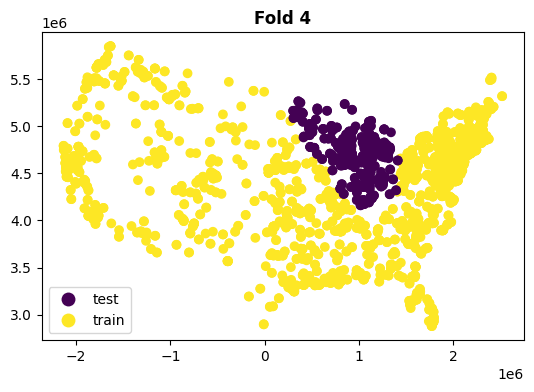

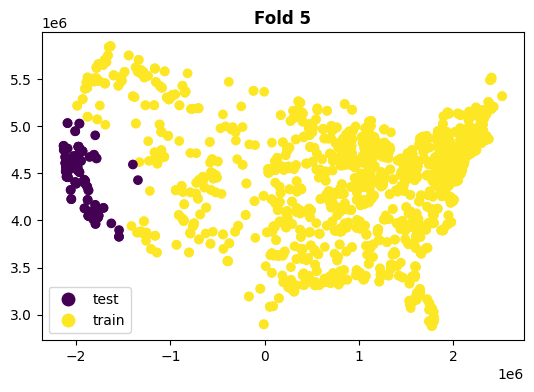

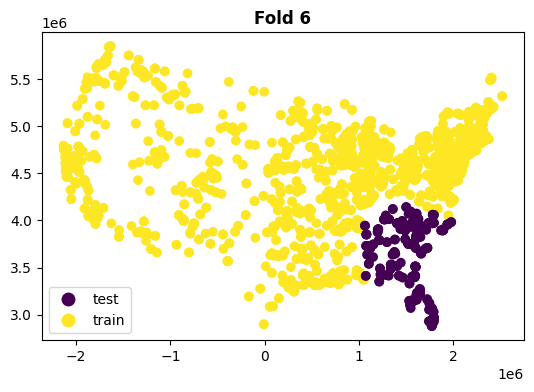

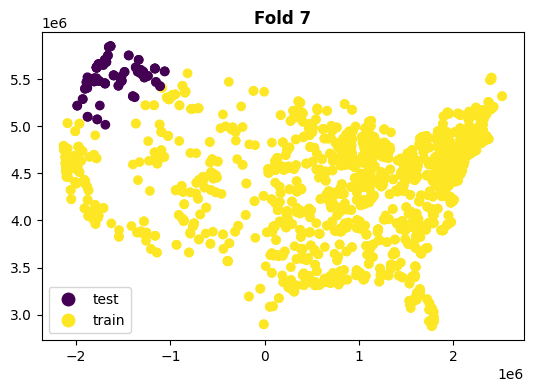

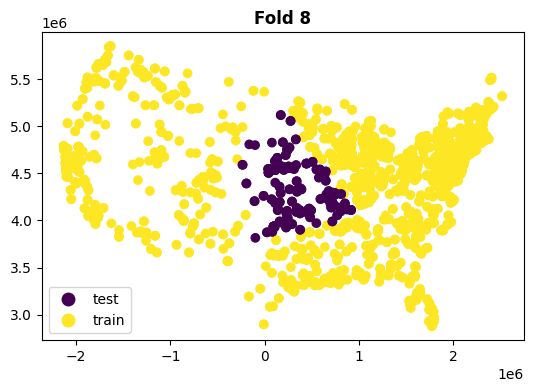

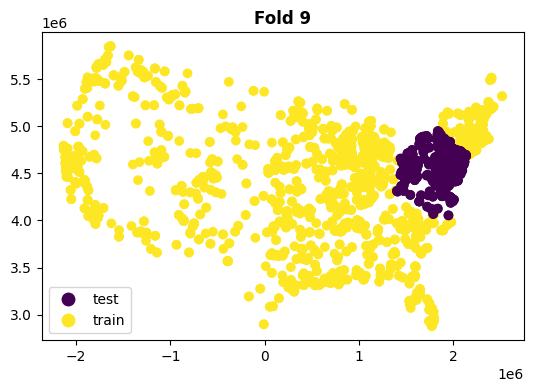

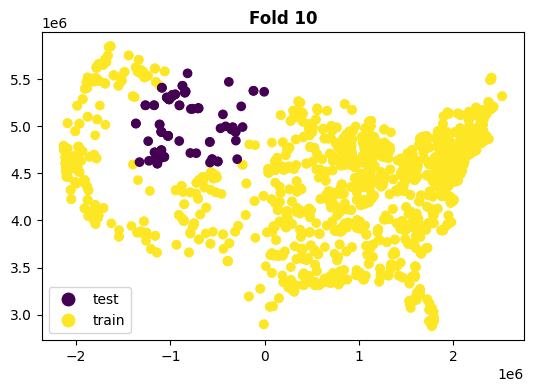

In [37]:
#Split for Spatial Clustering
for i in range(1,11):
    fig, ax = plt.subplots(1, 1 ,figsize=(9, 4))

    spatial_kfold_plot(X=federal_clusters,
                       geometry=federal_clusters.geometry,
                       groups=federal_clusters.folds,
                       fold_num=i, cmap='viridis', ax=ax)

In [38]:
# 1. Define the percentiles exported in the GEE .csv files
percentiles = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# 2. Create the list of feature columns matching the Axx_pxx format
feature_cols = []
for i in range(64):
    # Format band name to A00, A01... A63
    band_name = f"A0{i}" if i < 10 else f"A{i}"

    for p in percentiles:
        # Construct the column name like A00_p30
        col_name = f"{band_name}_p{p}"

        # Only add it if it actually exists in your merged dataframe
        if col_name in federal_prj.columns:
            feature_cols.append(col_name)

# 3. Define your target variable
y = federal_prj['indicator']

# 4. Filter your features to only include those in the list
X = federal_prj[feature_cols]

print(f"Total features identified: {len(feature_cols)}")

Total features identified: 704


In [39]:
#Check:
print(feature_cols)

['A00_p0', 'A00_p10', 'A00_p20', 'A00_p30', 'A00_p40', 'A00_p50', 'A00_p60', 'A00_p70', 'A00_p80', 'A00_p90', 'A00_p100', 'A01_p0', 'A01_p10', 'A01_p20', 'A01_p30', 'A01_p40', 'A01_p50', 'A01_p60', 'A01_p70', 'A01_p80', 'A01_p90', 'A01_p100', 'A02_p0', 'A02_p10', 'A02_p20', 'A02_p30', 'A02_p40', 'A02_p50', 'A02_p60', 'A02_p70', 'A02_p80', 'A02_p90', 'A02_p100', 'A03_p0', 'A03_p10', 'A03_p20', 'A03_p30', 'A03_p40', 'A03_p50', 'A03_p60', 'A03_p70', 'A03_p80', 'A03_p90', 'A03_p100', 'A04_p0', 'A04_p10', 'A04_p20', 'A04_p30', 'A04_p40', 'A04_p50', 'A04_p60', 'A04_p70', 'A04_p80', 'A04_p90', 'A04_p100', 'A05_p0', 'A05_p10', 'A05_p20', 'A05_p30', 'A05_p40', 'A05_p50', 'A05_p60', 'A05_p70', 'A05_p80', 'A05_p90', 'A05_p100', 'A06_p0', 'A06_p10', 'A06_p20', 'A06_p30', 'A06_p40', 'A06_p50', 'A06_p60', 'A06_p70', 'A06_p80', 'A06_p90', 'A06_p100', 'A07_p0', 'A07_p10', 'A07_p20', 'A07_p30', 'A07_p40', 'A07_p50', 'A07_p60', 'A07_p70', 'A07_p80', 'A07_p90', 'A07_p100', 'A08_p0', 'A08_p10', 'A08_p20',

In [40]:
#Check:
print(gdf_test['indicator'].value_counts())

indicator
0    1678
1    1618
Name: count, dtype: int64


In [41]:
# 1. Define your base model
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)

# Wrap it with FixedThresholdClassifier -- changes by what share of random zeros we have
custom_threshold_clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# --- 2. Keep the Cross-Validation Split ---
# kf remains the same (Random KFold)
# Fix: Use StratifiedKFold to ensure each fold has both classes, especially with imbalanced data.
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# --- 3. Change Scoring to Classificationa Metrics ---
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss' # A classification equivalent of mean squared error
]

# --- 4. Evaluate the model and collect the results ---
random_n_scores = cross_validate(
    custom_threshold_clf,
    X,
    y.values.ravel(),
    scoring=classification_scoring,
    cv=kf,
    n_jobs=-1,
    error_score='raise'
)

# Output the results dictionary
print("--- Cross-Validation Results (Classification) ---")
print(random_n_scores)

--- Cross-Validation Results (Classification) ---
{'fit_time': array([0.48466992, 0.45044398, 0.37317133, 0.33643007, 0.38161373,
       0.39181018, 0.30312014, 0.30495811, 0.34107256, 0.32921481]), 'score_time': array([0.03429222, 0.03820848, 0.03509402, 0.03423381, 0.03312635,
       0.03356957, 0.03367996, 0.03110313, 0.03084111, 0.02895141]), 'test_roc_auc': array([0.65494562, 0.58972663, 0.63120958, 0.6047913 , 0.6340388 ,
       0.60552616, 0.57222592, 0.62918607, 0.63738539, 0.56858178]), 'test_accuracy': array([0.62424242, 0.57575758, 0.61212121, 0.57878788, 0.61212121,
       0.57272727, 0.55319149, 0.58662614, 0.59574468, 0.56534954]), 'test_precision': array([0.62179487, 0.57142857, 0.61184211, 0.56647399, 0.60365854,
       0.56862745, 0.55172414, 0.58666667, 0.5875    , 0.55113636]), 'test_neg_log_loss': array([-0.65985614, -0.70197521, -0.66751697, -0.68999739, -0.66792434,
       -0.68271705, -0.69074576, -0.66731169, -0.6694105 , -0.70018815])}


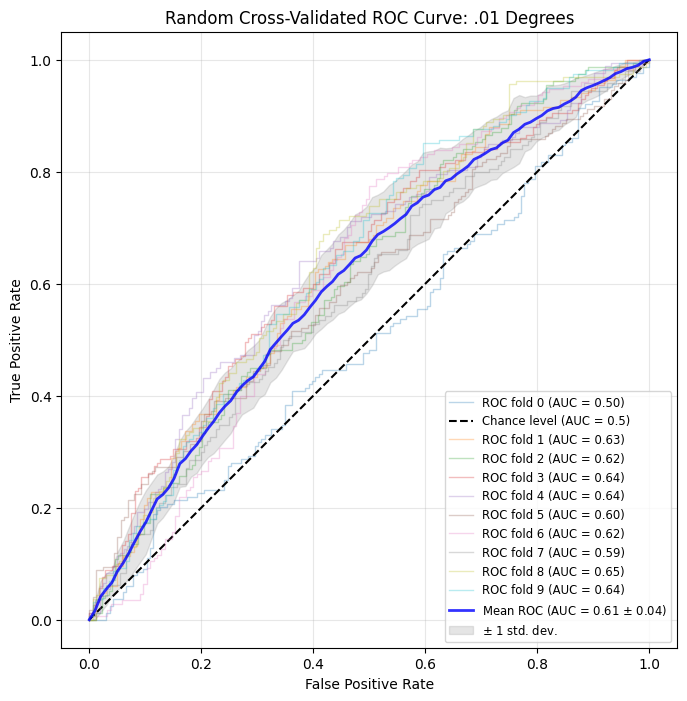

In [42]:
plt.close('all')
# --- 1. Setup ---
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)
clf = FixedThresholdClassifier(base_clf, threshold=0.5)
cv = KFold(n_splits=10, shuffle=True, random_state=123)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# --- 2. The Cross-Validation Loop ---
for fold, (train, test) in enumerate(cv.split(X, y)):
    # Fit on training data
    clf.fit(X.iloc[train], y.iloc[train].values.ravel())

    # Generate the curve for this fold
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test],
        y.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3, # Faded lines for individual folds
        lw=1,
        ax=ax,
        plot_chance_level=(fold == 0) # Only plot the 'Luck' line once
    )

    # Interpolate TPR to a common FPR grid to allow averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 3. Calculate Mean and Std Dev  ---
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

# Plot the strong Mean ROC line
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

# Add the shaded confidence interval (Standard Deviation)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

# --- 4. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Random Cross-Validated ROC Curve: .01 Degrees"
)
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [43]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Random Results: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Random Results: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.6128     0.5821    0.5877    0.6798
Median       0.6174     0.5790    0.5827    0.6761
Std Dev      0.0292     0.0245    0.0229    0.0153
Min (Worst)  0.5686     0.5511    0.5532    0.6599
Max (Best)   0.6549     0.6218    0.6242    0.7020
Q1 (25%)     0.5935     0.5670    0.5735    0.6676
Q3 (75%)     0.6333     0.5996    0.6080    0.6906


In [44]:
# --- RE-ESTABLISHING federal_prj_filtered ---

# 1. Merge the cluster/fold info into your main data
federal_prj = gdf_test.merge(federal_clusters[['id', 'folds']], on='id')

# 2. Identify and Drop empty folds (Option 1)
fold_summary = federal_prj.groupby('folds')['indicator'].sum()
empty_folds = fold_summary[fold_summary == 0].index.tolist()

print(f"Empty folds found: {empty_folds}")

# 3. Create the variable the model is looking for
federal_prj_filtered = federal_prj[~federal_prj['folds'].isin(empty_folds)].copy()

print(f"Variable 'federal_prj_filtered' is now defined with {len(federal_prj_filtered)} rows.")

Empty folds found: []
Variable 'federal_prj_filtered' is now defined with 3296 rows.


In [45]:
X = federal_prj_filtered[feature_cols]
y = federal_prj_filtered['indicator']
groups = federal_prj_filtered['folds']

logo = LeaveOneGroupOut()
clf = LogisticRegression(max_iter=5000, C=1.0, random_state=123)

# Lists to store metrics for each fold
aucs, accs, precs, log_losses = [], [], [], []
skipped_folds = []

print(f"Starting Spatial CV on {len(X)} samples...\n")

for train_idx, test_idx in logo.split(X, y, groups=groups):
    current_fold = groups.iloc[test_idx].unique()[0]
    y_test = y.iloc[test_idx]

    # 1. Skip check for single-label test sets
    if len(np.unique(y_test)) < 2:
        print(f"Fold {current_fold}: SKIPPED (No variance in test labels)")
        skipped_folds.append(current_fold)
        continue

    # 2. Train
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # 3. Predict (Probabilities for AUC/Log-Loss, Classes for Acc/Precision)
    y_probs = clf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = clf.predict(X.iloc[test_idx])

    # 4. Calculate and store metrics
    aucs.append(roc_auc_score(y_test, y_probs))
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=0))
    # neg_log_loss is -1 * log_loss
    log_losses.append(-log_loss(y_test, clf.predict_proba(X.iloc[test_idx])))

    print(f"Fold {current_fold}: PROCESSED (AUC: {aucs[-1]:.4f})")

# --- Final Summary Table ---
print(f"\n--- Final Results (Averages across {len(aucs)} folds) ---")
print(f"ROC-AUC:       {np.mean(aucs):.4f}")
print(f"Accuracy:      {np.mean(accs):.4f}")
print(f"Precision:     {np.mean(precs):.4f}")
print(f"Neg. Log Loss: {np.mean(log_losses):.4f}")

if skipped_folds:
    print(f"\nNote: Folds {skipped_folds} were excluded from these averages.")

Starting Spatial CV on 3296 samples...

Fold 1: PROCESSED (AUC: 0.6869)
Fold 2: PROCESSED (AUC: 0.5730)
Fold 3: PROCESSED (AUC: 0.5966)
Fold 4: PROCESSED (AUC: 0.6307)
Fold 5: PROCESSED (AUC: 0.6661)
Fold 6: PROCESSED (AUC: 0.5698)
Fold 7: PROCESSED (AUC: 0.6466)
Fold 8: PROCESSED (AUC: 0.5764)
Fold 9: PROCESSED (AUC: 0.6207)
Fold 10: PROCESSED (AUC: 0.6656)

--- Final Results (Averages across 10 folds) ---
ROC-AUC:       0.6232
Accuracy:      0.5915
Precision:     0.5750
Neg. Log Loss: -0.6825


Starting Spatial CV on 3296 samples with 10 clusters...



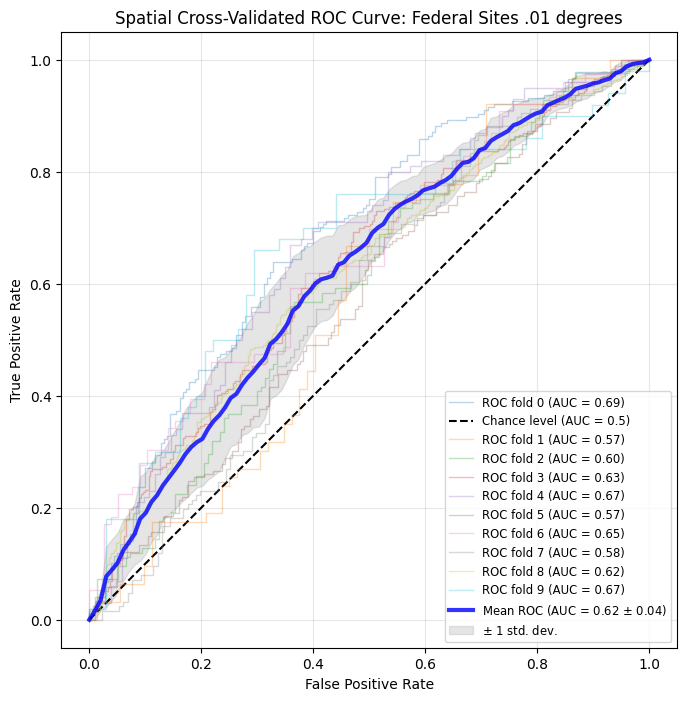

In [46]:
plt.close('all')

# --- 1. SETUP ---
logo = LeaveOneGroupOut()
tprs = [] # True Positive Rates
aucs = [] # Area Under the Curves
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# Use the features (X), labels (y), and spatial groups defined earlier
print(f"Starting Spatial CV on {len(X)} samples with {len(groups.unique())} clusters...\n")

# --- 2. The Spatial LOGO Loop ---
for fold, (train_idx, test_idx) in enumerate(logo.split(X, y, groups=groups)):
    y_test = y.iloc[test_idx]
    if len(np.unique(y_test)) < 2:
        continue

    # Train on everything EXCEPT the current cluster
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # Plot individual fold curve (thin, pastel colors)
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test_idx],
        y.iloc[test_idx],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        # Plot the dotted chance level line ONLY for the first valid fold
        plot_chance_level=(len(tprs) == 0)
    )

    # 3. INTERPOLATION for averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0 # Force curve to start at 0,0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 4. CACLULATE SPATIAL MEAN & VARIANCE ---
if tprs:
    # Calculate the mean of the True Positive Rates across all spatial folds
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    # Calculate Area under the MEAN curve (a slightly more robust statistic)
    mean_auc = auc(mean_fpr, mean_tpr)
    # Calculate Standard Deviation of the AUC values
    std_auc = np.std(aucs)

    # Plot the thick blue Mean ROC line
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="blue",
        # Text from the example: AUC = Mean ± StdDev
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=3, # Thick line
        alpha=0.8,
    )

    # Calculate and Plot the Shaded Variance Region (Standard Deviation)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1) # Keep upper boundary <= 1
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0) # Keep lower boundary >= 0

    # Fill the region
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

# --- 5. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Spatial Cross-Validated ROC Curve: Federal Sites .01 degrees" # Use your title
)

# Use small legend and multiple columns to fit all the folds, matching the look
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

# Display the plot
plt.show()

In [47]:
# Assuming 'federal_prj_filtered' and 'federal_clusters' are available from previous cells.
# 'X' and 'y' are derived from 'federal_prj_filtered'.

# --- 0. Pre-filter data for cross_validate to avoid single-class test folds ---
# Identify groups that contain only one unique label (0 or 1)
# This is crucial for metrics like log_loss and roc_auc, which require at least two classes.
# We use federal_prj_filtered because X and y are based on it.
unique_labels_per_fold = federal_prj_filtered.groupby('folds')['indicator'].nunique()
problematic_folds_ids = unique_labels_per_fold[unique_labels_per_fold == 1].index.tolist()

# Filter X, y, and the groups array if problematic folds are found
if problematic_folds_ids:
    print(f"Warning: The following folds contain only one class and will be excluded from `cross_validate`: {problematic_folds_ids}")
    # Create a boolean mask for the rows to keep
    mask = ~federal_prj_filtered['folds'].isin(problematic_folds_ids)

    X_filtered = X[mask]
    y_filtered = y[mask]
    # Re-create spatial_folds_filtered to ensure it matches the filtered X and y
    spatial_folds_filtered = federal_prj_filtered[mask]['folds'].values.ravel()
else:
    X_filtered = X
    y_filtered = y
    spatial_folds_filtered = federal_prj_filtered['folds'].values.ravel() # Ensure this is always from federal_prj_filtered


# --- 1. Define the Estimator and Cross-Validator ---

# FIX: Use a fresh LogisticRegression estimator.
# We add stability settings (max_iter) and set regularization (C) to default.
clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# Initiate the Leave One Group Out cross-validator
group_cvs = LeaveOneGroupOut()

# --- 2. Evaluate the model and collect the results ---

# Use Classification Scoring
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss'
]

print("Starting Leave One Group Out (Spatial) Cross-Validation...")
# We pass the groups array directly to the 'groups' parameter of cross_validate.
spatial_cluster_scores = cross_validate(
    clf, # Uses the new LogisticRegression estimator
    X_filtered, # Use filtered X
    y_filtered.values.ravel(), # Use filtered y
    scoring=classification_scoring,
    cv=group_cvs,  # Pass the LOGO object
    groups=spatial_folds_filtered, # Pass the filtered spatial group IDs
    n_jobs=-1,
    error_score='raise'
)

print("\n--- Spatial Cross-Validation Complete ---")
print(f"Number of folds run: {len(spatial_cluster_scores['test_roc_auc'])}")
print("Results Summary:")
print(spatial_cluster_scores)

Starting Leave One Group Out (Spatial) Cross-Validation...

--- Spatial Cross-Validation Complete ---
Number of folds run: 10
Results Summary:
{'fit_time': array([0.34406066, 0.35980487, 0.2877965 , 0.26481557, 0.36238289,
       0.34553194, 0.42604327, 0.37616086, 0.21647668, 0.29445434]), 'score_time': array([0.03698635, 0.03357267, 0.03621173, 0.03269076, 0.03392196,
       0.0318892 , 0.03092957, 0.03428054, 0.04101586, 0.02803802]), 'test_roc_auc': array([0.6868801 , 0.57297178, 0.59655474, 0.63070255, 0.6661165 ,
       0.56982723, 0.64659244, 0.57639646, 0.62066347, 0.66558824]), 'test_accuracy': array([0.64705882, 0.51111111, 0.56870229, 0.59965636, 0.60591133,
       0.55932203, 0.6038961 , 0.56031128, 0.58924485, 0.66949153]), 'test_precision': array([0.65088757, 0.44      , 0.54411765, 0.58695652, 0.57042254,
       0.54404145, 0.6744186 , 0.55652174, 0.5862069 , 0.59649123]), 'test_neg_log_loss': array([-0.64389497, -0.73285495, -0.68253481, -0.66962057, -0.67912417,
      

In [48]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.6232     0.5750    0.5915    0.6825
Median       0.6257     0.5783    0.5945    0.6773
Std Dev      0.0429     0.0640    0.0455    0.0253
Min (Worst)  0.5698     0.4400    0.5111    0.6439
Max (Best)   0.6869     0.6744    0.6695    0.7329
Q1 (25%)     0.5814     0.5472    0.5624    0.6704
Q3 (75%)     0.6608     0.5941    0.6054    0.6919


In [49]:
# The global list 'all_results_data' and 'add_result_row' function are defined in a previous cell.

# --- Calculate summary statistics for Random CV (5% case) ---
df_random_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Random CV'
})
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
random_summary_5 = df_random_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
random_summary_5.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# spatial_summary is already available from previous cell
# Re-create it here for clarity and to ensure it uses the correct data
df_spatial_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})
spatial_summary_5 = df_spatial_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
spatial_summary_5.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# --- POPULATING WITH YOUR PROVIDED NUMBERS (5% data) --- (using global add_result_row)
# Percentage refers to number of 0s compared to 1s

# 5% - Auto-populated with current run results
add_result_row(5, 'Random', 'auc', random_summary_5.loc['Mean', 'auc'], random_summary_5.loc['Median', 'auc'], random_summary_5.loc['Std Dev', 'auc'], random_summary_5.loc['Min (Worst)', 'auc'], random_summary_5.loc['Max (Best)', 'auc'], random_summary_5.loc['Q1 (25%)', 'auc'], random_summary_5.loc['Q3 (75%)', 'auc'])
add_result_row(5, 'Random', 'precision', random_summary_5.loc['Mean', 'precision'], random_summary_5.loc['Median', 'precision'], random_summary_5.loc['Std Dev', 'precision'], random_summary_5.loc['Min (Worst)', 'precision'], random_summary_5.loc['Max (Best)', 'precision'], random_summary_5.loc['Q1 (25%)', 'precision'], random_summary_5.loc['Q3 (75%)', 'precision'])
add_result_row(5, 'Random', 'accuracy', random_summary_5.loc['Mean', 'accuracy'], random_summary_5.loc['Median', 'accuracy'], random_summary_5.loc['Std Dev', 'accuracy'], random_summary_5.loc['Min (Worst)', 'accuracy'], random_summary_5.loc['Max (Best)', 'accuracy'], random_summary_5.loc['Q1 (25%)', 'accuracy'], random_summary_5.loc['Q3 (75%)', 'accuracy'])
add_result_row(5, 'Random', 'log_loss', random_summary_5.loc['Mean', 'log_loss'], random_summary_5.loc['Median', 'log_loss'], random_summary_5.loc['Std Dev', 'log_loss'], random_summary_5.loc['Min (Worst)', 'log_loss'], random_summary_5.loc['Max (Best)', 'log_loss'], random_summary_5.loc['Q1 (25%)', 'log_loss'], random_summary_5.loc['Q3 (75%)', 'log_loss'])
add_result_row(5, 'K fold', 'auc', spatial_summary_5.loc['Mean', 'auc'], spatial_summary_5.loc['Median', 'auc'], spatial_summary_5.loc['Std Dev', 'auc'], spatial_summary_5.loc['Min (Worst)', 'auc'], spatial_summary_5.loc['Max (Best)', 'auc'], spatial_summary_5.loc['Q1 (25%)', 'auc'], spatial_summary_5.loc['Q3 (75%)', 'auc'])
add_result_row(5, 'K fold', 'precision', spatial_summary_5.loc['Mean', 'precision'], spatial_summary_5.loc['Median', 'precision'], spatial_summary_5.loc['Std Dev', 'precision'], spatial_summary_5.loc['Min (Worst)', 'precision'], spatial_summary_5.loc['Max (Best)', 'precision'], spatial_summary_5.loc['Q1 (25%)', 'precision'], spatial_summary_5.loc['Q3 (75%)', 'precision'])
add_result_row(5, 'K fold', 'accuracy', spatial_summary_5.loc['Mean', 'accuracy'], spatial_summary_5.loc['Median', 'accuracy'], spatial_summary_5.loc['Std Dev', 'accuracy'], spatial_summary_5.loc['Min (Worst)', 'accuracy'], spatial_summary_5.loc['Max (Best)', 'accuracy'], spatial_summary_5.loc['Q1 (25%)', 'accuracy'], spatial_summary_5.loc['Q3 (75%)', 'accuracy'])
add_result_row(5, 'K fold', 'log_loss', spatial_summary_5.loc['Mean', 'log_loss'], spatial_summary_5.loc['Median', 'log_loss'], spatial_summary_5.loc['Std Dev', 'log_loss'], spatial_summary_5.loc['Min (Worst)', 'log_loss'], spatial_summary_5.loc['Max (Best)', 'log_loss'], spatial_summary_5.loc['Q1 (25%)', 'log_loss'], spatial_summary_5.loc['Q3 (75%)', 'log_loss'])

df_long = pd.DataFrame(all_results_data)

# Display the head and tail of the DataFrame to verify its content
display(df_long.head())
display(df_long.tail())

,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
0,0,Random,auc,0.599283,0.606855,0.033723,0.539208,0.648758,0.577315,0.620303
1,0,Random,precision,0.580127,0.580684,0.021568,0.549133,0.605263,0.560630,0.600631
2,0,Random,accuracy,0.578659,0.578535,0.019899,0.551402,0.608696,0.560559,0.595497
3,0,Random,log_loss,0.686363,0.679231,0.019394,0.657093,0.715019,0.676339,0.704478
4,0,K fold,auc,0.610727,0.605958,0.042650,0.556612,0.686356,0.585170,0.635894


,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
19,5,Random,log_loss,0.679764,0.676064,0.015251,0.659856,0.701975,0.667619,0.690559
20,5,K fold,auc,0.623229,0.625683,0.042916,0.569827,0.686880,0.581436,0.660839
21,5,K fold,precision,0.575006,0.578315,0.064008,0.440000,0.674419,0.547219,0.594108
22,5,K fold,accuracy,0.591471,0.594451,0.045452,0.511111,0.669492,0.562409,0.605408
23,5,K fold,log_loss,0.682459,0.677275,0.025272,0.643895,0.732855,0.670443,0.691859


#For 10% 0s

In [50]:
#For 10%
#------USER INPUT--------#
#input the folder path where your GEE .csv files are stored
folder_path = '/content/drive/MyDrive/Research/Young/MOSAIKS/superfund_project_summer2026/Data/Intermediate/Spatial K Folds/Federal/10/'
file_pattern = os.path.join(folder_path, 'GEE_featurization_federal_*.csv') #name pattern of files from GEE
file_list = glob.glob(file_pattern)

print(f"Found {len(file_list)} files to combine.")

# 3. Read each file into a list of DataFrames
df_list = [pd.read_csv(f) for f in file_list]

# 4. Concatenate (stack) them into one master DataFrame
full_df = pd.concat(df_list, ignore_index=True)

# 5. Check the final count to make sure it matches your # of points
print(f"Final combined row count: {len(full_df)}")
full_df.head()

gdf_test=full_df

Found 7 files to combine.
Final combined row count: 3377


FIXING: Converting gdf_test from DataFrame to GeoDataFrame.
Re-projecting data to UTM for accurate clustering...
Starting spatial clustering into 10 folds (3377 points)...


/tmp/ipykernel_2629/2168819861.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cols_tab = cm.get_cmap('tab20', 10)


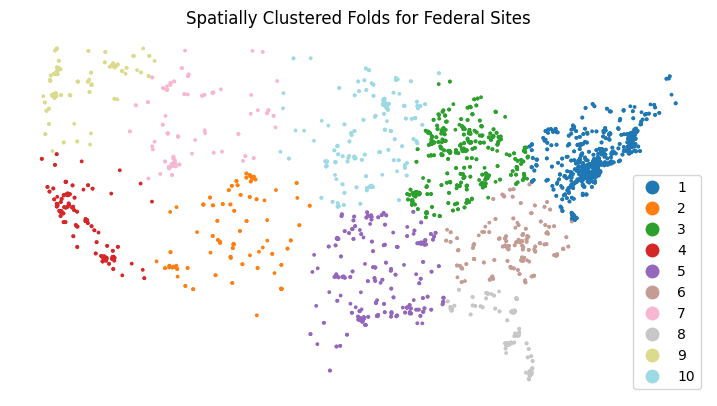

Clustering complete. Found 10 unique folds.


In [51]:
#Spatial Clustering

# 0. Re-initialize gdf_test from the original full_df, ensuring 'indicator' is present
#    and it is a pandas DataFrame, so the subsequent `if` block correctly converts it.
gdf_test = full_df.copy()

# Assuming 'gdf_test' currently exists as a Pandas DataFrame with 'lon'/'lat'
# First, ensure gdf_test is a GeoDataFrame, potentially converting it.
if not isinstance(gdf_test, gpd.GeoDataFrame) or 'geometry' not in gdf_test.columns:
    print("FIXING: Converting gdf_test from DataFrame to GeoDataFrame.")

    # 1. Define bands (assuming they start with 'A')
    bands = [col for col in gdf_test.columns if col.startswith('A')]

    # 2. DROP NaN ROWS HERE
    initial_len = len(gdf_test)
    gdf_test = gdf_test.dropna(subset=bands).reset_index(drop=True)
    dropped = initial_len - len(gdf_test)
    if dropped > 0:
        print(f"Dropped {dropped} rows with NaN satellite features.")

    # 3. Recreate the GeoDataFrame structure
    gdf_test = gpd.GeoDataFrame(
        gdf_test,
        geometry=gpd.points_from_xy(gdf_test['lon'], gdf_test['lat']),
        crs="EPSG:4326"
    )

# 4. Add an 'id' column: This MUST be done after gdf_test is definitively a GeoDataFrame
# and before it's used for clustering, as previous map cells don't add it.
gdf_test['id'] = range(len(gdf_test))

# --- 1. PREPARE GEODATAFRAME for Clustering ---
# The estimate_utm_crs() requires a GeoDataFrame input.
print("Re-projecting data to UTM for accurate clustering...")
federal_prj = gdf_test.copy().to_crs(gdf_test.estimate_utm_crs())

# --- 2. SPATIAL CLUSTER RESAMPLING ---
print(f"Starting spatial clustering into 10 folds ({len(federal_prj)} points)...")

federal_clusters = spatial_kfold_clusters(
  gdf=federal_prj,
  name='id',
  nfolds=10,
  algorithm='kmeans',
  n_init="auto",
  random_state=569
  )

# --- 3. PLOTTING ---
# Get the 'tab20' colormap
cols_tab = cm.get_cmap('tab20', 10)
cols = [cols_tab(i) for i in range(10)]
color_ramp = ListedColormap(cols)

# Create a final GeoDataFrame containing the original CRS and the new fold information
federal_clusters_map = gdf_test.merge(
    federal_clusters[['id', 'folds']],
    left_on='id',
    right_on='id'
)

fig, ax = plt.subplots(1,1 , figsize=(9, 9))
federal_clusters_map.plot(
    column='folds',
    ax=ax,
    cmap=color_ramp,
    markersize=3,
    legend=True,
    categorical=True
)
ax.set_title('Spatially Clustered Folds for Federal Sites')
ax.set_axis_off()

plt.show()

print(f"Clustering complete. Found {federal_clusters['folds'].nunique()} unique folds.")

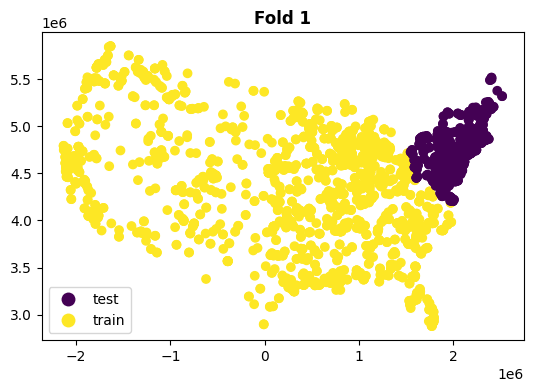

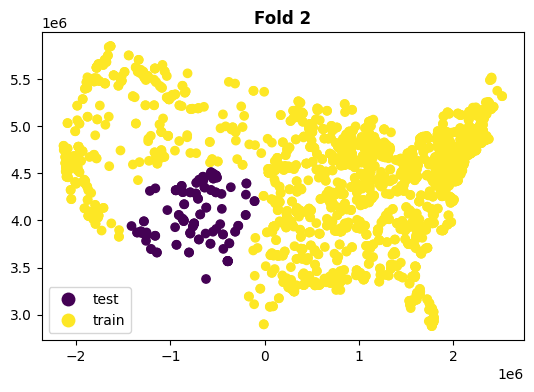

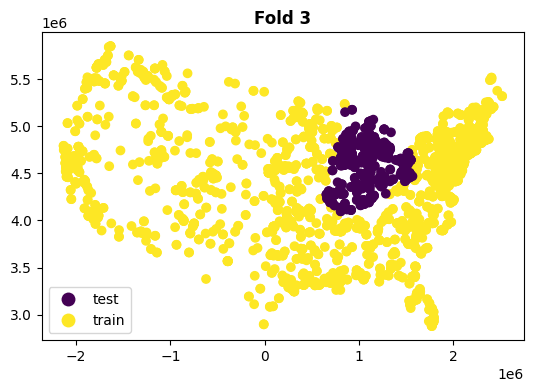

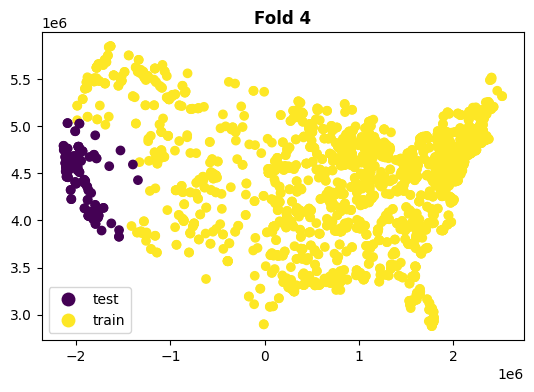

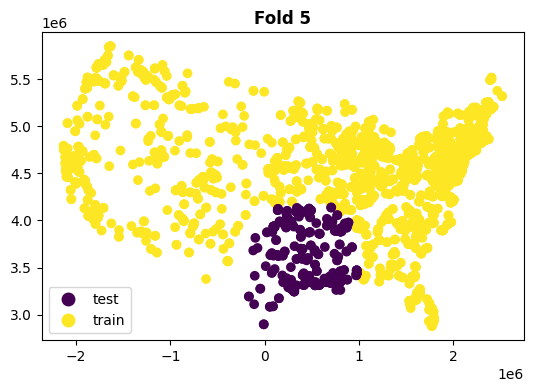

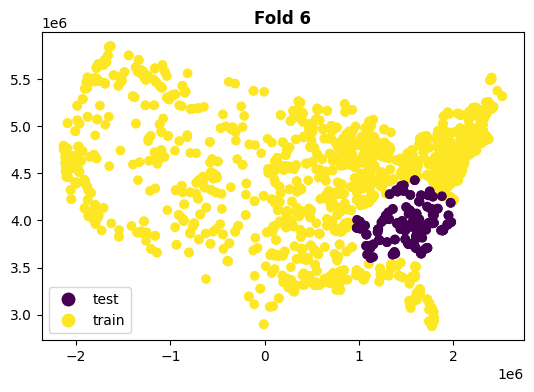

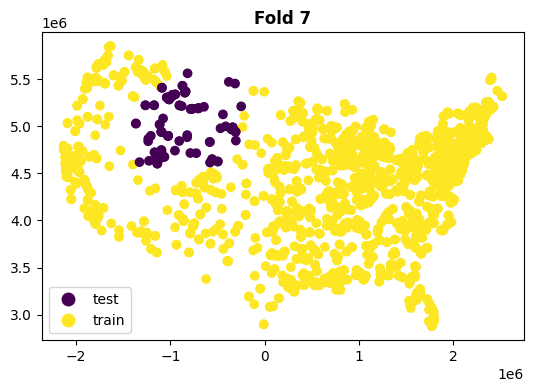

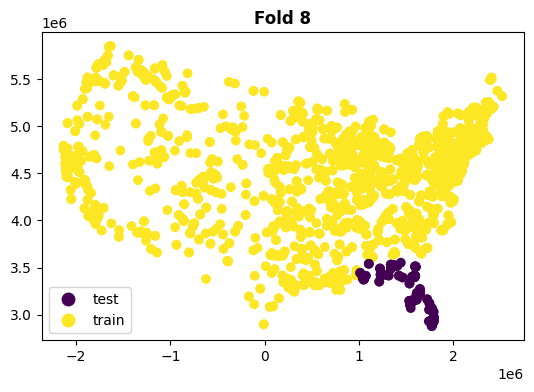

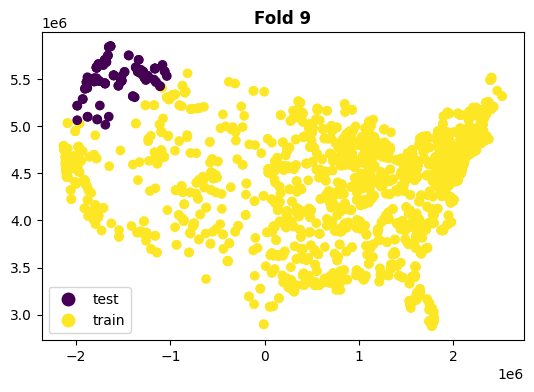

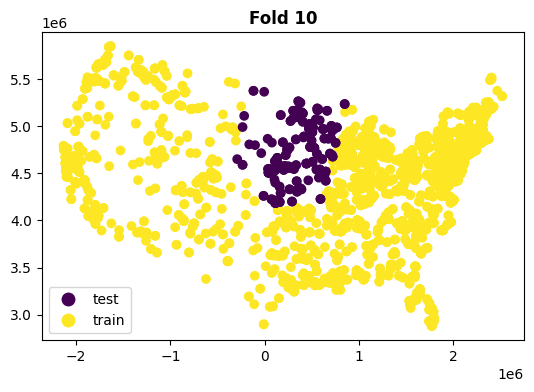

In [52]:
#Split for Spatial Clustering
for i in range(1,11):
    fig, ax = plt.subplots(1, 1 ,figsize=(9, 4))

    spatial_kfold_plot(X=federal_clusters,
                       geometry=federal_clusters.geometry,
                       groups=federal_clusters.folds,
                       fold_num=i, cmap='viridis', ax=ax)

In [53]:
# 1. Define the percentiles exported in the GEE .csv files
percentiles = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# 2. Create the list of feature columns matching the Axx_pxx format
feature_cols = []
for i in range(64):
    # Format band name to A00, A01... A63
    band_name = f"A0{i}" if i < 10 else f"A{i}"

    for p in percentiles:
        # Construct the column name like A00_p30
        col_name = f"{band_name}_p{p}"

        # Only add it if it actually exists in your merged dataframe
        if col_name in federal_prj.columns:
            feature_cols.append(col_name)

# 3. Define your target variable
y = federal_prj['indicator']

# 4. Filter your features to only include those in the list
X = federal_prj[feature_cols]

print(f"Total features identified: {len(feature_cols)}")

Total features identified: 704


In [54]:
#Check:
print(feature_cols)

['A00_p0', 'A00_p10', 'A00_p20', 'A00_p30', 'A00_p40', 'A00_p50', 'A00_p60', 'A00_p70', 'A00_p80', 'A00_p90', 'A00_p100', 'A01_p0', 'A01_p10', 'A01_p20', 'A01_p30', 'A01_p40', 'A01_p50', 'A01_p60', 'A01_p70', 'A01_p80', 'A01_p90', 'A01_p100', 'A02_p0', 'A02_p10', 'A02_p20', 'A02_p30', 'A02_p40', 'A02_p50', 'A02_p60', 'A02_p70', 'A02_p80', 'A02_p90', 'A02_p100', 'A03_p0', 'A03_p10', 'A03_p20', 'A03_p30', 'A03_p40', 'A03_p50', 'A03_p60', 'A03_p70', 'A03_p80', 'A03_p90', 'A03_p100', 'A04_p0', 'A04_p10', 'A04_p20', 'A04_p30', 'A04_p40', 'A04_p50', 'A04_p60', 'A04_p70', 'A04_p80', 'A04_p90', 'A04_p100', 'A05_p0', 'A05_p10', 'A05_p20', 'A05_p30', 'A05_p40', 'A05_p50', 'A05_p60', 'A05_p70', 'A05_p80', 'A05_p90', 'A05_p100', 'A06_p0', 'A06_p10', 'A06_p20', 'A06_p30', 'A06_p40', 'A06_p50', 'A06_p60', 'A06_p70', 'A06_p80', 'A06_p90', 'A06_p100', 'A07_p0', 'A07_p10', 'A07_p20', 'A07_p30', 'A07_p40', 'A07_p50', 'A07_p60', 'A07_p70', 'A07_p80', 'A07_p90', 'A07_p100', 'A08_p0', 'A08_p10', 'A08_p20',

In [55]:
#Check:
print(gdf_test['indicator'].value_counts())

indicator
0    1759
1    1618
Name: count, dtype: int64


In [56]:
# 1. Define your base model
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)

# Wrap it with FixedThresholdClassifier -- changes by what share of random zeros we have
custom_threshold_clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# --- 2. Keep the Cross-Validation Split ---
# kf remains the same (Random KFold)
# Fix: Use StratifiedKFold to ensure each fold has both classes, especially with imbalanced data.
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# --- 3. Change Scoring to Classificationa Metrics ---
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss' # A classification equivalent of mean squared error
]

# --- 4. Evaluate the model and collect the results ---
random_n_scores = cross_validate(
    custom_threshold_clf,
    X,
    y.values.ravel(),
    scoring=classification_scoring,
    cv=kf,
    n_jobs=-1,
    error_score='raise'
)

# Output the results dictionary
print("--- Cross-Validation Results (Classification) ---")
print(random_n_scores)

--- Cross-Validation Results (Classification) ---
{'fit_time': array([0.47962523, 0.36058402, 0.47189379, 0.50935268, 0.3713665 ,
       0.59056139, 0.47876477, 0.52514505, 0.4248023 , 0.24211931]), 'score_time': array([0.0641768 , 0.06733608, 0.03283048, 0.03685975, 0.03668809,
       0.06664705, 0.06410599, 0.06535435, 0.06351161, 0.03129768]), 'test_roc_auc': array([0.64993687, 0.61163721, 0.64001122, 0.63836279, 0.66810466,
       0.62023008, 0.54078984, 0.64095238, 0.60287267, 0.61751835]), 'test_accuracy': array([0.60059172, 0.59763314, 0.60059172, 0.61538462, 0.60946746,
       0.58284024, 0.51183432, 0.59940653, 0.57863501, 0.60237389]), 'test_precision': array([0.58282209, 0.58783784, 0.59574468, 0.59876543, 0.59615385,
       0.56603774, 0.49032258, 0.59060403, 0.55688623, 0.58823529]), 'test_neg_log_loss': array([-0.66060772, -0.68920791, -0.66296859, -0.67237823, -0.64981088,
       -0.67387413, -0.71682998, -0.66147984, -0.6822086 , -0.67327713])}


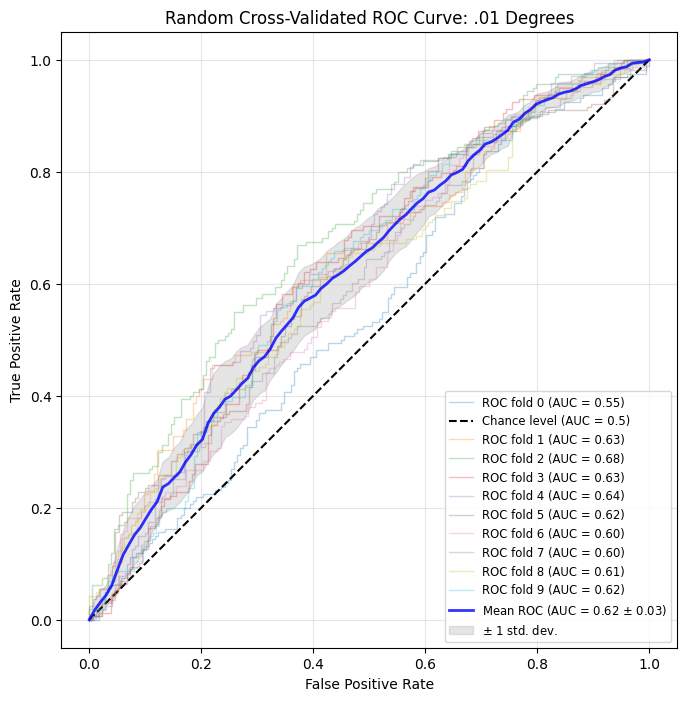

In [57]:
plt.close('all')
# --- 1. Setup ---
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)
clf = FixedThresholdClassifier(base_clf, threshold=0.5)
cv = KFold(n_splits=10, shuffle=True, random_state=123)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# --- 2. The Cross-Validation Loop ---
for fold, (train, test) in enumerate(cv.split(X, y)):
    # Fit on training data
    clf.fit(X.iloc[train], y.iloc[train].values.ravel())

    # Generate the curve for this fold
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test],
        y.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3, # Faded lines for individual folds
        lw=1,
        ax=ax,
        plot_chance_level=(fold == 0) # Only plot the 'Luck' line once
    )

    # Interpolate TPR to a common FPR grid to allow averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 3. Calculate Mean and Std Dev  ---
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

# Plot the strong Mean ROC line
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

# Add the shaded confidence interval (Standard Deviation)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

# --- 4. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Random Cross-Validated ROC Curve: .01 Degrees"
)
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [58]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Random Results: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Random Results: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.6230     0.5753    0.5899    0.6743
Median       0.6293     0.5880    0.6000    0.6728
Std Dev      0.0349     0.0328    0.0295    0.0188
Min (Worst)  0.5408     0.4903    0.5118    0.6498
Max (Best)   0.6681     0.5988    0.6154    0.7168
Q1 (25%)     0.6131     0.5702    0.5865    0.6619
Q3 (75%)     0.6407     0.5945    0.6019    0.6801


In [59]:
# --- RE-ESTABLISHING federal_prj_filtered ---

# 1. Merge the cluster/fold info into your main data
federal_prj = gdf_test.merge(federal_clusters[['id', 'folds']], on='id')

# 2. Identify and Drop empty folds (Option 1)
fold_summary = federal_prj.groupby('folds')['indicator'].sum()
empty_folds = fold_summary[fold_summary == 0].index.tolist()

print(f"Empty folds found: {empty_folds}")

# 3. Create the variable the model is looking for
federal_prj_filtered = federal_prj[~federal_prj['folds'].isin(empty_folds)].copy()

print(f"Variable 'federal_prj_filtered' is now defined with {len(federal_prj_filtered)} rows.")

Empty folds found: []
Variable 'federal_prj_filtered' is now defined with 3377 rows.


In [60]:
X = federal_prj_filtered[feature_cols]
y = federal_prj_filtered['indicator']
groups = federal_prj_filtered['folds']

logo = LeaveOneGroupOut()
clf = LogisticRegression(max_iter=5000, C=1.0, random_state=123)

# Lists to store metrics for each fold
aucs, accs, precs, log_losses = [], [], [], []
skipped_folds = []

print(f"Starting Spatial CV on {len(X)} samples...\n")

for train_idx, test_idx in logo.split(X, y, groups=groups):
    current_fold = groups.iloc[test_idx].unique()[0]
    y_test = y.iloc[test_idx]

    # 1. Skip check for single-label test sets
    if len(np.unique(y_test)) < 2:
        print(f"Fold {current_fold}: SKIPPED (No variance in test labels)")
        skipped_folds.append(current_fold)
        continue

    # 2. Train
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # 3. Predict (Probabilities for AUC/Log-Loss, Classes for Acc/Precision)
    y_probs = clf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = clf.predict(X.iloc[test_idx])

    # 4. Calculate and store metrics
    aucs.append(roc_auc_score(y_test, y_probs))
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=0))
    # neg_log_loss is -1 * log_loss
    log_losses.append(-log_loss(y_test, clf.predict_proba(X.iloc[test_idx])))

    print(f"Fold {current_fold}: PROCESSED (AUC: {aucs[-1]:.4f})")

# --- Final Summary Table ---
print(f"\n--- Final Results (Averages across {len(aucs)} folds) ---")
print(f"ROC-AUC:       {np.mean(aucs):.4f}")
print(f"Accuracy:      {np.mean(accs):.4f}")
print(f"Precision:     {np.mean(precs):.4f}")
print(f"Neg. Log Loss: {np.mean(log_losses):.4f}")

if skipped_folds:
    print(f"\nNote: Folds {skipped_folds} were excluded from these averages.")

Starting Spatial CV on 3377 samples...

Fold 1: PROCESSED (AUC: 0.6381)
Fold 2: PROCESSED (AUC: 0.5899)
Fold 3: PROCESSED (AUC: 0.6344)
Fold 4: PROCESSED (AUC: 0.6733)
Fold 5: PROCESSED (AUC: 0.5943)
Fold 6: PROCESSED (AUC: 0.6134)
Fold 7: PROCESSED (AUC: 0.7019)
Fold 8: PROCESSED (AUC: 0.5963)
Fold 9: PROCESSED (AUC: 0.6612)
Fold 10: PROCESSED (AUC: 0.6312)

--- Final Results (Averages across 10 folds) ---
ROC-AUC:       0.6334
Accuracy:      0.6048
Precision:     0.5794
Neg. Log Loss: -0.6732


Starting Spatial CV on 3377 samples with 10 clusters...



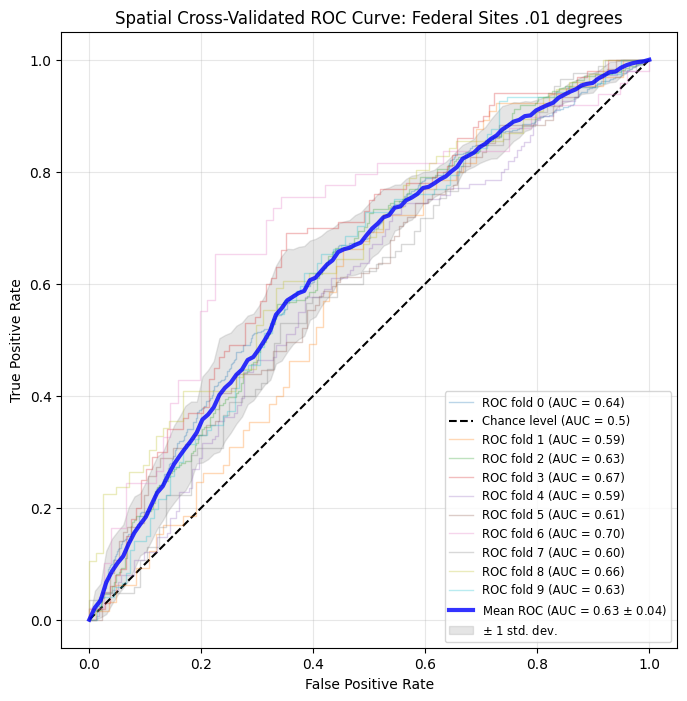

In [61]:
plt.close('all')

# --- 1. SETUP ---
logo = LeaveOneGroupOut()
tprs = [] # True Positive Rates
aucs = [] # Area Under the Curves
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# Use the features (X), labels (y), and spatial groups defined earlier
print(f"Starting Spatial CV on {len(X)} samples with {len(groups.unique())} clusters...\n")

# --- 2. The Spatial LOGO Loop ---
for fold, (train_idx, test_idx) in enumerate(logo.split(X, y, groups=groups)):
    y_test = y.iloc[test_idx]
    if len(np.unique(y_test)) < 2:
        continue

    # Train on everything EXCEPT the current cluster
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # Plot individual fold curve (thin, pastel colors)
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test_idx],
        y.iloc[test_idx],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        # Plot the dotted chance level line ONLY for the first valid fold
        plot_chance_level=(len(tprs) == 0)
    )

    # 3. INTERPOLATION for averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0 # Force curve to start at 0,0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 4. CACLULATE SPATIAL MEAN & VARIANCE ---
if tprs:
    # Calculate the mean of the True Positive Rates across all spatial folds
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    # Calculate Area under the MEAN curve (a slightly more robust statistic)
    mean_auc = auc(mean_fpr, mean_tpr)
    # Calculate Standard Deviation of the AUC values
    std_auc = np.std(aucs)

    # Plot the thick blue Mean ROC line
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="blue",
        # Text from the example: AUC = Mean ± StdDev
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=3, # Thick line
        alpha=0.8,
    )

    # Calculate and Plot the Shaded Variance Region (Standard Deviation)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1) # Keep upper boundary <= 1
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0) # Keep lower boundary >= 0

    # Fill the region
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

# --- 5. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Spatial Cross-Validated ROC Curve: Federal Sites .01 degrees"
)

# Use small legend and multiple columns to fit all the folds, matching the look
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

# Display the plot
plt.show()

In [62]:
# Assuming 'federal_prj_filtered' and 'federal_clusters' are available from previous cells.
# 'X' and 'y' are derived from 'federal_prj_filtered'.

# --- 0. Pre-filter data for cross_validate to avoid single-class test folds ---
# Identify groups that contain only one unique label (0 or 1)
# This is crucial for metrics like log_loss and roc_auc, which require at least two classes.
# We use federal_prj_filtered because X and y are based on it.
unique_labels_per_fold = federal_prj_filtered.groupby('folds')['indicator'].nunique()
problematic_folds_ids = unique_labels_per_fold[unique_labels_per_fold == 1].index.tolist()

# Filter X, y, and the groups array if problematic folds are found
if problematic_folds_ids:
    print(f"Warning: The following folds contain only one class and will be excluded from `cross_validate`: {problematic_folds_ids}")
    # Create a boolean mask for the rows to keep
    mask = ~federal_prj_filtered['folds'].isin(problematic_folds_ids)

    X_filtered = X[mask]
    y_filtered = y[mask]
    # Re-create spatial_folds_filtered to ensure it matches the filtered X and y
    spatial_folds_filtered = federal_prj_filtered[mask]['folds'].values.ravel()
else:
    X_filtered = X
    y_filtered = y
    spatial_folds_filtered = federal_prj_filtered['folds'].values.ravel() # Ensure this is always from federal_prj_filtered


# --- 1. Define the Estimator and Cross-Validator ---

# FIX: Use a fresh LogisticRegression estimator.
# We add stability settings (max_iter) and set regularization (C) to default.
clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# Initiate the Leave One Group Out cross-validator
group_cvs = LeaveOneGroupOut()

# --- 2. Evaluate the model and collect the results ---

# Use Classification Scoring
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss'
]

print("Starting Leave One Group Out (Spatial) Cross-Validation...")
# We pass the groups array directly to the 'groups' parameter of cross_validate.
spatial_cluster_scores = cross_validate(
    clf, # Uses the new LogisticRegression estimator
    X_filtered, # Use filtered X
    y_filtered.values.ravel(), # Use filtered y
    scoring=classification_scoring,
    cv=group_cvs,  # Pass the LOGO object
    groups=spatial_folds_filtered, # Pass the filtered spatial group IDs
    n_jobs=-1,
    error_score='raise'
)

print("\n--- Spatial Cross-Validation Complete ---")
print(f"Number of folds run: {len(spatial_cluster_scores['test_roc_auc'])}")
print("Results Summary:")
print(spatial_cluster_scores)

Starting Leave One Group Out (Spatial) Cross-Validation...

--- Spatial Cross-Validation Complete ---
Number of folds run: 10
Results Summary:
{'fit_time': array([0.221807  , 0.31148243, 0.22821641, 0.36610198, 0.40413165,
       0.34450197, 0.29165506, 0.28728747, 0.29060388, 0.23807263]), 'score_time': array([0.04378533, 0.03523588, 0.03622508, 0.03726602, 0.03513908,
       0.03501725, 0.03424597, 0.03384471, 0.03478861, 0.02728558]), 'test_roc_auc': array([0.63807475, 0.58992674, 0.63443048, 0.67333333, 0.59434544,
       0.6134205 , 0.7019334 , 0.59625668, 0.66118421, 0.63121332]), 'test_accuracy': array([0.60786026, 0.54362416, 0.60862069, 0.61057692, 0.58204334,
       0.58039216, 0.712     , 0.57803468, 0.61875   , 0.60617761]), 'test_precision': array([0.63066955, 0.44444444, 0.58785942, 0.57037037, 0.54375   ,
       0.55737705, 0.63829787, 0.575     , 0.65957447, 0.58715596]), 'test_neg_log_loss': array([-0.66837143, -0.72847089, -0.66861032, -0.66801005, -0.68607203,
      

In [63]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.6334     0.5794    0.6048    0.6732
Median       0.6328     0.5811    0.6070    0.6688
Std Dev      0.0369     0.0603    0.0439    0.0259
Min (Worst)  0.5899     0.4444    0.5436    0.6234
Max (Best)   0.7019     0.6596    0.7120    0.7285
Q1 (25%)     0.6005     0.5606    0.5808    0.6681
Q3 (75%)     0.6554     0.6200    0.6101    0.6799


In [64]:
# The global list 'all_results_data' and 'add_result_row' function are defined in a previous cell.

# --- Calculate summary statistics for Random CV (10% case) ---
df_random_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Random CV'
})
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
random_summary_10 = df_random_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
random_summary_10.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# spatial_summary is already available from cell
# Re-create it here for clarity and to ensure it uses the correct data
df_spatial_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})
spatial_summary_10 = df_spatial_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
spatial_summary_10.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# --- POPULATING WITH YOUR PROVIDED NUMBERS (10% data) --- (using global add_result_row)
# Percentage refers to number of 0s compared to 1s

# 10% - Auto-populated with current run results
add_result_row(10, 'Random', 'auc', random_summary_10.loc['Mean', 'auc'], random_summary_10.loc['Median', 'auc'], random_summary_10.loc['Std Dev', 'auc'], random_summary_10.loc['Min (Worst)', 'auc'], random_summary_10.loc['Max (Best)', 'auc'], random_summary_10.loc['Q1 (25%)', 'auc'], random_summary_10.loc['Q3 (75%)', 'auc'])
add_result_row(10, 'Random', 'precision', random_summary_10.loc['Mean', 'precision'], random_summary_10.loc['Median', 'precision'], random_summary_10.loc['Std Dev', 'precision'], random_summary_10.loc['Min (Worst)', 'precision'], random_summary_10.loc['Max (Best)', 'precision'], random_summary_10.loc['Q1 (25%)', 'precision'], random_summary_10.loc['Q3 (75%)', 'precision'])
add_result_row(10, 'Random', 'accuracy', random_summary_10.loc['Mean', 'accuracy'], random_summary_10.loc['Median', 'accuracy'], random_summary_10.loc['Std Dev', 'accuracy'], random_summary_10.loc['Min (Worst)', 'accuracy'], random_summary_10.loc['Max (Best)', 'accuracy'], random_summary_10.loc['Q1 (25%)', 'accuracy'], random_summary_10.loc['Q3 (75%)', 'accuracy'])
add_result_row(10, 'Random', 'log_loss', random_summary_10.loc['Mean', 'log_loss'], random_summary_10.loc['Median', 'log_loss'], random_summary_10.loc['Std Dev', 'log_loss'], random_summary_10.loc['Min (Worst)', 'log_loss'], random_summary_10.loc['Max (Best)', 'log_loss'], random_summary_10.loc['Q1 (25%)', 'log_loss'], random_summary_10.loc['Q3 (75%)', 'log_loss'])
add_result_row(10, 'K fold', 'auc', spatial_summary_10.loc['Mean', 'auc'], spatial_summary_10.loc['Median', 'auc'], spatial_summary_10.loc['Std Dev', 'auc'], spatial_summary_10.loc['Min (Worst)', 'auc'], spatial_summary_10.loc['Max (Best)', 'auc'], spatial_summary_10.loc['Q1 (25%)', 'auc'], spatial_summary_10.loc['Q3 (75%)', 'auc'])
add_result_row(10, 'K fold', 'precision', spatial_summary_10.loc['Mean', 'precision'], spatial_summary_10.loc['Median', 'precision'], spatial_summary_10.loc['Std Dev', 'precision'], spatial_summary_10.loc['Min (Worst)', 'precision'], spatial_summary_10.loc['Max (Best)', 'precision'], spatial_summary_10.loc['Q1 (25%)', 'precision'], spatial_summary_10.loc['Q3 (75%)', 'precision'])
add_result_row(10, 'K fold', 'accuracy', spatial_summary_10.loc['Mean', 'accuracy'], spatial_summary_10.loc['Median', 'accuracy'], spatial_summary_10.loc['Std Dev', 'accuracy'], spatial_summary_10.loc['Min (Worst)', 'accuracy'], spatial_summary_10.loc['Max (Best)', 'accuracy'], spatial_summary_10.loc['Q1 (25%)', 'accuracy'], spatial_summary_10.loc['Q3 (75%)', 'accuracy'])
add_result_row(10, 'K fold', 'log_loss', spatial_summary_10.loc['Mean', 'log_loss'], spatial_summary_10.loc['Median', 'log_loss'], spatial_summary_10.loc['Std Dev', 'log_loss'], spatial_summary_10.loc['Min (Worst)', 'log_loss'], spatial_summary_10.loc['Max (Best)', 'log_loss'], spatial_summary_10.loc['Q1 (25%)', 'log_loss'], spatial_summary_10.loc['Q3 (75%)', 'log_loss'])

df_long = pd.DataFrame(all_results_data)

# Display the head and tail of the DataFrame to verify its content
display(df_long.head())
display(df_long.tail())

,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
0,0,Random,auc,0.599283,0.606855,0.033723,0.539208,0.648758,0.577315,0.620303
1,0,Random,precision,0.580127,0.580684,0.021568,0.549133,0.605263,0.560630,0.600631
2,0,Random,accuracy,0.578659,0.578535,0.019899,0.551402,0.608696,0.560559,0.595497
3,0,Random,log_loss,0.686363,0.679231,0.019394,0.657093,0.715019,0.676339,0.704478
4,0,K fold,auc,0.610727,0.605958,0.042650,0.556612,0.686356,0.585170,0.635894


,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
27,10,Random,log_loss,0.674264,0.672828,0.018793,0.649811,0.716830,0.661852,0.680125
28,10,K fold,auc,0.633412,0.632822,0.036946,0.589927,0.701933,0.600548,0.655407
29,10,K fold,precision,0.579450,0.581078,0.060302,0.444444,0.659574,0.560625,0.619967
30,10,K fold,accuracy,0.604808,0.607019,0.043866,0.543624,0.712000,0.580805,0.610088
31,10,K fold,log_loss,0.673170,0.668777,0.025884,0.623423,0.728471,0.668100,0.679853


#For 25% 0s

In [65]:
#For 25%
#------USER INPUT--------#
#input the folder path where your GEE .csv files are stored
folder_path = '/content/drive/MyDrive/Research/Young/MOSAIKS/superfund_project_summer2026/Data/Intermediate/Spatial K Folds/Federal/25/'
file_pattern = os.path.join(folder_path, 'GEE_featurization_federal_*.csv') #name pattern of files from GEE
file_list = glob.glob(file_pattern)

print(f"Found {len(file_list)} files to combine.")

# 3. Read each file into a list of DataFrames
df_list = [pd.read_csv(f) for f in file_list]

# 4. Concatenate (stack) them into one master DataFrame
full_df = pd.concat(df_list, ignore_index=True)

# 5. Check the final count to make sure it matches your # of points
print(f"Final combined row count: {len(full_df)}")
full_df.head()

gdf_test=full_df

Found 7 files to combine.
Final combined row count: 3120


FIXING: Converting gdf_test from DataFrame to GeoDataFrame.
Re-projecting data to UTM for accurate clustering...
Starting spatial clustering into 10 folds (3120 points)...


/tmp/ipykernel_2629/2168819861.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cols_tab = cm.get_cmap('tab20', 10)


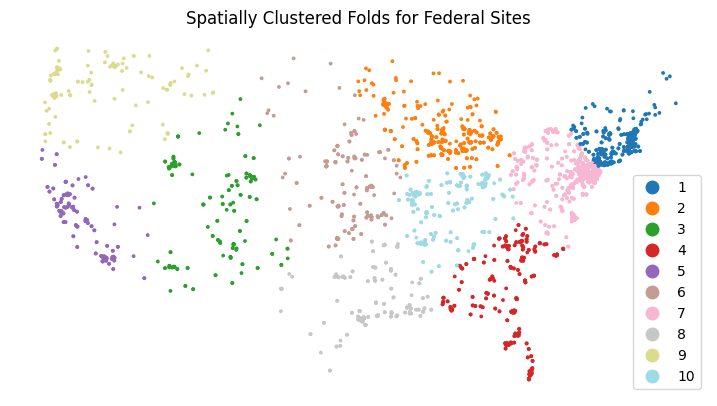

Clustering complete. Found 10 unique folds.


In [66]:
#Spatial Clustering

# 0. Re-initialize gdf_test from the original full_df, ensuring 'indicator' is present
#    and it is a pandas DataFrame, so the subsequent `if` block correctly converts it.
gdf_test = full_df.copy()

# Assuming 'gdf_test' currently exists as a Pandas DataFrame with 'lon'/'lat'
# First, ensure gdf_test is a GeoDataFrame, potentially converting it.
if not isinstance(gdf_test, gpd.GeoDataFrame) or 'geometry' not in gdf_test.columns:
    print("FIXING: Converting gdf_test from DataFrame to GeoDataFrame.")

    # 1. Define bands (assuming they start with 'A')
    bands = [col for col in gdf_test.columns if col.startswith('A')]

    # 2. DROP NaN ROWS HERE
    initial_len = len(gdf_test)
    gdf_test = gdf_test.dropna(subset=bands).reset_index(drop=True)
    dropped = initial_len - len(gdf_test)
    if dropped > 0:
        print(f"Dropped {dropped} rows with NaN satellite features.")

    # 3. Recreate the GeoDataFrame structure
    gdf_test = gpd.GeoDataFrame(
        gdf_test,
        geometry=gpd.points_from_xy(gdf_test['lon'], gdf_test['lat']),
        crs="EPSG:4326"
    )

# 4. Add an 'id' column: This MUST be done after gdf_test is definitively a GeoDataFrame
# and before it's used for clustering, as previous map cells don't add it.
gdf_test['id'] = range(len(gdf_test))

# --- 1. PREPARE GEODATAFRAME for Clustering ---
# The estimate_utm_crs() requires a GeoDataFrame input.
print("Re-projecting data to UTM for accurate clustering...")
federal_prj = gdf_test.copy().to_crs(gdf_test.estimate_utm_crs())

# --- 2. SPATIAL CLUSTER RESAMPLING ---
print(f"Starting spatial clustering into 10 folds ({len(federal_prj)} points)...")

federal_clusters = spatial_kfold_clusters(
  gdf=federal_prj,
  name='id',
  nfolds=10,
  algorithm='kmeans',
  n_init="auto",
  random_state=569
  )

# --- 3. PLOTTING ---
# Get the 'tab20' colormap
cols_tab = cm.get_cmap('tab20', 10)
cols = [cols_tab(i) for i in range(10)]
color_ramp = ListedColormap(cols)

# Create a final GeoDataFrame containing the original CRS and the new fold information
federal_clusters_map = gdf_test.merge(
    federal_clusters[['id', 'folds']],
    left_on='id',
    right_on='id'
)

fig, ax = plt.subplots(1,1 , figsize=(9, 9))
federal_clusters_map.plot(
    column='folds',
    ax=ax,
    cmap=color_ramp,
    markersize=3,
    legend=True,
    categorical=True
)
ax.set_title('Spatially Clustered Folds for Federal Sites')
ax.set_axis_off()

plt.show()

print(f"Clustering complete. Found {federal_clusters['folds'].nunique()} unique folds.")

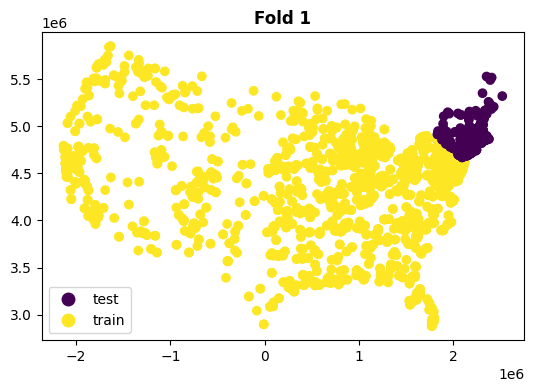

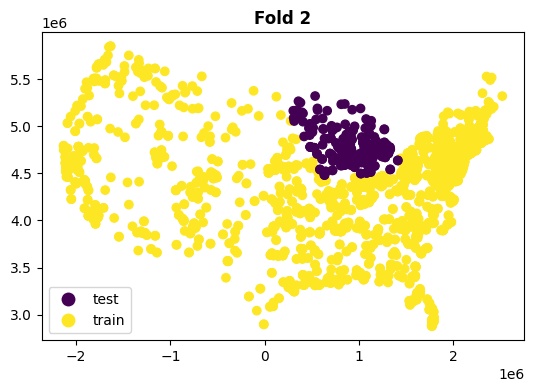

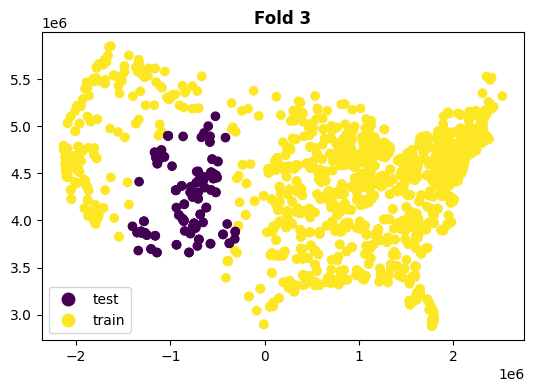

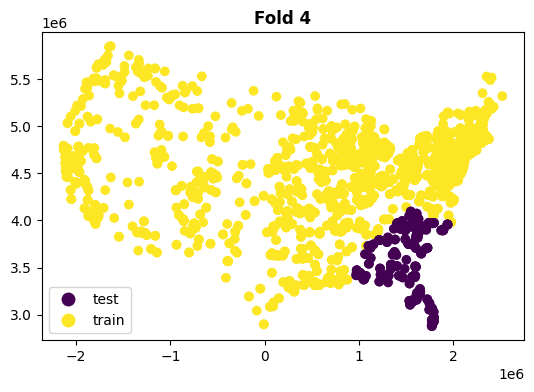

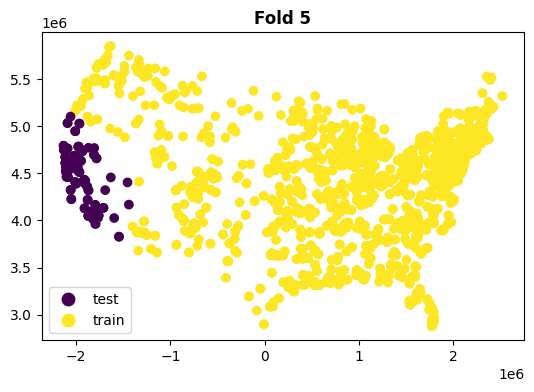

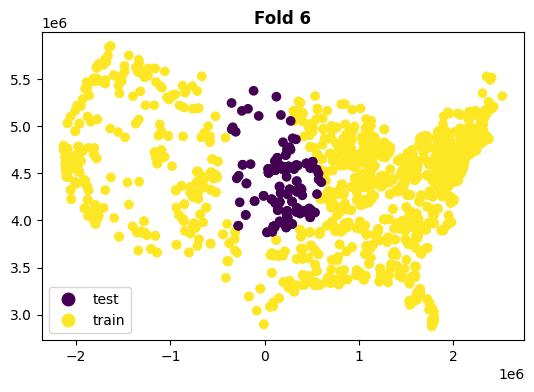

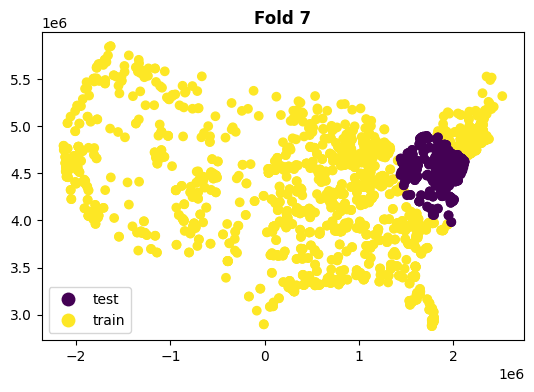

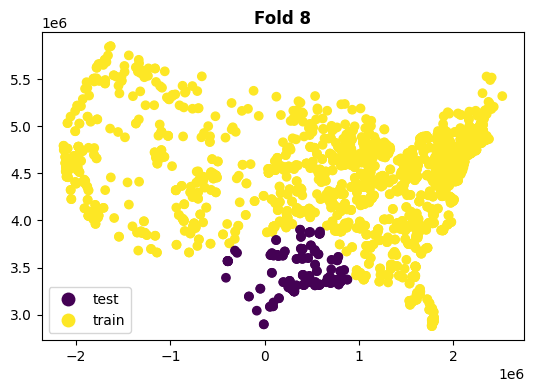

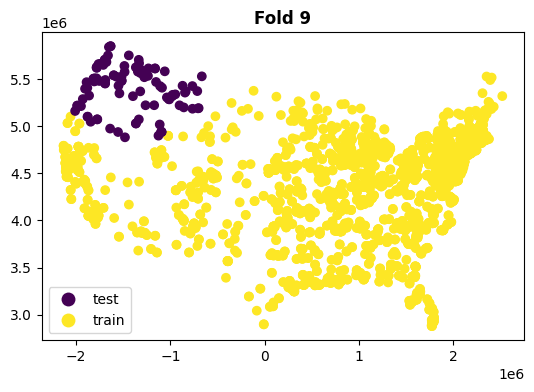

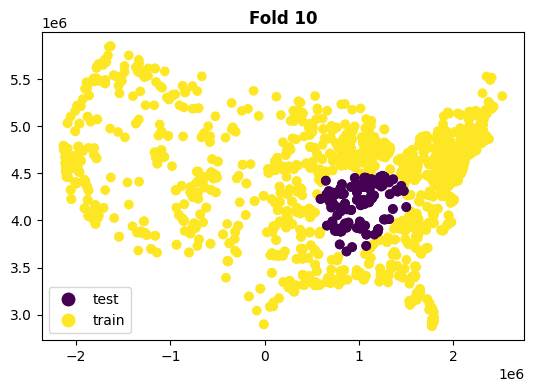

In [67]:
#Split for Spatial Clustering
for i in range(1,11):
    fig, ax = plt.subplots(1, 1 ,figsize=(9, 4))

    spatial_kfold_plot(X=federal_clusters,
                       geometry=federal_clusters.geometry,
                       groups=federal_clusters.folds,
                       fold_num=i, cmap='viridis', ax=ax)

In [68]:
# 1. Define the percentiles exported in the GEE .csv files
percentiles = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# 2. Create the list of feature columns matching the Axx_pxx format
feature_cols = []
for i in range(64):
    # Format band name to A00, A01... A63
    band_name = f"A0{i}" if i < 10 else f"A{i}"

    for p in percentiles:
        # Construct the column name like A00_p30
        col_name = f"{band_name}_p{p}"

        # Only add it if it actually exists in your merged dataframe
        if col_name in federal_prj.columns:
            feature_cols.append(col_name)

# 3. Define your target variable
y = federal_prj['indicator']

# 4. Filter your features to only include those in the list
X = federal_prj[feature_cols]

print(f"Total features identified: {len(feature_cols)}")

Total features identified: 704


In [69]:
#Check:
print(feature_cols)

['A00_p0', 'A00_p10', 'A00_p20', 'A00_p30', 'A00_p40', 'A00_p50', 'A00_p60', 'A00_p70', 'A00_p80', 'A00_p90', 'A00_p100', 'A01_p0', 'A01_p10', 'A01_p20', 'A01_p30', 'A01_p40', 'A01_p50', 'A01_p60', 'A01_p70', 'A01_p80', 'A01_p90', 'A01_p100', 'A02_p0', 'A02_p10', 'A02_p20', 'A02_p30', 'A02_p40', 'A02_p50', 'A02_p60', 'A02_p70', 'A02_p80', 'A02_p90', 'A02_p100', 'A03_p0', 'A03_p10', 'A03_p20', 'A03_p30', 'A03_p40', 'A03_p50', 'A03_p60', 'A03_p70', 'A03_p80', 'A03_p90', 'A03_p100', 'A04_p0', 'A04_p10', 'A04_p20', 'A04_p30', 'A04_p40', 'A04_p50', 'A04_p60', 'A04_p70', 'A04_p80', 'A04_p90', 'A04_p100', 'A05_p0', 'A05_p10', 'A05_p20', 'A05_p30', 'A05_p40', 'A05_p50', 'A05_p60', 'A05_p70', 'A05_p80', 'A05_p90', 'A05_p100', 'A06_p0', 'A06_p10', 'A06_p20', 'A06_p30', 'A06_p40', 'A06_p50', 'A06_p60', 'A06_p70', 'A06_p80', 'A06_p90', 'A06_p100', 'A07_p0', 'A07_p10', 'A07_p20', 'A07_p30', 'A07_p40', 'A07_p50', 'A07_p60', 'A07_p70', 'A07_p80', 'A07_p90', 'A07_p100', 'A08_p0', 'A08_p10', 'A08_p20',

In [70]:
#Check:
print(gdf_test['indicator'].value_counts())

indicator
1    1618
0    1502
Name: count, dtype: int64


In [71]:
# 1. Define your base model
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)

# Wrap it with FixedThresholdClassifier -- changes by what share of random zeros we have
custom_threshold_clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# --- 2. Keep the Cross-Validation Split ---
# kf remains the same (Random KFold)
# Fix: Use StratifiedKFold to ensure each fold has both classes, especially with imbalanced data.
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# --- 3. Change Scoring to Classificationa Metrics ---
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss' # A classification equivalent of mean squared error
]

# --- 4. Evaluate the model and collect the results ---
random_n_scores = cross_validate(
    custom_threshold_clf,
    X,
    y.values.ravel(),
    scoring=classification_scoring,
    cv=kf,
    n_jobs=-1,
    error_score='raise'
)

# Output the results dictionary
print("--- Cross-Validation Results (Classification) ---")
print(random_n_scores)

--- Cross-Validation Results (Classification) ---
{'fit_time': array([0.2667985 , 0.28507066, 0.27969813, 0.26438284, 0.27369976,
       0.29717541, 0.21032143, 0.26139069, 0.24935842, 0.21894503]), 'score_time': array([0.03353   , 0.03387284, 0.06017518, 0.03432369, 0.03479552,
       0.03240371, 0.03751922, 0.03729773, 0.03852177, 0.01908731]), 'test_roc_auc': array([0.66835391, 0.63934156, 0.66489712, 0.64164609, 0.58090535,
       0.64901235, 0.62831276, 0.63703704, 0.66986138, 0.62761713]), 'test_accuracy': array([0.62820513, 0.6025641 , 0.63782051, 0.58653846, 0.56089744,
       0.60897436, 0.58653846, 0.59294872, 0.61217949, 0.58974359]), 'test_precision': array([0.65333333, 0.6091954 , 0.64497041, 0.5988024 , 0.56906077,
       0.61494253, 0.60122699, 0.60606061, 0.61111111, 0.59428571]), 'test_neg_log_loss': array([-0.64756956, -0.66421711, -0.64939141, -0.66203664, -0.70275231,
       -0.66514975, -0.66287494, -0.66893954, -0.64715085, -0.67468586])}


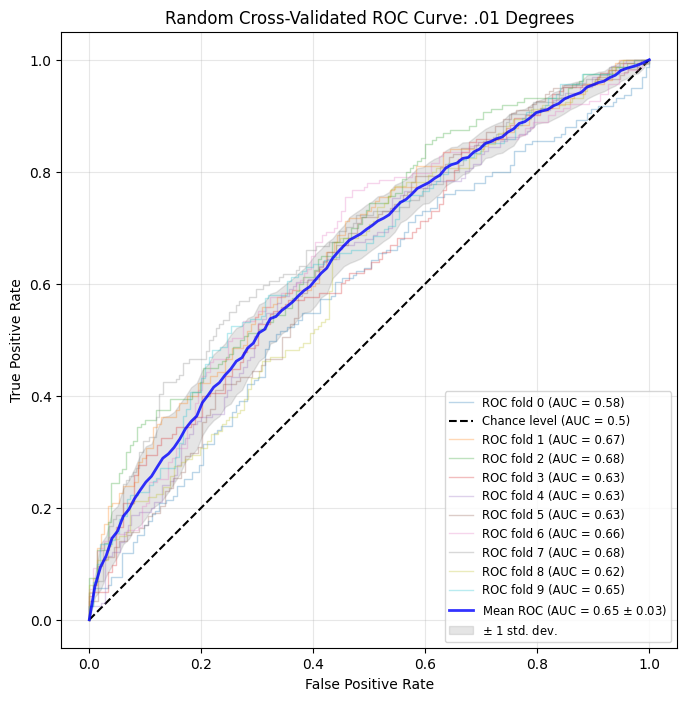

In [72]:
plt.close('all')
# --- 1. Setup ---
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)
clf = FixedThresholdClassifier(base_clf, threshold=0.5)
cv = KFold(n_splits=10, shuffle=True, random_state=123)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# --- 2. The Cross-Validation Loop ---
for fold, (train, test) in enumerate(cv.split(X, y)):
    # Fit on training data
    clf.fit(X.iloc[train], y.iloc[train].values.ravel())

    # Generate the curve for this fold
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test],
        y.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3, # Faded lines for individual folds
        lw=1,
        ax=ax,
        plot_chance_level=(fold == 0) # Only plot the 'Luck' line once
    )

    # Interpolate TPR to a common FPR grid to allow averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 3. Calculate Mean and Std Dev  ---
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

# Plot the strong Mean ROC line
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

# Add the shaded confidence interval (Standard Deviation)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

# --- 4. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Random Cross-Validated ROC Curve: .01 Degrees"
)
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [73]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Random Results: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Random Results: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.6407     0.6103    0.6006    0.6645
Median       0.6405     0.6076    0.5978    0.6635
Std Dev      0.0262     0.0242    0.0224    0.0164
Min (Worst)  0.5809     0.5691    0.5609    0.6472
Max (Best)   0.6699     0.6533    0.6378    0.7028
Q1 (25%)     0.6305     0.5994    0.5873    0.6526
Q3 (75%)     0.6609     0.6140    0.6114    0.6680


In [74]:
# --- RE-ESTABLISHING federal_prj_filtered ---

# 1. Merge the cluster/fold info into your main data
federal_prj = gdf_test.merge(federal_clusters[['id', 'folds']], on='id')

# 2. Identify and Drop empty folds (Option 1)
fold_summary = federal_prj.groupby('folds')['indicator'].sum()
empty_folds = fold_summary[fold_summary == 0].index.tolist()

print(f"Empty folds found: {empty_folds}")

# 3. Create the variable the model is looking for
federal_prj_filtered = federal_prj[~federal_prj['folds'].isin(empty_folds)].copy()

print(f"Variable 'federal_prj_filtered' is now defined with {len(federal_prj_filtered)} rows.")

Empty folds found: []
Variable 'federal_prj_filtered' is now defined with 3120 rows.


In [75]:
X = federal_prj_filtered[feature_cols]
y = federal_prj_filtered['indicator']
groups = federal_prj_filtered['folds']

logo = LeaveOneGroupOut()
clf = LogisticRegression(max_iter=5000, C=1.0, random_state=123)

# Lists to store metrics for each fold
aucs, accs, precs, log_losses = [], [], [], []
skipped_folds = []

print(f"Starting Spatial CV on {len(X)} samples...\n")

for train_idx, test_idx in logo.split(X, y, groups=groups):
    current_fold = groups.iloc[test_idx].unique()[0]
    y_test = y.iloc[test_idx]

    # 1. Skip check for single-label test sets
    if len(np.unique(y_test)) < 2:
        print(f"Fold {current_fold}: SKIPPED (No variance in test labels)")
        skipped_folds.append(current_fold)
        continue

    # 2. Train
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # 3. Predict (Probabilities for AUC/Log-Loss, Classes for Acc/Precision)
    y_probs = clf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = clf.predict(X.iloc[test_idx])

    # 4. Calculate and store metrics
    aucs.append(roc_auc_score(y_test, y_probs))
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=0))
    # neg_log_loss is -1 * log_loss
    log_losses.append(-log_loss(y_test, clf.predict_proba(X.iloc[test_idx])))

    print(f"Fold {current_fold}: PROCESSED (AUC: {aucs[-1]:.4f})")

# --- Final Summary Table ---
print(f"\n--- Final Results (Averages across {len(aucs)} folds) ---")
print(f"ROC-AUC:       {np.mean(aucs):.4f}")
print(f"Accuracy:      {np.mean(accs):.4f}")
print(f"Precision:     {np.mean(precs):.4f}")
print(f"Neg. Log Loss: {np.mean(log_losses):.4f}")

if skipped_folds:
    print(f"\nNote: Folds {skipped_folds} were excluded from these averages.")

Starting Spatial CV on 3120 samples...

Fold 1: PROCESSED (AUC: 0.6954)
Fold 2: PROCESSED (AUC: 0.6952)
Fold 3: PROCESSED (AUC: 0.5665)
Fold 4: PROCESSED (AUC: 0.5962)
Fold 5: PROCESSED (AUC: 0.6686)
Fold 6: PROCESSED (AUC: 0.6182)
Fold 7: PROCESSED (AUC: 0.6315)
Fold 8: PROCESSED (AUC: 0.5883)
Fold 9: PROCESSED (AUC: 0.7697)
Fold 10: PROCESSED (AUC: 0.5777)

--- Final Results (Averages across 10 folds) ---
ROC-AUC:       0.6407
Accuracy:      0.5912
Precision:     0.6043
Neg. Log Loss: -0.6907


Starting Spatial CV on 3120 samples with 10 clusters...



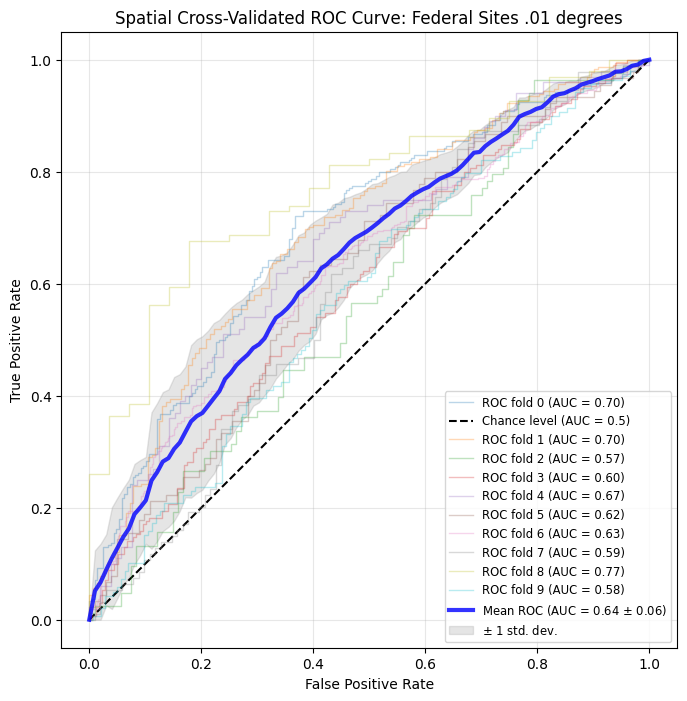

In [76]:
plt.close('all')

# --- 1. SETUP ---
logo = LeaveOneGroupOut()
tprs = [] # True Positive Rates
aucs = [] # Area Under the Curves
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# Use the features (X), labels (y), and spatial groups defined earlier
print(f"Starting Spatial CV on {len(X)} samples with {len(groups.unique())} clusters...\n")

# --- 2. The Spatial LOGO Loop ---
for fold, (train_idx, test_idx) in enumerate(logo.split(X, y, groups=groups)):
    y_test = y.iloc[test_idx]
    if len(np.unique(y_test)) < 2:
        continue

    # Train on everything EXCEPT the current cluster
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # Plot individual fold curve (thin, pastel colors)
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test_idx],
        y.iloc[test_idx],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        # Plot the dotted chance level line ONLY for the first valid fold
        plot_chance_level=(len(tprs) == 0)
    )

    # 3. INTERPOLATION for averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0 # Force curve to start at 0,0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 4. CACLULATE SPATIAL MEAN & VARIANCE ---
if tprs:
    # Calculate the mean of the True Positive Rates across all spatial folds
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    # Calculate Area under the MEAN curve (a slightly more robust statistic)
    mean_auc = auc(mean_fpr, mean_tpr)
    # Calculate Standard Deviation of the AUC values
    std_auc = np.std(aucs)

    # Plot the thick blue Mean ROC line
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="blue",
        # Text from the example: AUC = Mean ± StdDev
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=3, # Thick line
        alpha=0.8,
    )

    # Calculate and Plot the Shaded Variance Region (Standard Deviation)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1) # Keep upper boundary <= 1
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0) # Keep lower boundary >= 0

    # Fill the region
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

# --- 5. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Spatial Cross-Validated ROC Curve: Federal Sites .01 degrees"
)

# Use small legend and multiple columns to fit all the folds, matching the look
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

# Display the plot
plt.show()

In [77]:
# Assuming 'federal_prj_filtered' and 'federal_clusters' are available from previous cells.
# 'X' and 'y' are derived from 'federal_prj_filtered'.

# --- 0. Pre-filter data for cross_validate to avoid single-class test folds ---
# Identify groups that contain only one unique label (0 or 1)
# This is crucial for metrics like log_loss and roc_auc, which require at least two classes.
# We use federal_prj_filtered because X and y are based on it.
unique_labels_per_fold = federal_prj_filtered.groupby('folds')['indicator'].nunique()
problematic_folds_ids = unique_labels_per_fold[unique_labels_per_fold == 1].index.tolist()

# Filter X, y, and the groups array if problematic folds are found
if problematic_folds_ids:
    print(f"Warning: The following folds contain only one class and will be excluded from `cross_validate`: {problematic_folds_ids}")
    # Create a boolean mask for the rows to keep
    mask = ~federal_prj_filtered['folds'].isin(problematic_folds_ids)

    X_filtered = X[mask]
    y_filtered = y[mask]
    # Re-create spatial_folds_filtered to ensure it matches the filtered X and y
    spatial_folds_filtered = federal_prj_filtered[mask]['folds'].values.ravel()
else:
    X_filtered = X
    y_filtered = y
    spatial_folds_filtered = federal_prj_filtered['folds'].values.ravel() # Ensure this is always from federal_prj_filtered


# --- 1. Define the Estimator and Cross-Validator ---

# FIX: Use a fresh LogisticRegression estimator.
# We add stability settings (max_iter) and set regularization (C) to default.
clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# Initiate the Leave One Group Out cross-validator
group_cvs = LeaveOneGroupOut()

# --- 2. Evaluate the model and collect the results ---

# Use Classification Scoring
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss'
]

print("Starting Leave One Group Out (Spatial) Cross-Validation...")
# We pass the groups array directly to the 'groups' parameter of cross_validate.
spatial_cluster_scores = cross_validate(
    clf, # Uses the new LogisticRegression estimator
    X_filtered, # Use filtered X
    y_filtered.values.ravel(), # Use filtered y
    scoring=classification_scoring,
    cv=group_cvs,  # Pass the LOGO object
    groups=spatial_folds_filtered, # Pass the filtered spatial group IDs
    n_jobs=-1,
    error_score='raise'
)

print("\n--- Spatial Cross-Validation Complete ---")
print(f"Number of folds run: {len(spatial_cluster_scores['test_roc_auc'])}")
print("Results Summary:")
print(spatial_cluster_scores)

Starting Leave One Group Out (Spatial) Cross-Validation...

--- Spatial Cross-Validation Complete ---
Number of folds run: 10
Results Summary:
{'fit_time': array([0.27319312, 0.25032425, 0.31327486, 0.29088497, 0.319206  ,
       0.26000643, 0.17140055, 0.29452419, 0.26088905, 0.19445825]), 'score_time': array([0.03365421, 0.03406072, 0.04245758, 0.05847478, 0.03447318,
       0.03589821, 0.03915358, 0.03378725, 0.04037952, 0.01856256]), 'test_roc_auc': array([0.69541063, 0.69521546, 0.56649026, 0.59623265, 0.66857143,
       0.61819172, 0.63154023, 0.58833959, 0.76971726, 0.57765256]), 'test_accuracy': array([0.65995526, 0.64583333, 0.56315789, 0.56896552, 0.57560976,
       0.55208333, 0.59441489, 0.54591837, 0.65322581, 0.55319149]), 'test_precision': array([0.65602837, 0.66211604, 0.5       , 0.54672897, 0.53892216,
       0.53225806, 0.58578431, 0.5308642 , 0.93442623, 0.55555556]), 'test_neg_log_loss': array([-0.6346209 , -0.61652986, -0.73389777, -0.69230494, -0.79795247,
      

In [78]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.6407     0.6043    0.5912    0.6907
Median       0.6249     0.5511    0.5723    0.6875
Std Dev      0.0651     0.1277    0.0449    0.0513
Min (Worst)  0.5665     0.5000    0.5459    0.6165
Max (Best)   0.7697     0.9344    0.6600    0.7980
Q1 (25%)     0.5903     0.5339    0.5557    0.6684
Q3 (75%)     0.6886     0.6385    0.6330    0.7116


In [79]:
# The global list 'all_results_data' and 'add_result_row' function are defined in a previous cell.

# --- Calculate summary statistics for Random CV (25% case) ---
df_random_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Random CV'
})
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
random_summary_25 = df_random_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
random_summary_25.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# spatial_summary is already available from previous cell
# Re-create it here for clarity and to ensure it uses the correct data
df_spatial_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})
spatial_summary_25 = df_spatial_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
spatial_summary_25.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# --- POPULATING WITH YOUR PROVIDED NUMBERS (25% data) --- (using global add_result_row)
# Percentage refers to number of 0s compared to 1s

# 25% - Auto-populated with current run results
add_result_row(25, 'Random', 'auc', random_summary_25.loc['Mean', 'auc'], random_summary_25.loc['Median', 'auc'], random_summary_25.loc['Std Dev', 'auc'], random_summary_25.loc['Min (Worst)', 'auc'], random_summary_25.loc['Max (Best)', 'auc'], random_summary_25.loc['Q1 (25%)', 'auc'], random_summary_25.loc['Q3 (75%)', 'auc'])
add_result_row(25, 'Random', 'precision', random_summary_25.loc['Mean', 'precision'], random_summary_25.loc['Median', 'precision'], random_summary_25.loc['Std Dev', 'precision'], random_summary_25.loc['Min (Worst)', 'precision'], random_summary_25.loc['Max (Best)', 'precision'], random_summary_25.loc['Q1 (25%)', 'precision'], random_summary_25.loc['Q3 (75%)', 'precision'])
add_result_row(25, 'Random', 'accuracy', random_summary_25.loc['Mean', 'accuracy'], random_summary_25.loc['Median', 'accuracy'], random_summary_25.loc['Std Dev', 'accuracy'], random_summary_25.loc['Min (Worst)', 'accuracy'], random_summary_25.loc['Max (Best)', 'accuracy'], random_summary_25.loc['Q1 (25%)', 'accuracy'], random_summary_25.loc['Q3 (75%)', 'accuracy'])
add_result_row(25, 'Random', 'log_loss', random_summary_25.loc['Mean', 'log_loss'], random_summary_25.loc['Median', 'log_loss'], random_summary_25.loc['Std Dev', 'log_loss'], random_summary_25.loc['Min (Worst)', 'log_loss'], random_summary_25.loc['Max (Best)', 'log_loss'], random_summary_25.loc['Q1 (25%)', 'log_loss'], random_summary_25.loc['Q3 (75%)', 'log_loss'])
add_result_row(25, 'K fold', 'auc', spatial_summary_25.loc['Mean', 'auc'], spatial_summary_25.loc['Median', 'auc'], spatial_summary_25.loc['Std Dev', 'auc'], spatial_summary_25.loc['Min (Worst)', 'auc'], spatial_summary_25.loc['Max (Best)', 'auc'], spatial_summary_25.loc['Q1 (25%)', 'auc'], spatial_summary_25.loc['Q3 (75%)', 'auc'])
add_result_row(25, 'K fold', 'precision', spatial_summary_25.loc['Mean', 'precision'], spatial_summary_25.loc['Median', 'precision'], spatial_summary_25.loc['Std Dev', 'precision'], spatial_summary_25.loc['Min (Worst)', 'precision'], spatial_summary_25.loc['Max (Best)', 'precision'], spatial_summary_25.loc['Q1 (25%)', 'precision'], spatial_summary_25.loc['Q3 (75%)', 'precision'])
add_result_row(25, 'K fold', 'accuracy', spatial_summary_25.loc['Mean', 'accuracy'], spatial_summary_25.loc['Median', 'accuracy'], spatial_summary_25.loc['Std Dev', 'accuracy'], spatial_summary_25.loc['Min (Worst)', 'accuracy'], spatial_summary_25.loc['Max (Best)', 'accuracy'], spatial_summary_25.loc['Q1 (25%)', 'accuracy'], spatial_summary_25.loc['Q3 (75%)', 'accuracy'])
add_result_row(25, 'K fold', 'log_loss', spatial_summary_25.loc['Mean', 'log_loss'], spatial_summary_25.loc['Median', 'log_loss'], spatial_summary_25.loc['Std Dev', 'log_loss'], spatial_summary_25.loc['Min (Worst)', 'log_loss'], spatial_summary_25.loc['Max (Best)', 'log_loss'], spatial_summary_25.loc['Q1 (25%)', 'log_loss'], spatial_summary_25.loc['Q3 (75%)', 'log_loss'])

df_long = pd.DataFrame(all_results_data)

# Display the head and tail of the DataFrame to verify its content
display(df_long.head())
display(df_long.tail())

,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
0,0,Random,auc,0.599283,0.606855,0.033723,0.539208,0.648758,0.577315,0.620303
1,0,Random,precision,0.580127,0.580684,0.021568,0.549133,0.605263,0.560630,0.600631
2,0,Random,accuracy,0.578659,0.578535,0.019899,0.551402,0.608696,0.560559,0.595497
3,0,Random,log_loss,0.686363,0.679231,0.019394,0.657093,0.715019,0.676339,0.704478
4,0,K fold,auc,0.610727,0.605958,0.042650,0.556612,0.686356,0.585170,0.635894


,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
35,25,Random,log_loss,0.664477,0.663546,0.016370,0.647151,0.702752,0.652553,0.667992
36,25,K fold,auc,0.640736,0.624866,0.065131,0.566490,0.769717,0.590313,0.688554
37,25,K fold,precision,0.604268,0.551142,0.127702,0.500000,0.934426,0.533924,0.638467
38,25,K fold,accuracy,0.591236,0.572288,0.044868,0.545918,0.659955,0.555683,0.632979
39,25,K fold,log_loss,0.690653,0.687516,0.051345,0.616530,0.797952,0.668400,0.711571


#For 50% 0s

In [80]:
#For 50%
#------USER INPUT--------#
#input the folder path where your GEE .csv files are stored
folder_path = '/content/drive/MyDrive/Research/Young/MOSAIKS/superfund_project_summer2026/Data/Intermediate/Spatial K Folds/Federal/50/'
file_pattern = os.path.join(folder_path, 'GEE_featurization_federal_*.csv') #name pattern of files from GEE
file_list = glob.glob(file_pattern)

print(f"Found {len(file_list)} files to combine.")

# 3. Read each file into a list of DataFrames
df_list = [pd.read_csv(f) for f in file_list]

# 4. Concatenate (stack) them into one master DataFrame
full_df = pd.concat(df_list, ignore_index=True)

# 5. Check the final count to make sure it matches your # of points
print(f"Final combined row count: {len(full_df)}")
full_df.head()

gdf_test=full_df

Found 10 files to combine.
Final combined row count: 4525


FIXING: Converting gdf_test from DataFrame to GeoDataFrame.
Re-projecting data to UTM for accurate clustering...
Starting spatial clustering into 10 folds (4525 points)...


/tmp/ipykernel_2629/2168819861.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cols_tab = cm.get_cmap('tab20', 10)


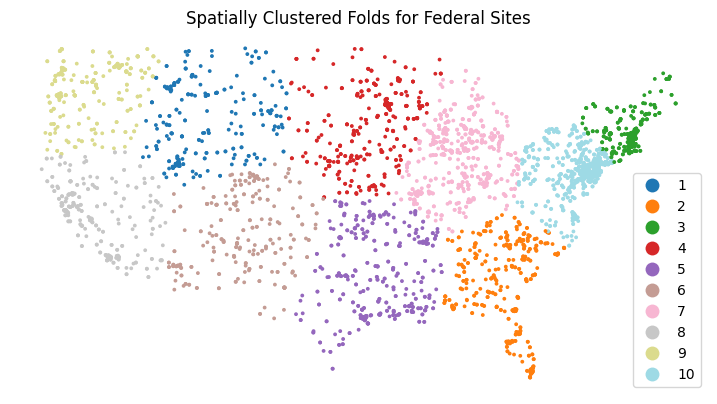

Clustering complete. Found 10 unique folds.


In [81]:
#Spatial Clustering

# 0. Re-initialize gdf_test from the original full_df, ensuring 'indicator' is present
#    and it is a pandas DataFrame, so the subsequent `if` block correctly converts it.
gdf_test = full_df.copy()

# Assuming 'gdf_test' currently exists as a Pandas DataFrame with 'lon'/'lat'
# First, ensure gdf_test is a GeoDataFrame, potentially converting it.
if not isinstance(gdf_test, gpd.GeoDataFrame) or 'geometry' not in gdf_test.columns:
    print("FIXING: Converting gdf_test from DataFrame to GeoDataFrame.")

    # 1. Define bands (assuming they start with 'A')
    bands = [col for col in gdf_test.columns if col.startswith('A')]

    # 2. DROP NaN ROWS HERE
    initial_len = len(gdf_test)
    gdf_test = gdf_test.dropna(subset=bands).reset_index(drop=True)
    dropped = initial_len - len(gdf_test)
    if dropped > 0:
        print(f"Dropped {dropped} rows with NaN satellite features.")

    # 3. Recreate the GeoDataFrame structure
    gdf_test = gpd.GeoDataFrame(
        gdf_test,
        geometry=gpd.points_from_xy(gdf_test['lon'], gdf_test['lat']),
        crs="EPSG:4326"
    )

# 4. Add an 'id' column: This MUST be done after gdf_test is definitively a GeoDataFrame
# and before it's used for clustering, as previous map cells don't add it.
gdf_test['id'] = range(len(gdf_test))

# --- 1. PREPARE GEODATAFRAME for Clustering ---
# The estimate_utm_crs() requires a GeoDataFrame input.
print("Re-projecting data to UTM for accurate clustering...")
federal_prj = gdf_test.copy().to_crs(gdf_test.estimate_utm_crs())

# --- 2. SPATIAL CLUSTER RESAMPLING ---
print(f"Starting spatial clustering into 10 folds ({len(federal_prj)} points)...")

federal_clusters = spatial_kfold_clusters(
  gdf=federal_prj,
  name='id',
  nfolds=10,
  algorithm='kmeans',
  n_init="auto",
  random_state=569
  )

# --- 3. PLOTTING ---
# Get the 'tab20' colormap
cols_tab = cm.get_cmap('tab20', 10)
cols = [cols_tab(i) for i in range(10)]
color_ramp = ListedColormap(cols)

# Create a final GeoDataFrame containing the original CRS and the new fold information
federal_clusters_map = gdf_test.merge(
    federal_clusters[['id', 'folds']],
    left_on='id',
    right_on='id'
)

fig, ax = plt.subplots(1,1 , figsize=(9, 9))
federal_clusters_map.plot(
    column='folds',
    ax=ax,
    cmap=color_ramp,
    markersize=3,
    legend=True,
    categorical=True
)
ax.set_title('Spatially Clustered Folds for Federal Sites')
ax.set_axis_off()

plt.show()

print(f"Clustering complete. Found {federal_clusters['folds'].nunique()} unique folds.")

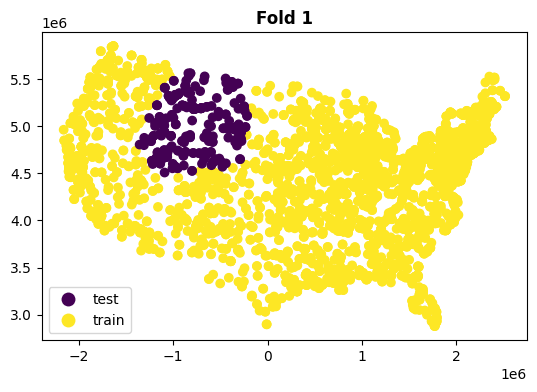

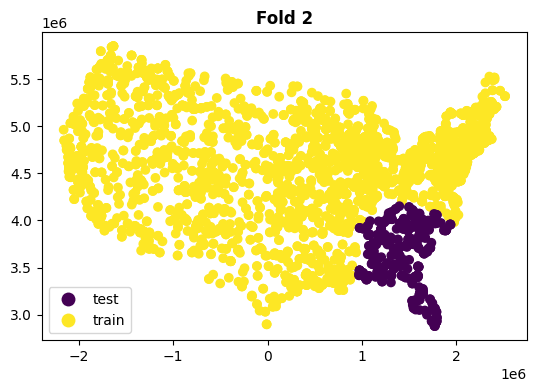

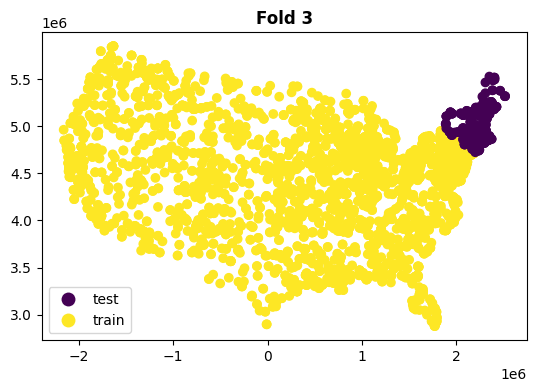

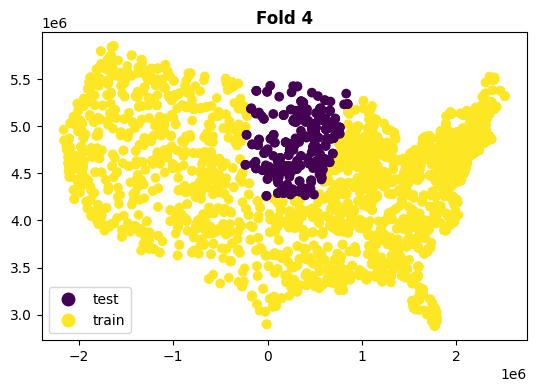

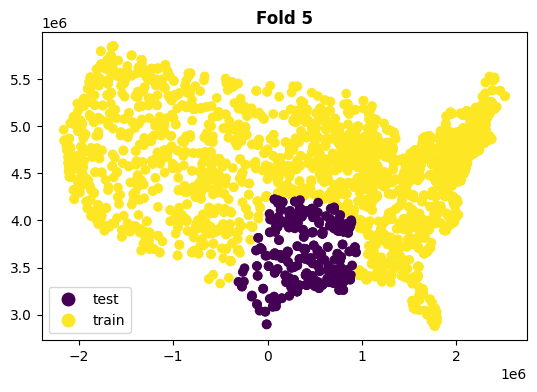

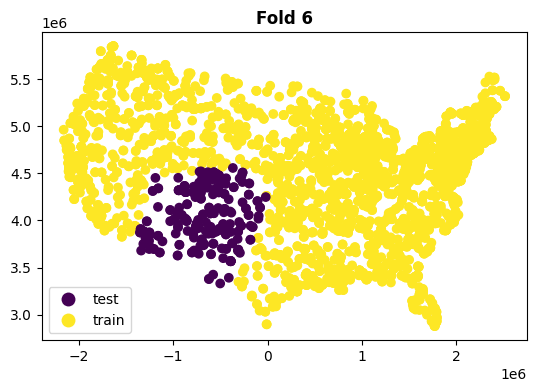

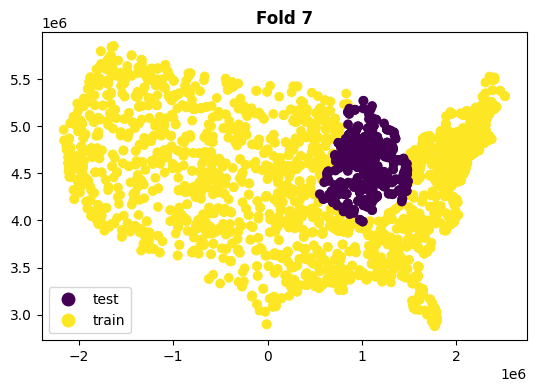

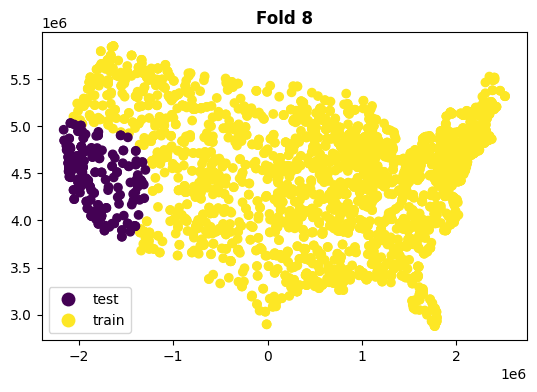

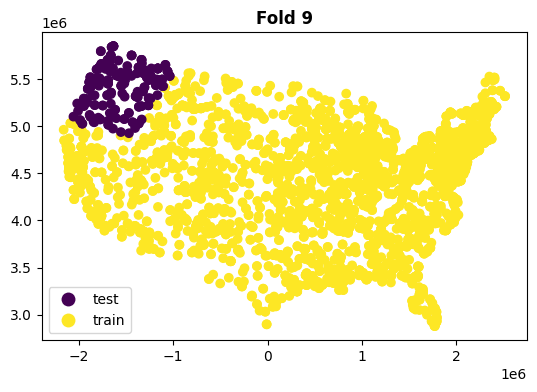

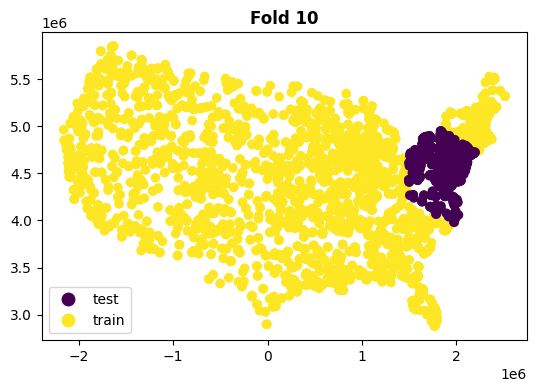

In [82]:
#Split for Spatial Clustering
for i in range(1,11):
    fig, ax = plt.subplots(1, 1 ,figsize=(9, 4))

    spatial_kfold_plot(X=federal_clusters,
                       geometry=federal_clusters.geometry,
                       groups=federal_clusters.folds,
                       fold_num=i, cmap='viridis', ax=ax)

In [83]:
# 1. Define the percentiles exported in the GEE .csv files
percentiles = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# 2. Create the list of feature columns matching the Axx_pxx format
feature_cols = []
for i in range(64):
    # Format band name to A00, A01... A63
    band_name = f"A0{i}" if i < 10 else f"A{i}"

    for p in percentiles:
        # Construct the column name like A00_p30
        col_name = f"{band_name}_p{p}"

        # Only add it if it actually exists in your merged dataframe
        if col_name in federal_prj.columns:
            feature_cols.append(col_name)

# 3. Define your target variable
y = federal_prj['indicator']

# 4. Filter your features to only include those in the list
X = federal_prj[feature_cols]

print(f"Total features identified: {len(feature_cols)}")

Total features identified: 704


In [84]:
#Check:
print(feature_cols)

['A00_p0', 'A00_p10', 'A00_p20', 'A00_p30', 'A00_p40', 'A00_p50', 'A00_p60', 'A00_p70', 'A00_p80', 'A00_p90', 'A00_p100', 'A01_p0', 'A01_p10', 'A01_p20', 'A01_p30', 'A01_p40', 'A01_p50', 'A01_p60', 'A01_p70', 'A01_p80', 'A01_p90', 'A01_p100', 'A02_p0', 'A02_p10', 'A02_p20', 'A02_p30', 'A02_p40', 'A02_p50', 'A02_p60', 'A02_p70', 'A02_p80', 'A02_p90', 'A02_p100', 'A03_p0', 'A03_p10', 'A03_p20', 'A03_p30', 'A03_p40', 'A03_p50', 'A03_p60', 'A03_p70', 'A03_p80', 'A03_p90', 'A03_p100', 'A04_p0', 'A04_p10', 'A04_p20', 'A04_p30', 'A04_p40', 'A04_p50', 'A04_p60', 'A04_p70', 'A04_p80', 'A04_p90', 'A04_p100', 'A05_p0', 'A05_p10', 'A05_p20', 'A05_p30', 'A05_p40', 'A05_p50', 'A05_p60', 'A05_p70', 'A05_p80', 'A05_p90', 'A05_p100', 'A06_p0', 'A06_p10', 'A06_p20', 'A06_p30', 'A06_p40', 'A06_p50', 'A06_p60', 'A06_p70', 'A06_p80', 'A06_p90', 'A06_p100', 'A07_p0', 'A07_p10', 'A07_p20', 'A07_p30', 'A07_p40', 'A07_p50', 'A07_p60', 'A07_p70', 'A07_p80', 'A07_p90', 'A07_p100', 'A08_p0', 'A08_p10', 'A08_p20',

In [85]:
#Check:
print(gdf_test['indicator'].value_counts())

indicator
0    2907
1    1618
Name: count, dtype: int64


In [86]:
# 1. Define your base model
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)

# Wrap it with FixedThresholdClassifier -- changes by what share of random zeros we have
custom_threshold_clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# --- 2. Keep the Cross-Validation Split ---
# kf remains the same (Random KFold)
# Fix: Use StratifiedKFold to ensure each fold has both classes, especially with imbalanced data.
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# --- 3. Change Scoring to Classificationa Metrics ---
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss' # A classification equivalent of mean squared error
]

# --- 4. Evaluate the model and collect the results ---
random_n_scores = cross_validate(
    custom_threshold_clf,
    X,
    y.values.ravel(),
    scoring=classification_scoring,
    cv=kf,
    n_jobs=-1,
    error_score='raise'
)

# Output the results dictionary
print("--- Cross-Validation Results (Classification) ---")
print(random_n_scores)

--- Cross-Validation Results (Classification) ---
{'fit_time': array([0.5519731 , 0.55893087, 0.49939203, 0.53180981, 0.5494647 ,
       0.51895022, 0.46386766, 0.46657157, 0.5466795 , 0.47967339]), 'score_time': array([0.03343391, 0.03506684, 0.03517151, 0.03558898, 0.0336864 ,
       0.03403211, 0.03500295, 0.03612089, 0.0216465 , 0.03802896]), 'test_roc_auc': array([0.723198  , 0.72837385, 0.6977642 , 0.70991897, 0.74634084,
       0.7366539 , 0.75821626, 0.73539804, 0.73234296, 0.72132932]), 'test_accuracy': array([0.69315673, 0.69094923, 0.66666667, 0.68211921, 0.71302428,
       0.70132743, 0.69247788, 0.6880531 , 0.68141593, 0.67477876]), 'test_precision': array([0.60952381, 0.58730159, 0.54263566, 0.57142857, 0.61940299,
       0.608     , 0.61386139, 0.58974359, 0.56390977, 0.54861111]), 'test_neg_log_loss': array([-0.57686494, -0.57244657, -0.60148915, -0.58322377, -0.55914493,
       -0.56903742, -0.55829271, -0.57072334, -0.57235544, -0.58304123])}


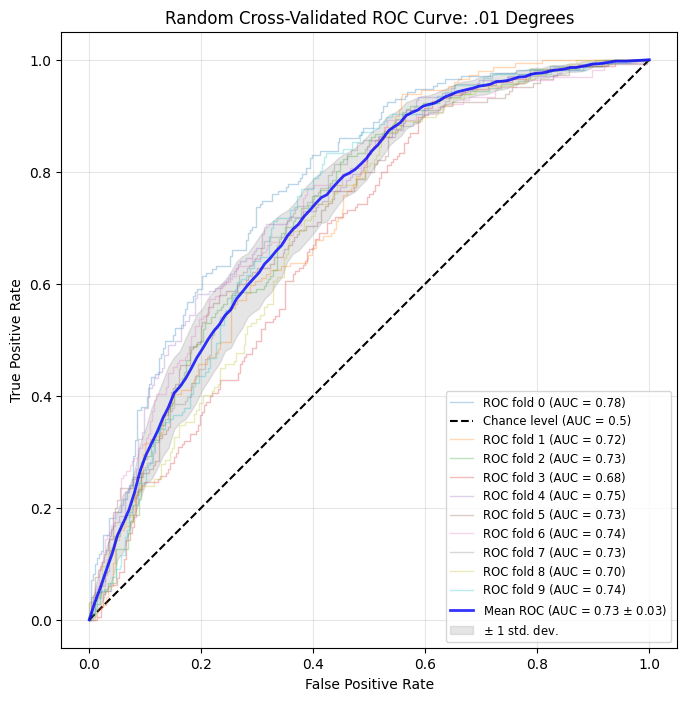

In [87]:
plt.close('all')
# --- 1. Setup ---
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)
clf = FixedThresholdClassifier(base_clf, threshold=0.5)
cv = KFold(n_splits=10, shuffle=True, random_state=123)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# --- 2. The Cross-Validation Loop ---
for fold, (train, test) in enumerate(cv.split(X, y)):
    # Fit on training data
    clf.fit(X.iloc[train], y.iloc[train].values.ravel())

    # Generate the curve for this fold
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test],
        y.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3, # Faded lines for individual folds
        lw=1,
        ax=ax,
        plot_chance_level=(fold == 0) # Only plot the 'Luck' line once
    )

    # Interpolate TPR to a common FPR grid to allow averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 3. Calculate Mean and Std Dev  ---
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

# Plot the strong Mean ROC line
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

# Add the shaded confidence interval (Standard Deviation)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

# --- 4. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Random Cross-Validated ROC Curve: .01 Degrees"
)
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [88]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Random Results: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Random Results: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.7290     0.5854    0.6884    0.5747
Median       0.7304     0.5885    0.6895    0.5724
Std Dev      0.0173     0.0277    0.0132    0.0126
Min (Worst)  0.6978     0.5426    0.6667    0.5583
Max (Best)   0.7582     0.6194    0.7130    0.6015
Q1 (25%)     0.7218     0.5658    0.6816    0.5695
Q3 (75%)     0.7363     0.6091    0.6930    0.5815


In [89]:
# --- RE-ESTABLISHING federal_prj_filtered ---

# 1. Merge the cluster/fold info into your main data
federal_prj = gdf_test.merge(federal_clusters[['id', 'folds']], on='id')

# 2. Identify and Drop empty folds (Option 1)
fold_summary = federal_prj.groupby('folds')['indicator'].sum()
empty_folds = fold_summary[fold_summary == 0].index.tolist()

print(f"Empty folds found: {empty_folds}")

# 3. Create the variable the model is looking for
federal_prj_filtered = federal_prj[~federal_prj['folds'].isin(empty_folds)].copy()

print(f"Variable 'federal_prj_filtered' is now defined with {len(federal_prj_filtered)} rows.")

Empty folds found: []
Variable 'federal_prj_filtered' is now defined with 4525 rows.


In [90]:
X = federal_prj_filtered[feature_cols]
y = federal_prj_filtered['indicator']
groups = federal_prj_filtered['folds']

logo = LeaveOneGroupOut()
clf = LogisticRegression(max_iter=5000, C=1.0, random_state=123)

# Lists to store metrics for each fold
aucs, accs, precs, log_losses = [], [], [], []
skipped_folds = []

print(f"Starting Spatial CV on {len(X)} samples...\n")

for train_idx, test_idx in logo.split(X, y, groups=groups):
    current_fold = groups.iloc[test_idx].unique()[0]
    y_test = y.iloc[test_idx]

    # 1. Skip check for single-label test sets
    if len(np.unique(y_test)) < 2:
        print(f"Fold {current_fold}: SKIPPED (No variance in test labels)")
        skipped_folds.append(current_fold)
        continue

    # 2. Train
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # 3. Predict (Probabilities for AUC/Log-Loss, Classes for Acc/Precision)
    y_probs = clf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = clf.predict(X.iloc[test_idx])

    # 4. Calculate and store metrics
    aucs.append(roc_auc_score(y_test, y_probs))
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=0))
    # neg_log_loss is -1 * log_loss
    log_losses.append(-log_loss(y_test, clf.predict_proba(X.iloc[test_idx])))

    print(f"Fold {current_fold}: PROCESSED (AUC: {aucs[-1]:.4f})")

# --- Final Summary Table ---
print(f"\n--- Final Results (Averages across {len(aucs)} folds) ---")
print(f"ROC-AUC:       {np.mean(aucs):.4f}")
print(f"Accuracy:      {np.mean(accs):.4f}")
print(f"Precision:     {np.mean(precs):.4f}")
print(f"Neg. Log Loss: {np.mean(log_losses):.4f}")

if skipped_folds:
    print(f"\nNote: Folds {skipped_folds} were excluded from these averages.")

Starting Spatial CV on 4525 samples...

Fold 1: PROCESSED (AUC: 0.8141)
Fold 2: PROCESSED (AUC: 0.6692)
Fold 3: PROCESSED (AUC: 0.7140)
Fold 4: PROCESSED (AUC: 0.7347)
Fold 5: PROCESSED (AUC: 0.6980)
Fold 6: PROCESSED (AUC: 0.7298)
Fold 7: PROCESSED (AUC: 0.6923)
Fold 8: PROCESSED (AUC: 0.7972)
Fold 9: PROCESSED (AUC: 0.7400)
Fold 10: PROCESSED (AUC: 0.6426)

--- Final Results (Averages across 10 folds) ---
ROC-AUC:       0.7232
Accuracy:      0.7083
Precision:     0.5711
Neg. Log Loss: -0.5526


Starting Spatial CV on 4525 samples with 10 clusters...



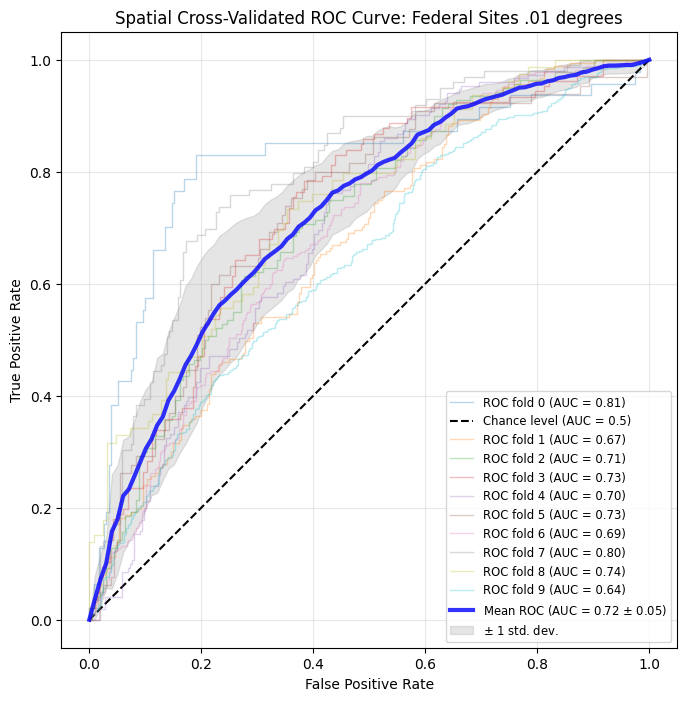

In [91]:
plt.close('all')

# --- 1. SETUP ---
logo = LeaveOneGroupOut()
tprs = [] # True Positive Rates
aucs = [] # Area Under the Curves
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# Use the features (X), labels (y), and spatial groups defined earlier
print(f"Starting Spatial CV on {len(X)} samples with {len(groups.unique())} clusters...\n")

# --- 2. The Spatial LOGO Loop ---
for fold, (train_idx, test_idx) in enumerate(logo.split(X, y, groups=groups)):
    y_test = y.iloc[test_idx]
    if len(np.unique(y_test)) < 2:
        continue

    # Train on everything EXCEPT the current cluster
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # Plot individual fold curve (thin, pastel colors)
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test_idx],
        y.iloc[test_idx],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        # Plot the dotted chance level line ONLY for the first valid fold
        plot_chance_level=(len(tprs) == 0)
    )

    # 3. INTERPOLATION for averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0 # Force curve to start at 0,0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 4. CACLULATE SPATIAL MEAN & VARIANCE ---
if tprs:
    # Calculate the mean of the True Positive Rates across all spatial folds
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    # Calculate Area under the MEAN curve (a slightly more robust statistic)
    mean_auc = auc(mean_fpr, mean_tpr)
    # Calculate Standard Deviation of the AUC values
    std_auc = np.std(aucs)

    # Plot the thick blue Mean ROC line
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="blue",
        # Text from the example: AUC = Mean ± StdDev
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=3, # Thick line
        alpha=0.8,
    )

    # Calculate and Plot the Shaded Variance Region (Standard Deviation)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1) # Keep upper boundary <= 1
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0) # Keep lower boundary >= 0

    # Fill the region
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

# --- 5. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Spatial Cross-Validated ROC Curve: Federal Sites .01 degrees"
)

# Use small legend and multiple columns to fit all the folds, matching the look
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

# Display the plot
plt.show()

In [92]:
# Assuming 'federal_prj_filtered' and 'federal_clusters' are available from previous cells.
# 'X' and 'y' are derived from 'federal_prj_filtered'.

# --- 0. Pre-filter data for cross_validate to avoid single-class test folds ---
# Identify groups that contain only one unique label (0 or 1)
# This is crucial for metrics like log_loss and roc_auc, which require at least two classes.
# We use federal_prj_filtered because X and y are based on it.
unique_labels_per_fold = federal_prj_filtered.groupby('folds')['indicator'].nunique()
problematic_folds_ids = unique_labels_per_fold[unique_labels_per_fold == 1].index.tolist()

# Filter X, y, and the groups array if problematic folds are found
if problematic_folds_ids:
    print(f"Warning: The following folds contain only one class and will be excluded from `cross_validate`: {problematic_folds_ids}")
    # Create a boolean mask for the rows to keep
    mask = ~federal_prj_filtered['folds'].isin(problematic_folds_ids)

    X_filtered = X[mask]
    y_filtered = y[mask]
    # Re-create spatial_folds_filtered to ensure it matches the filtered X and y
    spatial_folds_filtered = federal_prj_filtered[mask]['folds'].values.ravel()
else:
    X_filtered = X
    y_filtered = y
    spatial_folds_filtered = federal_prj_filtered['folds'].values.ravel() # Ensure this is always from federal_prj_filtered


# --- 1. Define the Estimator and Cross-Validator ---

# FIX: Use a fresh LogisticRegression estimator.
# We add stability settings (max_iter) and set regularization (C) to default.
clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# Initiate the Leave One Group Out cross-validator
group_cvs = LeaveOneGroupOut()

# --- 2. Evaluate the model and collect the results ---

# Use Classification Scoring
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss'
]

print("Starting Leave One Group Out (Spatial) Cross-Validation...")
# We pass the groups array directly to the 'groups' parameter of cross_validate.
spatial_cluster_scores = cross_validate(
    clf, # Uses the new LogisticRegression estimator
    X_filtered, # Use filtered X
    y_filtered.values.ravel(), # Use filtered y
    scoring=classification_scoring,
    cv=group_cvs,  # Pass the LOGO object
    groups=spatial_folds_filtered, # Pass the filtered spatial group IDs
    n_jobs=-1,
    error_score='raise'
)

print("\n--- Spatial Cross-Validation Complete ---")
print(f"Number of folds run: {len(spatial_cluster_scores['test_roc_auc'])}")
print("Results Summary:")
print(spatial_cluster_scores)

Starting Leave One Group Out (Spatial) Cross-Validation...

--- Spatial Cross-Validation Complete ---
Number of folds run: 10
Results Summary:
{'fit_time': array([0.59978342, 0.42540073, 0.46658707, 0.47239232, 0.41248751,
       0.50188017, 0.3949883 , 0.47123599, 0.51820874, 0.3154242 ]), 'score_time': array([0.03463697, 0.03705311, 0.034271  , 0.03635502, 0.03534389,
       0.03528619, 0.03659964, 0.03540158, 0.04136348, 0.02111053]), 'test_roc_auc': array([0.81406105, 0.66915333, 0.71396904, 0.73466592, 0.69799412,
       0.7298219 , 0.69231895, 0.79723342, 0.73997255, 0.64257932]), 'test_accuracy': array([0.85920578, 0.63034188, 0.65306122, 0.74327628, 0.6682243 ,
       0.75373134, 0.6448468 , 0.74503311, 0.7804878 , 0.6046748 ]), 'test_precision': array([0.65384615, 0.54022989, 0.56140351, 0.50724638, 0.53913043,
       0.47058824, 0.55172414, 0.62790698, 0.65217391, 0.60641399]), 'test_neg_log_loss': array([-0.35746387, -0.63006127, -0.61728735, -0.51320474, -0.59522544,
      

In [93]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.7232     0.5711    0.7083    0.5526
Median       0.7219     0.5566    0.7058    0.5652
Std Dev      0.0530     0.0619    0.0804    0.0921
Min (Worst)  0.6426     0.4706    0.6047    0.3575
Max (Best)   0.8141     0.6538    0.8592    0.6685
Q1 (25%)     0.6937     0.5394    0.6469    0.5101
Q3 (75%)     0.7386     0.6225    0.7516    0.6172


In [94]:
# The global list 'all_results_data' and 'add_result_row' function are defined in a previous cell.

# --- Calculate summary statistics for Random CV (50% case) ---
df_random_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Random CV'
})
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
random_summary_50 = df_random_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
random_summary_50.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# spatial_summary is already available from previous cell
# Re-create it here for clarity and to ensure it uses the correct data
df_spatial_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})
spatial_summary_50 = df_spatial_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
spatial_summary_50.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# --- POPULATING WITH YOUR PROVIDED NUMBERS (50% data) --- (using global add_result_row)
# Percentage refers to number of 0s compared to 1s

# 50% - Auto-populated with current run results
add_result_row(50, 'Random', 'auc', random_summary_50.loc['Mean', 'auc'], random_summary_50.loc['Median', 'auc'], random_summary_50.loc['Std Dev', 'auc'], random_summary_50.loc['Min (Worst)', 'auc'], random_summary_50.loc['Max (Best)', 'auc'], random_summary_50.loc['Q1 (25%)', 'auc'], random_summary_50.loc['Q3 (75%)', 'auc'])
add_result_row(50, 'Random', 'precision', random_summary_50.loc['Mean', 'precision'], random_summary_50.loc['Median', 'precision'], random_summary_50.loc['Std Dev', 'precision'], random_summary_50.loc['Min (Worst)', 'precision'], random_summary_50.loc['Max (Best)', 'precision'], random_summary_50.loc['Q1 (25%)', 'precision'], random_summary_50.loc['Q3 (75%)', 'precision'])
add_result_row(50, 'Random', 'accuracy', random_summary_50.loc['Mean', 'accuracy'], random_summary_50.loc['Median', 'accuracy'], random_summary_50.loc['Std Dev', 'accuracy'], random_summary_50.loc['Min (Worst)', 'accuracy'], random_summary_50.loc['Max (Best)', 'accuracy'], random_summary_50.loc['Q1 (25%)', 'accuracy'], random_summary_50.loc['Q3 (75%)', 'accuracy'])
add_result_row(50, 'Random', 'log_loss', random_summary_50.loc['Mean', 'log_loss'], random_summary_50.loc['Median', 'log_loss'], random_summary_50.loc['Std Dev', 'log_loss'], random_summary_50.loc['Min (Worst)', 'log_loss'], random_summary_50.loc['Max (Best)', 'log_loss'], random_summary_50.loc['Q1 (25%)', 'log_loss'], random_summary_50.loc['Q3 (75%)', 'log_loss'])
add_result_row(50, 'K fold', 'auc', spatial_summary_50.loc['Mean', 'auc'], spatial_summary_50.loc['Median', 'auc'], spatial_summary_50.loc['Std Dev', 'auc'], spatial_summary_50.loc['Min (Worst)', 'auc'], spatial_summary_50.loc['Max (Best)', 'auc'], spatial_summary_50.loc['Q1 (25%)', 'auc'], spatial_summary_50.loc['Q3 (75%)', 'auc'])
add_result_row(50, 'K fold', 'precision', spatial_summary_50.loc['Mean', 'precision'], spatial_summary_50.loc['Median', 'precision'], spatial_summary_50.loc['Std Dev', 'precision'], spatial_summary_50.loc['Min (Worst)', 'precision'], spatial_summary_50.loc['Max (Best)', 'precision'], spatial_summary_50.loc['Q1 (25%)', 'precision'], spatial_summary_50.loc['Q3 (75%)', 'precision'])
add_result_row(50, 'K fold', 'accuracy', spatial_summary_50.loc['Mean', 'accuracy'], spatial_summary_50.loc['Median', 'accuracy'], spatial_summary_50.loc['Std Dev', 'accuracy'], spatial_summary_50.loc['Min (Worst)', 'accuracy'], spatial_summary_50.loc['Max (Best)', 'accuracy'], spatial_summary_50.loc['Q1 (25%)', 'accuracy'], spatial_summary_50.loc['Q3 (75%)', 'accuracy'])
add_result_row(50, 'K fold', 'log_loss', spatial_summary_50.loc['Mean', 'log_loss'], spatial_summary_50.loc['Median', 'log_loss'], spatial_summary_50.loc['Std Dev', 'log_loss'], spatial_summary_50.loc['Min (Worst)', 'log_loss'], spatial_summary_50.loc['Max (Best)', 'log_loss'], spatial_summary_50.loc['Q1 (25%)', 'log_loss'], spatial_summary_50.loc['Q3 (75%)', 'log_loss'])

df_long = pd.DataFrame(all_results_data)

# Display the head and tail of the DataFrame to verify its content
display(df_long.head())
display(df_long.tail())

,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
0,0,Random,auc,0.599283,0.606855,0.033723,0.539208,0.648758,0.577315,0.620303
1,0,Random,precision,0.580127,0.580684,0.021568,0.549133,0.605263,0.560630,0.600631
2,0,Random,accuracy,0.578659,0.578535,0.019899,0.551402,0.608696,0.560559,0.595497
3,0,Random,log_loss,0.686363,0.679231,0.019394,0.657093,0.715019,0.676339,0.704478
4,0,K fold,auc,0.610727,0.605958,0.042650,0.556612,0.686356,0.585170,0.635894


,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
43,50,Random,log_loss,0.574662,0.572401,0.012624,0.558293,0.601489,0.569459,0.581497
44,50,K fold,auc,0.723177,0.721895,0.053008,0.642579,0.814061,0.693738,0.738646
45,50,K fold,precision,0.571066,0.556564,0.061930,0.470588,0.653846,0.539405,0.622534
46,50,K fold,accuracy,0.708288,0.705750,0.080360,0.604675,0.859206,0.646900,0.751557
47,50,K fold,log_loss,0.552562,0.565193,0.092085,0.357464,0.668479,0.510094,0.617235


#For 100% 0s

In [95]:
#For 100%
#------USER INPUT--------#
#input the folder path where your GEE .csv files are stored
folder_path = '/content/drive/MyDrive/Research/Young/MOSAIKS/superfund_project_summer2026/Data/Intermediate/Spatial K Folds/Federal/100/'
file_pattern = os.path.join(folder_path, 'GEE_featurization_federal_*.csv') #name pattern of files from GEE
file_list = glob.glob(file_pattern)

print(f"Found {len(file_list)} files to combine.")

# 3. Read each file into a list of DataFrames
df_list = [pd.read_csv(f) for f in file_list]

# 4. Concatenate (stack) them into one master DataFrame
full_df = pd.concat(df_list, ignore_index=True)

# 5. Check the final count to make sure it matches your # of points
print(f"Final combined row count: {len(full_df)}")
full_df.head()

gdf_test=full_df

Found 10 files to combine.
Final combined row count: 4834


FIXING: Converting gdf_test from DataFrame to GeoDataFrame.
Re-projecting data to UTM for accurate clustering...
Starting spatial clustering into 10 folds (4834 points)...


/tmp/ipykernel_2629/2168819861.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cols_tab = cm.get_cmap('tab20', 10)


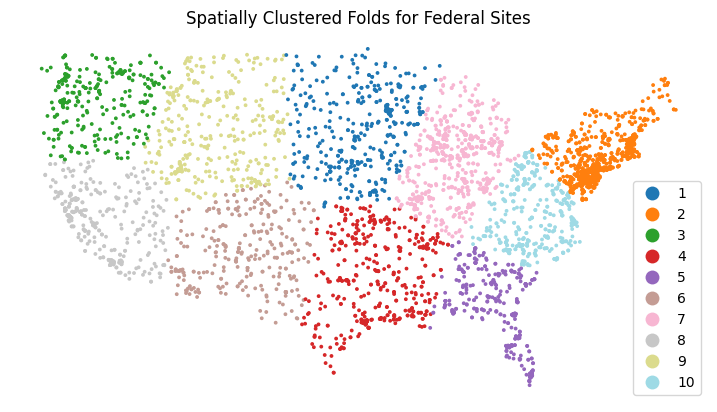

Clustering complete. Found 10 unique folds.


In [96]:
#Spatial Clustering

# 0. Re-initialize gdf_test from the original full_df, ensuring 'indicator' is present
#    and it is a pandas DataFrame, so the subsequent `if` block correctly converts it.
gdf_test = full_df.copy()

# Assuming 'gdf_test' currently exists as a Pandas DataFrame with 'lon'/'lat'
# First, ensure gdf_test is a GeoDataFrame, potentially converting it.
if not isinstance(gdf_test, gpd.GeoDataFrame) or 'geometry' not in gdf_test.columns:
    print("FIXING: Converting gdf_test from DataFrame to GeoDataFrame.")

    # 1. Define bands (assuming they start with 'A')
    bands = [col for col in gdf_test.columns if col.startswith('A')]

    # 2. DROP NaN ROWS HERE
    initial_len = len(gdf_test)
    gdf_test = gdf_test.dropna(subset=bands).reset_index(drop=True)
    dropped = initial_len - len(gdf_test)
    if dropped > 0:
        print(f"Dropped {dropped} rows with NaN satellite features.")

    # 3. Recreate the GeoDataFrame structure
    gdf_test = gpd.GeoDataFrame(
        gdf_test,
        geometry=gpd.points_from_xy(gdf_test['lon'], gdf_test['lat']),
        crs="EPSG:4326"
    )

# 4. Add an 'id' column: This MUST be done after gdf_test is definitively a GeoDataFrame
# and before it's used for clustering, as previous map cells don't add it.
gdf_test['id'] = range(len(gdf_test))

# --- 1. PREPARE GEODATAFRAME for Clustering ---
# The estimate_utm_crs() requires a GeoDataFrame input.
print("Re-projecting data to UTM for accurate clustering...")
federal_prj = gdf_test.copy().to_crs(gdf_test.estimate_utm_crs())

# --- 2. SPATIAL CLUSTER RESAMPLING ---
print(f"Starting spatial clustering into 10 folds ({len(federal_prj)} points)...")

federal_clusters = spatial_kfold_clusters(
  gdf=federal_prj,
  name='id',
  nfolds=10,
  algorithm='kmeans',
  n_init="auto",
  random_state=569
  )

# --- 3. PLOTTING ---
# Get the 'tab20' colormap
cols_tab = cm.get_cmap('tab20', 10)
cols = [cols_tab(i) for i in range(10)]
color_ramp = ListedColormap(cols)

# Create a final GeoDataFrame containing the original CRS and the new fold information
federal_clusters_map = gdf_test.merge(
    federal_clusters[['id', 'folds']],
    left_on='id',
    right_on='id'
)

fig, ax = plt.subplots(1,1 , figsize=(9, 9))
federal_clusters_map.plot(
    column='folds',
    ax=ax,
    cmap=color_ramp,
    markersize=3,
    legend=True,
    categorical=True
)
ax.set_title('Spatially Clustered Folds for Federal Sites')
ax.set_axis_off()

plt.show()

print(f"Clustering complete. Found {federal_clusters['folds'].nunique()} unique folds.")

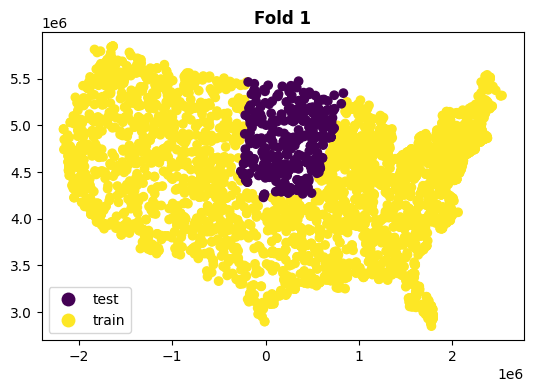

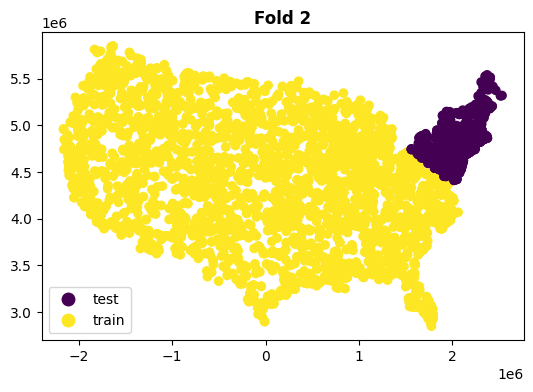

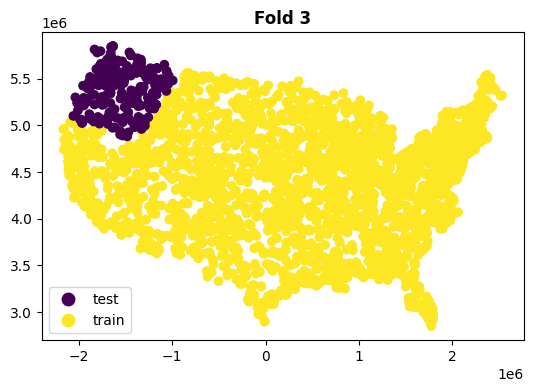

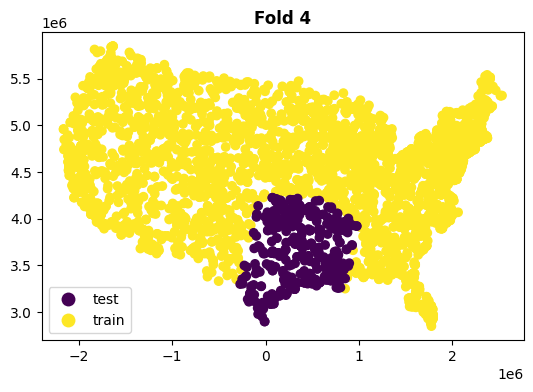

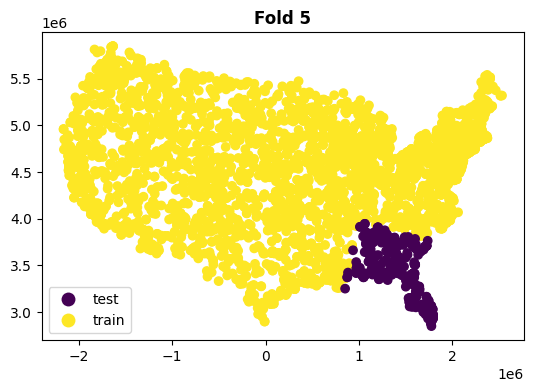

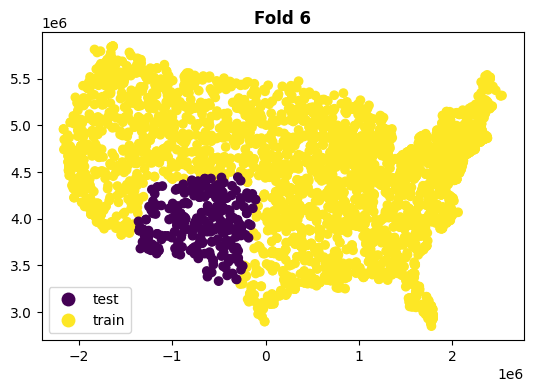

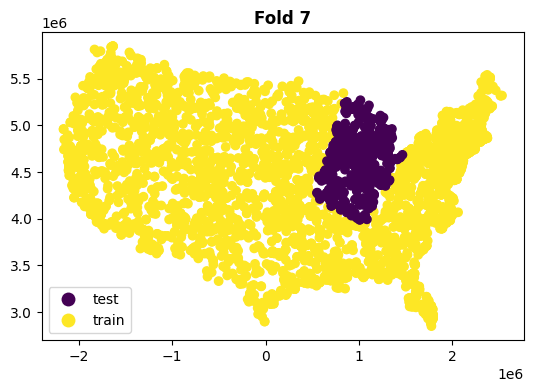

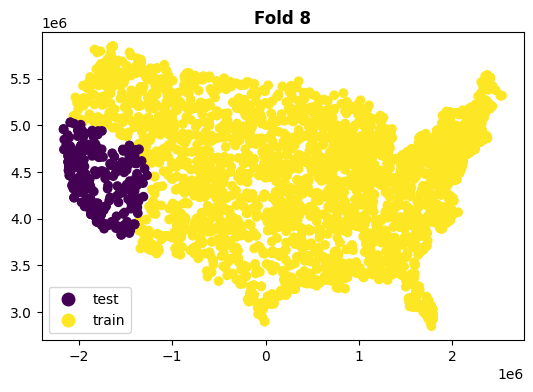

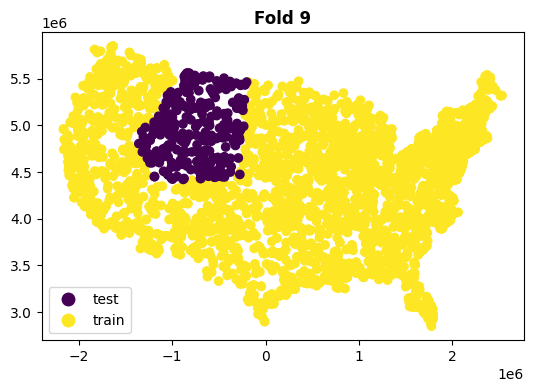

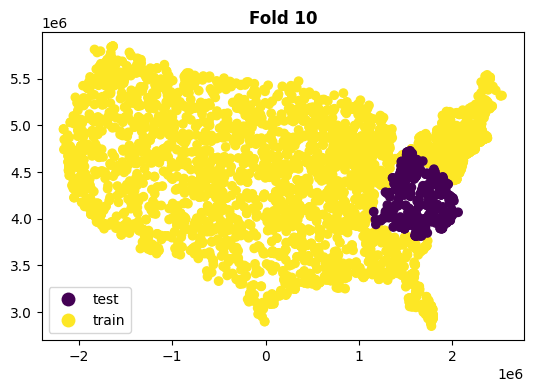

In [97]:
#Split for Spatial Clustering
for i in range(1,11):
    fig, ax = plt.subplots(1, 1 ,figsize=(9, 4))

    spatial_kfold_plot(X=federal_clusters,
                       geometry=federal_clusters.geometry,
                       groups=federal_clusters.folds,
                       fold_num=i, cmap='viridis', ax=ax)

In [98]:
# 1. Define the percentiles exported in the GEE .csv files
percentiles = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# 2. Create the list of feature columns matching the Axx_pxx format
feature_cols = []
for i in range(64):
    # Format band name to A00, A01... A63
    band_name = f"A0{i}" if i < 10 else f"A{i}"

    for p in percentiles:
        # Construct the column name like A00_p30
        col_name = f"{band_name}_p{p}"

        # Only add it if it actually exists in your merged dataframe
        if col_name in federal_prj.columns:
            feature_cols.append(col_name)

# 3. Define your target variable
y = federal_prj['indicator']

# 4. Filter your features to only include those in the list
X = federal_prj[feature_cols]

print(f"Total features identified: {len(feature_cols)}")

Total features identified: 704


In [99]:
#Check:
print(feature_cols)

['A00_p0', 'A00_p10', 'A00_p20', 'A00_p30', 'A00_p40', 'A00_p50', 'A00_p60', 'A00_p70', 'A00_p80', 'A00_p90', 'A00_p100', 'A01_p0', 'A01_p10', 'A01_p20', 'A01_p30', 'A01_p40', 'A01_p50', 'A01_p60', 'A01_p70', 'A01_p80', 'A01_p90', 'A01_p100', 'A02_p0', 'A02_p10', 'A02_p20', 'A02_p30', 'A02_p40', 'A02_p50', 'A02_p60', 'A02_p70', 'A02_p80', 'A02_p90', 'A02_p100', 'A03_p0', 'A03_p10', 'A03_p20', 'A03_p30', 'A03_p40', 'A03_p50', 'A03_p60', 'A03_p70', 'A03_p80', 'A03_p90', 'A03_p100', 'A04_p0', 'A04_p10', 'A04_p20', 'A04_p30', 'A04_p40', 'A04_p50', 'A04_p60', 'A04_p70', 'A04_p80', 'A04_p90', 'A04_p100', 'A05_p0', 'A05_p10', 'A05_p20', 'A05_p30', 'A05_p40', 'A05_p50', 'A05_p60', 'A05_p70', 'A05_p80', 'A05_p90', 'A05_p100', 'A06_p0', 'A06_p10', 'A06_p20', 'A06_p30', 'A06_p40', 'A06_p50', 'A06_p60', 'A06_p70', 'A06_p80', 'A06_p90', 'A06_p100', 'A07_p0', 'A07_p10', 'A07_p20', 'A07_p30', 'A07_p40', 'A07_p50', 'A07_p60', 'A07_p70', 'A07_p80', 'A07_p90', 'A07_p100', 'A08_p0', 'A08_p10', 'A08_p20',

In [100]:
#Check:
print(gdf_test['indicator'].value_counts())

indicator
0    3216
1    1618
Name: count, dtype: int64


In [101]:
# 1. Define your base model
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)

# Wrap it with FixedThresholdClassifier -- changes by what share of random zeros we have
custom_threshold_clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# --- 2. Keep the Cross-Validation Split ---
# kf remains the same (Random KFold)
# Fix: Use StratifiedKFold to ensure each fold has both classes, especially with imbalanced data.
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# --- 3. Change Scoring to Classificationa Metrics ---
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss' # A classification equivalent of mean squared error
]

# --- 4. Evaluate the model and collect the results ---
random_n_scores = cross_validate(
    custom_threshold_clf,
    X,
    y.values.ravel(),
    scoring=classification_scoring,
    cv=kf,
    n_jobs=-1,
    error_score='raise'
)

# Output the results dictionary
print("--- Cross-Validation Results (Classification) ---")
print(random_n_scores)

--- Cross-Validation Results (Classification) ---
{'fit_time': array([0.52591205, 0.51847434, 0.57034326, 0.55181479, 0.57271934,
       0.54548097, 0.53536081, 0.49697256, 0.54464173, 0.4708693 ]), 'score_time': array([0.03083086, 0.03441572, 0.0334084 , 0.0350709 , 0.03749943,
       0.03383017, 0.03337312, 0.03503561, 0.01874685, 0.0348947 ]), 'test_roc_auc': array([0.7773752 , 0.7740204 , 0.7359865 , 0.75623035, 0.78413256,
       0.76893253, 0.73993308, 0.75843237, 0.78114303, 0.75860544]), 'test_accuracy': array([0.70247934, 0.72727273, 0.69421488, 0.69628099, 0.72670807,
       0.70600414, 0.67701863, 0.70393375, 0.72877847, 0.71221532]), 'test_precision': array([0.575     , 0.60714286, 0.5472973 , 0.55725191, 0.60431655,
       0.57723577, 0.52112676, 0.5785124 , 0.62809917, 0.58914729]), 'test_neg_log_loss': array([-0.51829454, -0.53204688, -0.55648744, -0.54080334, -0.5133706 ,
       -0.52981626, -0.55916817, -0.53890536, -0.51901182, -0.54034965])}


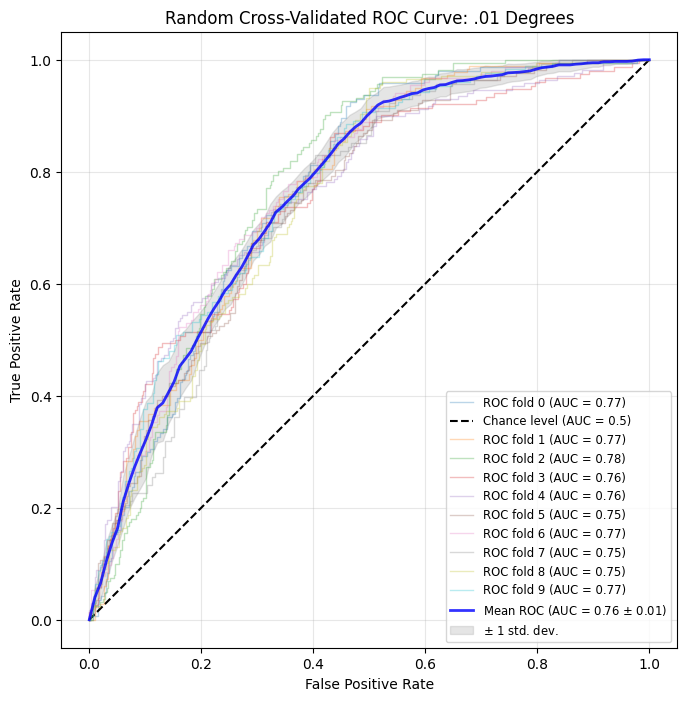

In [102]:
plt.close('all')
# --- 1. Setup ---
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)
clf = FixedThresholdClassifier(base_clf, threshold=0.5)
cv = KFold(n_splits=10, shuffle=True, random_state=123)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# --- 2. The Cross-Validation Loop ---
for fold, (train, test) in enumerate(cv.split(X, y)):
    # Fit on training data
    clf.fit(X.iloc[train], y.iloc[train].values.ravel())

    # Generate the curve for this fold
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test],
        y.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3, # Faded lines for individual folds
        lw=1,
        ax=ax,
        plot_chance_level=(fold == 0) # Only plot the 'Luck' line once
    )

    # Interpolate TPR to a common FPR grid to allow averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 3. Calculate Mean and Std Dev  ---
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

# Plot the strong Mean ROC line
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

# Add the shaded confidence interval (Standard Deviation)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

# --- 4. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Random Cross-Validated ROC Curve: .01 Degrees"
)
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [103]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Random Results: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Random Results: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.7635     0.5785    0.7075    0.5348
Median       0.7638     0.5779    0.7050    0.5355
Std Dev      0.0166     0.0313    0.0167    0.0155
Min (Worst)  0.7360     0.5211    0.6770    0.5134
Max (Best)   0.7841     0.6281    0.7288    0.5592
Q1 (25%)     0.7568     0.5617    0.6978    0.5217
Q3 (75%)     0.7765     0.6005    0.7231    0.5407


In [104]:
# --- RE-ESTABLISHING federal_prj_filtered ---

# 1. Merge the cluster/fold info into your main data
federal_prj = gdf_test.merge(federal_clusters[['id', 'folds']], on='id')

# 2. Identify and Drop empty folds (Option 1)
fold_summary = federal_prj.groupby('folds')['indicator'].sum()
empty_folds = fold_summary[fold_summary == 0].index.tolist()

print(f"Empty folds found: {empty_folds}")

# 3. Create the variable the model is looking for
federal_prj_filtered = federal_prj[~federal_prj['folds'].isin(empty_folds)].copy()

print(f"Variable 'federal_prj_filtered' is now defined with {len(federal_prj_filtered)} rows.")

Empty folds found: []
Variable 'federal_prj_filtered' is now defined with 4834 rows.


In [105]:
X = federal_prj_filtered[feature_cols]
y = federal_prj_filtered['indicator']
groups = federal_prj_filtered['folds']

logo = LeaveOneGroupOut()
clf = LogisticRegression(max_iter=5000, C=1.0, random_state=123)

# Lists to store metrics for each fold
aucs, accs, precs, log_losses = [], [], [], []
skipped_folds = []

print(f"Starting Spatial CV on {len(X)} samples...\n")

for train_idx, test_idx in logo.split(X, y, groups=groups):
    current_fold = groups.iloc[test_idx].unique()[0]
    y_test = y.iloc[test_idx]

    # 1. Skip check for single-label test sets
    if len(np.unique(y_test)) < 2:
        print(f"Fold {current_fold}: SKIPPED (No variance in test labels)")
        skipped_folds.append(current_fold)
        continue

    # 2. Train
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # 3. Predict (Probabilities for AUC/Log-Loss, Classes for Acc/Precision)
    y_probs = clf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = clf.predict(X.iloc[test_idx])

    # 4. Calculate and store metrics
    aucs.append(roc_auc_score(y_test, y_probs))
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=0))
    # neg_log_loss is -1 * log_loss
    log_losses.append(-log_loss(y_test, clf.predict_proba(X.iloc[test_idx])))

    print(f"Fold {current_fold}: PROCESSED (AUC: {aucs[-1]:.4f})")

# --- Final Summary Table ---
print(f"\n--- Final Results (Averages across {len(aucs)} folds) ---")
print(f"ROC-AUC:       {np.mean(aucs):.4f}")
print(f"Accuracy:      {np.mean(accs):.4f}")
print(f"Precision:     {np.mean(precs):.4f}")
print(f"Neg. Log Loss: {np.mean(log_losses):.4f}")

if skipped_folds:
    print(f"\nNote: Folds {skipped_folds} were excluded from these averages.")

Starting Spatial CV on 4834 samples...

Fold 1: PROCESSED (AUC: 0.8004)
Fold 2: PROCESSED (AUC: 0.6689)
Fold 3: PROCESSED (AUC: 0.8127)
Fold 4: PROCESSED (AUC: 0.7428)
Fold 5: PROCESSED (AUC: 0.7433)
Fold 6: PROCESSED (AUC: 0.7826)
Fold 7: PROCESSED (AUC: 0.7185)
Fold 8: PROCESSED (AUC: 0.8351)
Fold 9: PROCESSED (AUC: 0.8394)
Fold 10: PROCESSED (AUC: 0.6947)

--- Final Results (Averages across 10 folds) ---
ROC-AUC:       0.7638
Accuracy:      0.7392
Precision:     0.5974
Neg. Log Loss: -0.5058


Starting Spatial CV on 4834 samples with 10 clusters...



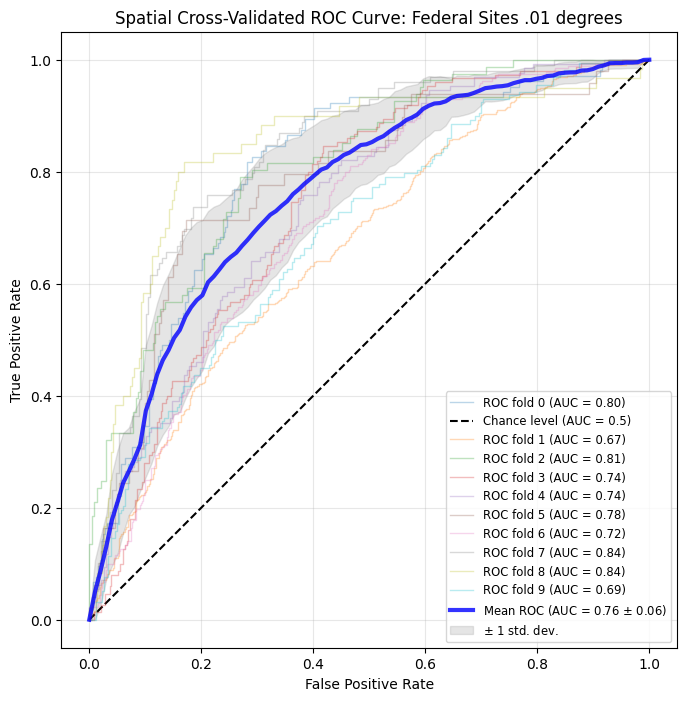

In [106]:
plt.close('all')

# --- 1. SETUP ---
logo = LeaveOneGroupOut()
tprs = [] # True Positive Rates
aucs = [] # Area Under the Curves
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# Use the features (X), labels (y), and spatial groups defined earlier
print(f"Starting Spatial CV on {len(X)} samples with {len(groups.unique())} clusters...\n")

# --- 2. The Spatial LOGO Loop ---
for fold, (train_idx, test_idx) in enumerate(logo.split(X, y, groups=groups)):
    y_test = y.iloc[test_idx]
    if len(np.unique(y_test)) < 2:
        continue

    # Train on everything EXCEPT the current cluster
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # Plot individual fold curve (thin, pastel colors)
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test_idx],
        y.iloc[test_idx],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        # Plot the dotted chance level line ONLY for the first valid fold
        plot_chance_level=(len(tprs) == 0)
    )

    # 3. INTERPOLATION for averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0 # Force curve to start at 0,0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 4. CACLULATE SPATIAL MEAN & VARIANCE ---
if tprs:
    # Calculate the mean of the True Positive Rates across all spatial folds
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    # Calculate Area under the MEAN curve (a slightly more robust statistic)
    mean_auc = auc(mean_fpr, mean_tpr)
    # Calculate Standard Deviation of the AUC values
    std_auc = np.std(aucs)

    # Plot the thick blue Mean ROC line
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="blue",
        # Text from the example: AUC = Mean ± StdDev
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=3, # Thick line
        alpha=0.8,
    )

    # Calculate and Plot the Shaded Variance Region (Standard Deviation)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1) # Keep upper boundary <= 1
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0) # Keep lower boundary >= 0

    # Fill the region
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

# --- 5. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Spatial Cross-Validated ROC Curve: Federal Sites .01 degrees"
)

# Use small legend and multiple columns to fit all the folds, matching the look
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [107]:
# Assuming 'federal_prj_filtered' and 'federal_clusters' are available from previous cells.
# 'X' and 'y' are derived from 'federal_prj_filtered'.

# --- 0. Pre-filter data for cross_validate to avoid single-class test folds ---
# Identify groups that contain only one unique label (0 or 1)
# This is crucial for metrics like log_loss and roc_auc, which require at least two classes.
# We use federal_prj_filtered because X and y are based on it.
unique_labels_per_fold = federal_prj_filtered.groupby('folds')['indicator'].nunique()
problematic_folds_ids = unique_labels_per_fold[unique_labels_per_fold == 1].index.tolist()

# Filter X, y, and the groups array if problematic folds are found
if problematic_folds_ids:
    print(f"Warning: The following folds contain only one class and will be excluded from `cross_validate`: {problematic_folds_ids}")
    # Create a boolean mask for the rows to keep
    mask = ~federal_prj_filtered['folds'].isin(problematic_folds_ids)

    X_filtered = X[mask]
    y_filtered = y[mask]
    # Re-create spatial_folds_filtered to ensure it matches the filtered X and y
    spatial_folds_filtered = federal_prj_filtered[mask]['folds'].values.ravel()
else:
    X_filtered = X
    y_filtered = y
    spatial_folds_filtered = federal_prj_filtered['folds'].values.ravel() # Ensure this is always from federal_prj_filtered


# --- 1. Define the Estimator and Cross-Validator ---

# FIX: Use a fresh LogisticRegression estimator.
# We add stability settings (max_iter) and set regularization (C) to default.
clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# Initiate the Leave One Group Out cross-validator
group_cvs = LeaveOneGroupOut()

# --- 2. Evaluate the model and collect the results ---

# Use Classification Scoring
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss'
]

print("Starting Leave One Group Out (Spatial) Cross-Validation...")
# We pass the groups array directly to the 'groups' parameter of cross_validate.
spatial_cluster_scores = cross_validate(
    clf, # Uses the new LogisticRegression estimator
    X_filtered, # Use filtered X
    y_filtered.values.ravel(), # Use filtered y
    scoring=classification_scoring,
    cv=group_cvs,  # Pass the LOGO object
    groups=spatial_folds_filtered, # Pass the filtered spatial group IDs
    n_jobs=-1,
    error_score='raise'
)

print("\n--- Spatial Cross-Validation Complete ---")
print(f"Number of folds run: {len(spatial_cluster_scores['test_roc_auc'])}")
print("Results Summary:")
print(spatial_cluster_scores)

Starting Leave One Group Out (Spatial) Cross-Validation...

--- Spatial Cross-Validation Complete ---
Number of folds run: 10
Results Summary:
{'fit_time': array([0.70565629, 0.73098207, 0.77150464, 0.78461027, 0.86013913,
       0.81438637, 0.6121335 , 0.68940735, 0.64125919, 0.53054118]), 'score_time': array([0.03297639, 0.0761652 , 0.07438397, 0.09312296, 0.06442618,
       0.04776001, 0.03809285, 0.03720808, 0.03165078, 0.04310727]), 'test_roc_auc': array([0.80035186, 0.66886058, 0.81266774, 0.74284848, 0.74331303,
       0.78259403, 0.71854282, 0.83512545, 0.83938394, 0.69473456]), 'test_accuracy': array([0.7695962 , 0.63106796, 0.79099678, 0.71458333, 0.68406593,
       0.83161512, 0.66429587, 0.78962536, 0.85123967, 0.66508314]), 'test_precision': array([0.54666667, 0.62028302, 0.86363636, 0.56989247, 0.5631068 ,
       0.5       , 0.56      , 0.61206897, 0.575     , 0.56296296]), 'test_neg_log_loss': array([-0.44937945, -0.64981886, -0.46457794, -0.53946477, -0.56249718,
      

In [108]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.7638     0.5974    0.7392    0.5058
Median       0.7630     0.5665    0.7421    0.5020
Std Dev      0.0592     0.0993    0.0772    0.1016
Min (Worst)  0.6689     0.5000    0.6311    0.3353
Max (Best)   0.8394     0.8636    0.8512    0.6498
Q1 (25%)     0.7246     0.5607    0.6698    0.4495
Q3 (75%)     0.8096     0.6028    0.7907    0.5876


In [109]:
# The global list 'all_results_data' and 'add_result_row' function are defined in a previous cell.

# --- Calculate summary statistics for Random CV (100% case) ---
df_random_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Random CV'
})
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
random_summary_100 = df_random_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
random_summary_100.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# spatial_summary is already available from previous cell
# Re-create it here for clarity and to ensure it uses the correct data
df_spatial_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})
spatial_summary_100 = df_spatial_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
spatial_summary_100.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# --- POPULATING WITH YOUR PROVIDED NUMBERS (100% data) --- (using global add_result_row)
# Percentage refers to number of 0s compared to 1s

# 100% - Auto-populated with current run results
add_result_row(100, 'Random', 'auc', random_summary_100.loc['Mean', 'auc'], random_summary_100.loc['Median', 'auc'], random_summary_100.loc['Std Dev', 'auc'], random_summary_100.loc['Min (Worst)', 'auc'], random_summary_100.loc['Max (Best)', 'auc'], random_summary_100.loc['Q1 (25%)', 'auc'], random_summary_100.loc['Q3 (75%)', 'auc'])
add_result_row(100, 'Random', 'precision', random_summary_100.loc['Mean', 'precision'], random_summary_100.loc['Median', 'precision'], random_summary_100.loc['Std Dev', 'precision'], random_summary_100.loc['Min (Worst)', 'precision'], random_summary_100.loc['Max (Best)', 'precision'], random_summary_100.loc['Q1 (25%)', 'precision'], random_summary_100.loc['Q3 (75%)', 'precision'])
add_result_row(100, 'Random', 'accuracy', random_summary_100.loc['Mean', 'accuracy'], random_summary_100.loc['Median', 'accuracy'], random_summary_100.loc['Std Dev', 'accuracy'], random_summary_100.loc['Min (Worst)', 'accuracy'], random_summary_100.loc['Max (Best)', 'accuracy'], random_summary_100.loc['Q1 (25%)', 'accuracy'], random_summary_100.loc['Q3 (75%)', 'accuracy'])
add_result_row(100, 'Random', 'log_loss', random_summary_100.loc['Mean', 'log_loss'], random_summary_100.loc['Median', 'log_loss'], random_summary_100.loc['Std Dev', 'log_loss'], random_summary_100.loc['Min (Worst)', 'log_loss'], random_summary_100.loc['Max (Best)', 'log_loss'], random_summary_100.loc['Q1 (25%)', 'log_loss'], random_summary_100.loc['Q3 (75%)', 'log_loss'])
add_result_row(100, 'K fold', 'auc', spatial_summary_100.loc['Mean', 'auc'], spatial_summary_100.loc['Median', 'auc'], spatial_summary_100.loc['Std Dev', 'auc'], spatial_summary_100.loc['Min (Worst)', 'auc'], spatial_summary_100.loc['Max (Best)', 'auc'], spatial_summary_100.loc['Q1 (25%)', 'auc'], spatial_summary_100.loc['Q3 (75%)', 'auc'])
add_result_row(100, 'K fold', 'precision', spatial_summary_100.loc['Mean', 'precision'], spatial_summary_100.loc['Median', 'precision'], spatial_summary_100.loc['Std Dev', 'precision'], spatial_summary_100.loc['Min (Worst)', 'precision'], spatial_summary_100.loc['Max (Best)', 'precision'], spatial_summary_100.loc['Q1 (25%)', 'precision'], spatial_summary_100.loc['Q3 (75%)', 'precision'])
add_result_row(100, 'K fold', 'accuracy', spatial_summary_100.loc['Mean', 'accuracy'], spatial_summary_100.loc['Median', 'accuracy'], spatial_summary_100.loc['Std Dev', 'accuracy'], spatial_summary_100.loc['Min (Worst)', 'accuracy'], spatial_summary_100.loc['Max (Best)', 'accuracy'], spatial_summary_100.loc['Q1 (25%)', 'accuracy'], spatial_summary_100.loc['Q3 (75%)', 'accuracy'])
add_result_row(100, 'K fold', 'log_loss', spatial_summary_100.loc['Mean', 'log_loss'], spatial_summary_100.loc['Median', 'log_loss'], spatial_summary_100.loc['Std Dev', 'log_loss'], spatial_summary_100.loc['Min (Worst)', 'log_loss'], spatial_summary_100.loc['Max (Best)', 'log_loss'], spatial_summary_100.loc['Q1 (25%)', 'log_loss'], spatial_summary_100.loc['Q3 (75%)', 'log_loss'])

df_long = pd.DataFrame(all_results_data)

# Display the head and tail of the DataFrame to verify its content
display(df_long.head())
display(df_long.tail())

,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
0,0,Random,auc,0.599283,0.606855,0.033723,0.539208,0.648758,0.577315,0.620303
1,0,Random,precision,0.580127,0.580684,0.021568,0.549133,0.605263,0.560630,0.600631
2,0,Random,accuracy,0.578659,0.578535,0.019899,0.551402,0.608696,0.560559,0.595497
3,0,Random,log_loss,0.686363,0.679231,0.019394,0.657093,0.715019,0.676339,0.704478
4,0,K fold,auc,0.610727,0.605958,0.042650,0.556612,0.686356,0.585170,0.635894


,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
51,100,Random,log_loss,0.534825,0.535476,0.015496,0.513371,0.559168,0.521713,0.540690
52,100,K fold,auc,0.763842,0.762954,0.059225,0.668861,0.839384,0.724619,0.809589
53,100,K fold,precision,0.597362,0.566500,0.099275,0.500000,0.863636,0.560741,0.602802
54,100,K fold,accuracy,0.739217,0.742090,0.077234,0.631068,0.851240,0.669829,0.790654
55,100,K fold,log_loss,0.505841,0.502021,0.101617,0.335280,0.649819,0.449542,0.587598


#For 200% 0s

In [110]:
#For 200%
#------USER INPUT--------#
#input the folder path where your GEE .csv files are stored
folder_path = '/content/drive/MyDrive/Research/Young/MOSAIKS/superfund_project_summer2026/Data/Intermediate/Spatial K Folds/Federal/200/'
file_pattern = os.path.join(folder_path, 'GEE_featurization_federal_*.csv') #name pattern of files from GEE
file_list = glob.glob(file_pattern)

print(f"Found {len(file_list)} files to combine.")

# 3. Read each file into a list of DataFrames
df_list = [pd.read_csv(f) for f in file_list]

# 4. Concatenate (stack) them into one master DataFrame
full_df = pd.concat(df_list, ignore_index=True)

# 5. Check the final count to make sure it matches your # of points
print(f"Final combined row count: {len(full_df)}")
full_df.head()

gdf_test=full_df

Found 13 files to combine.
Final combined row count: 6452


FIXING: Converting gdf_test from DataFrame to GeoDataFrame.
Re-projecting data to UTM for accurate clustering...
Starting spatial clustering into 10 folds (6452 points)...


/tmp/ipykernel_2629/2168819861.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cols_tab = cm.get_cmap('tab20', 10)


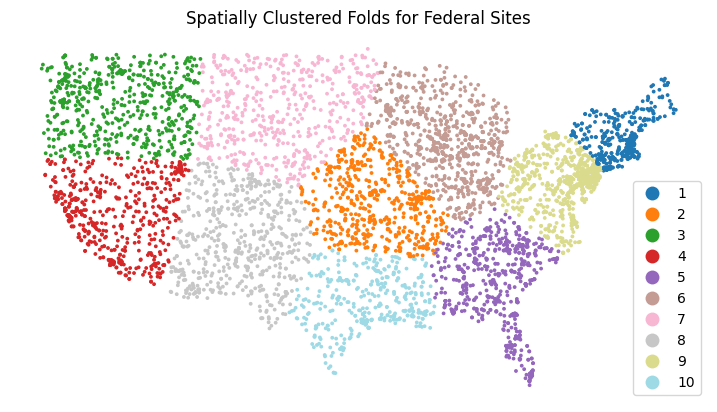

Clustering complete. Found 10 unique folds.


In [111]:
#Spatial Clustering

# 0. Re-initialize gdf_test from the original full_df, ensuring 'indicator' is present
#    and it is a pandas DataFrame, so the subsequent `if` block correctly converts it.
gdf_test = full_df.copy()

# Assuming 'gdf_test' currently exists as a Pandas DataFrame with 'lon'/'lat'
# First, ensure gdf_test is a GeoDataFrame, potentially converting it.
if not isinstance(gdf_test, gpd.GeoDataFrame) or 'geometry' not in gdf_test.columns:
    print("FIXING: Converting gdf_test from DataFrame to GeoDataFrame.")

    # 1. Define bands (assuming they start with 'A')
    bands = [col for col in gdf_test.columns if col.startswith('A')]

    # 2. DROP NaN ROWS HERE
    initial_len = len(gdf_test)
    gdf_test = gdf_test.dropna(subset=bands).reset_index(drop=True)
    dropped = initial_len - len(gdf_test)
    if dropped > 0:
        print(f"Dropped {dropped} rows with NaN satellite features.")

    # 3. Recreate the GeoDataFrame structure
    gdf_test = gpd.GeoDataFrame(
        gdf_test,
        geometry=gpd.points_from_xy(gdf_test['lon'], gdf_test['lat']),
        crs="EPSG:4326"
    )

# 4. Add an 'id' column: This MUST be done after gdf_test is definitively a GeoDataFrame
# and before it's used for clustering, as previous map cells don't add it.
gdf_test['id'] = range(len(gdf_test))

# --- 1. PREPARE GEODATAFRAME for Clustering ---
# The estimate_utm_crs() requires a GeoDataFrame input.
print("Re-projecting data to UTM for accurate clustering...")
federal_prj = gdf_test.copy().to_crs(gdf_test.estimate_utm_crs())

# --- 2. SPATIAL CLUSTER RESAMPLING ---
print(f"Starting spatial clustering into 10 folds ({len(federal_prj)} points)...")

federal_clusters = spatial_kfold_clusters(
  gdf=federal_prj,
  name='id',
  nfolds=10,
  algorithm='kmeans',
  n_init="auto",
  random_state=569
  )

# --- 3. PLOTTING ---
# Get the 'tab20' colormap
cols_tab = cm.get_cmap('tab20', 10)
cols = [cols_tab(i) for i in range(10)]
color_ramp = ListedColormap(cols)

# Create a final GeoDataFrame containing the original CRS and the new fold information
federal_clusters_map = gdf_test.merge(
    federal_clusters[['id', 'folds']],
    left_on='id',
    right_on='id'
)

fig, ax = plt.subplots(1,1 , figsize=(9, 9))
federal_clusters_map.plot(
    column='folds',
    ax=ax,
    cmap=color_ramp,
    markersize=3,
    legend=True,
    categorical=True
)
ax.set_title('Spatially Clustered Folds for Federal Sites')
ax.set_axis_off()

plt.show()

print(f"Clustering complete. Found {federal_clusters['folds'].nunique()} unique folds.")

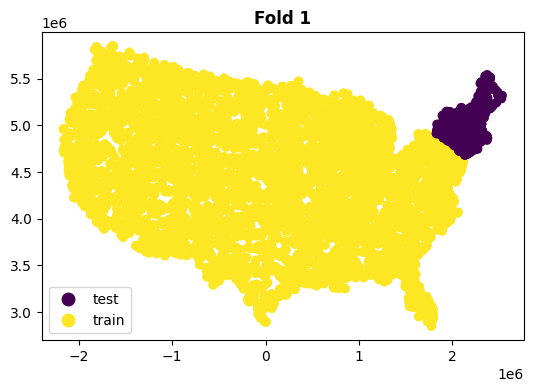

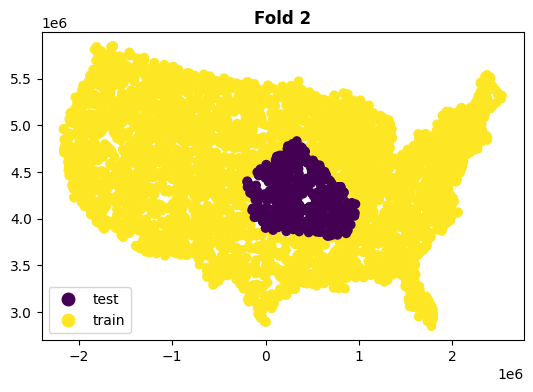

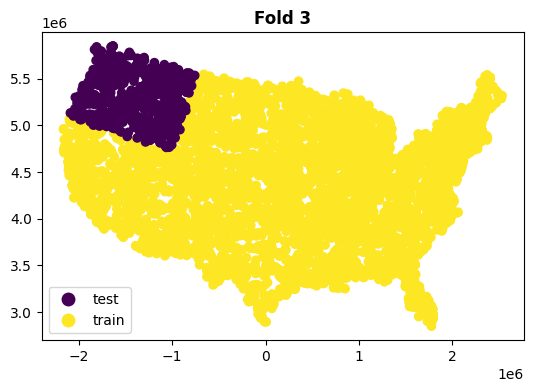

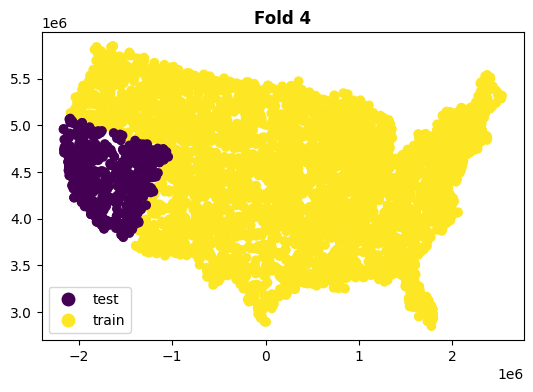

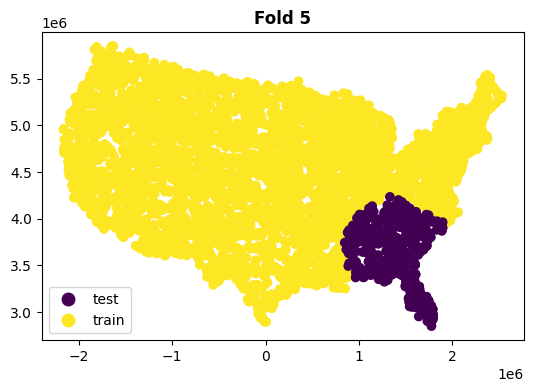

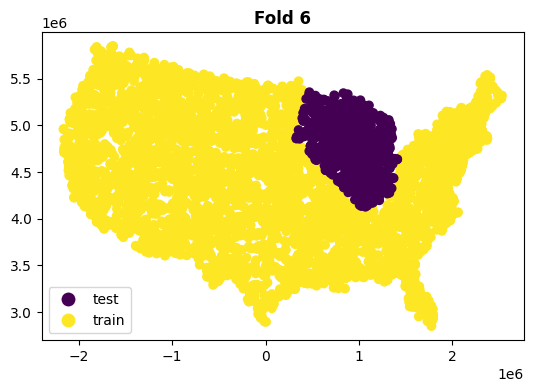

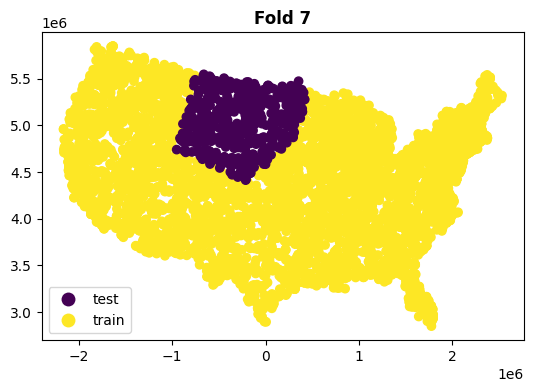

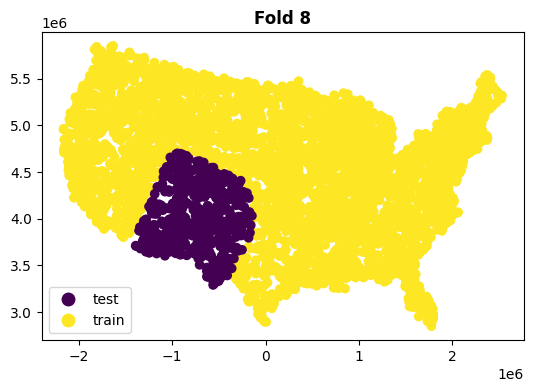

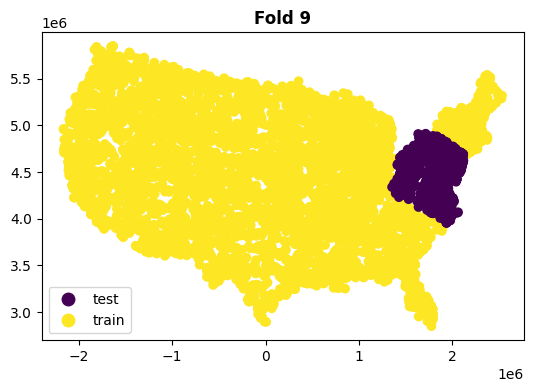

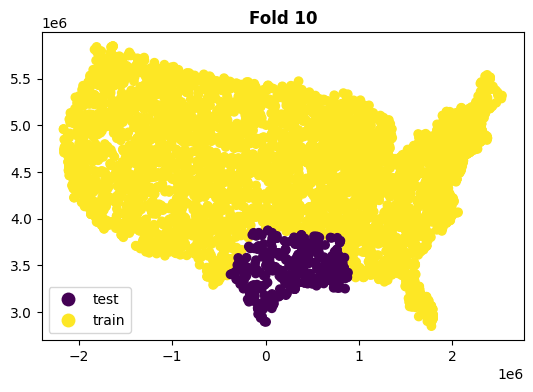

In [112]:
#Split for Spatial Clustering
for i in range(1,11):
    fig, ax = plt.subplots(1, 1 ,figsize=(9, 4))

    spatial_kfold_plot(X=federal_clusters,
                       geometry=federal_clusters.geometry,
                       groups=federal_clusters.folds,
                       fold_num=i, cmap='viridis', ax=ax)

In [113]:
# 1. Define the percentiles exported in the GEE .csv files
percentiles = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# 2. Create the list of feature columns matching the Axx_pxx format
feature_cols = []
for i in range(64):
    # Format band name to A00, A01... A63
    band_name = f"A0{i}" if i < 10 else f"A{i}"

    for p in percentiles:
        # Construct the column name like A00_p30
        col_name = f"{band_name}_p{p}"

        # Only add it if it actually exists in your merged dataframe
        if col_name in federal_prj.columns:
            feature_cols.append(col_name)

# 3. Define your target variable
y = federal_prj['indicator']

# 4. Filter your features to only include those in the list
X = federal_prj[feature_cols]

print(f"Total features identified: {len(feature_cols)}")

Total features identified: 704


In [114]:
#Check:
print(feature_cols)

['A00_p0', 'A00_p10', 'A00_p20', 'A00_p30', 'A00_p40', 'A00_p50', 'A00_p60', 'A00_p70', 'A00_p80', 'A00_p90', 'A00_p100', 'A01_p0', 'A01_p10', 'A01_p20', 'A01_p30', 'A01_p40', 'A01_p50', 'A01_p60', 'A01_p70', 'A01_p80', 'A01_p90', 'A01_p100', 'A02_p0', 'A02_p10', 'A02_p20', 'A02_p30', 'A02_p40', 'A02_p50', 'A02_p60', 'A02_p70', 'A02_p80', 'A02_p90', 'A02_p100', 'A03_p0', 'A03_p10', 'A03_p20', 'A03_p30', 'A03_p40', 'A03_p50', 'A03_p60', 'A03_p70', 'A03_p80', 'A03_p90', 'A03_p100', 'A04_p0', 'A04_p10', 'A04_p20', 'A04_p30', 'A04_p40', 'A04_p50', 'A04_p60', 'A04_p70', 'A04_p80', 'A04_p90', 'A04_p100', 'A05_p0', 'A05_p10', 'A05_p20', 'A05_p30', 'A05_p40', 'A05_p50', 'A05_p60', 'A05_p70', 'A05_p80', 'A05_p90', 'A05_p100', 'A06_p0', 'A06_p10', 'A06_p20', 'A06_p30', 'A06_p40', 'A06_p50', 'A06_p60', 'A06_p70', 'A06_p80', 'A06_p90', 'A06_p100', 'A07_p0', 'A07_p10', 'A07_p20', 'A07_p30', 'A07_p40', 'A07_p50', 'A07_p60', 'A07_p70', 'A07_p80', 'A07_p90', 'A07_p100', 'A08_p0', 'A08_p10', 'A08_p20',

In [115]:
#Check:
print(gdf_test['indicator'].value_counts())

indicator
0    4834
1    1618
Name: count, dtype: int64


In [116]:
# 1. Define your base model
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)

# Wrap it with FixedThresholdClassifier -- changes by what share of random zeros we have
custom_threshold_clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# --- 2. Keep the Cross-Validation Split ---
# kf remains the same (Random KFold)
# Fix: Use StratifiedKFold to ensure each fold has both classes, especially with imbalanced data.
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# --- 3. Change Scoring to Classificationa Metrics ---
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss' # A classification equivalent of mean squared error
]

# --- 4. Evaluate the model and collect the results ---
random_n_scores = cross_validate(
    custom_threshold_clf,
    X,
    y.values.ravel(),
    scoring=classification_scoring,
    cv=kf,
    n_jobs=-1,
    error_score='raise'
)

# Output the results dictionary
print("--- Cross-Validation Results (Classification) ---")
print(random_n_scores)

--- Cross-Validation Results (Classification) ---
{'fit_time': array([0.67518759, 0.63582206, 0.66217446, 0.72740912, 0.86526489,
       0.75089884, 0.71286249, 0.72790527, 0.88001013, 0.91173553]), 'score_time': array([0.037848  , 0.03989506, 0.03875995, 0.03782105, 0.03331137,
       0.0354805 , 0.06043768, 0.03594875, 0.06348968, 0.04441714]), 'test_roc_auc': array([0.81223855, 0.83329507, 0.79963811, 0.82911555, 0.84576847,
       0.81827825, 0.8310968 , 0.82358204, 0.8150193 , 0.80373438]), 'test_accuracy': array([0.78173375, 0.78173375, 0.7627907 , 0.7751938 , 0.78914729,
       0.77364341, 0.76589147, 0.78294574, 0.77364341, 0.7627907 ]), 'test_precision': array([0.57894737, 0.58974359, 0.52985075, 0.58333333, 0.61818182,
       0.55882353, 0.55045872, 0.59166667, 0.56060606, 0.53435115]), 'test_neg_log_loss': array([-0.44109355, -0.42024197, -0.45708433, -0.423658  , -0.4074933 ,
       -0.43619815, -0.41892643, -0.42864631, -0.4406004 , -0.45221931])}


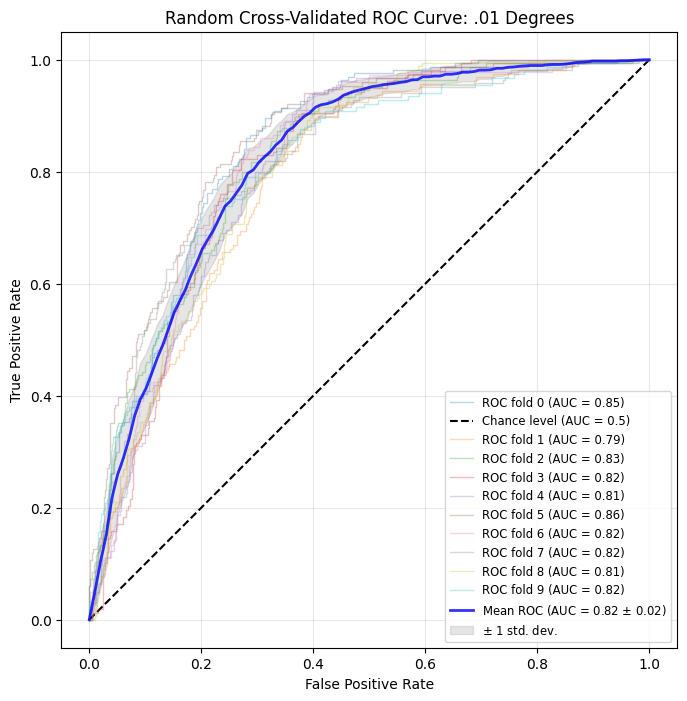

In [117]:
plt.close('all')
# --- 1. Setup ---
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)
clf = FixedThresholdClassifier(base_clf, threshold=0.5)
cv = KFold(n_splits=10, shuffle=True, random_state=123)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# --- 2. The Cross-Validation Loop ---
for fold, (train, test) in enumerate(cv.split(X, y)):
    # Fit on training data
    clf.fit(X.iloc[train], y.iloc[train].values.ravel())

    # Generate the curve for this fold
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test],
        y.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3, # Faded lines for individual folds
        lw=1,
        ax=ax,
        plot_chance_level=(fold == 0) # Only plot the 'Luck' line once
    )

    # Interpolate TPR to a common FPR grid to allow averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 3. Calculate Mean and Std Dev  ---
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

# Plot the strong Mean ROC line
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

# Add the shaded confidence interval (Standard Deviation)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

# --- 4. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Random Cross-Validated ROC Curve: .01 Degrees"
)
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [118]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Random Results: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Random Results: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.8212     0.5696    0.7750    0.4326
Median       0.8209     0.5698    0.7744    0.4324
Std Dev      0.0142     0.0277    0.0091    0.0156
Min (Worst)  0.7996     0.5299    0.7628    0.4075
Max (Best)   0.8458     0.6182    0.7891    0.4571
Q1 (25%)     0.8129     0.5525    0.7678    0.4211
Q3 (75%)     0.8306     0.5881    0.7817    0.4410


In [119]:
# --- RE-ESTABLISHING federal_prj_filtered ---

# 1. Merge the cluster/fold info into your main data
federal_prj = gdf_test.merge(federal_clusters[['id', 'folds']], on='id')

# 2. Identify and Drop empty folds (Option 1)
fold_summary = federal_prj.groupby('folds')['indicator'].sum()
empty_folds = fold_summary[fold_summary == 0].index.tolist()

print(f"Empty folds found: {empty_folds}")

# 3. Create the variable the model is looking for
federal_prj_filtered = federal_prj[~federal_prj['folds'].isin(empty_folds)].copy()

print(f"Variable 'federal_prj_filtered' is now defined with {len(federal_prj_filtered)} rows.")

Empty folds found: []
Variable 'federal_prj_filtered' is now defined with 6452 rows.


In [120]:
X = federal_prj_filtered[feature_cols]
y = federal_prj_filtered['indicator']
groups = federal_prj_filtered['folds']

logo = LeaveOneGroupOut()
clf = LogisticRegression(max_iter=5000, C=1.0, random_state=123)

# Lists to store metrics for each fold
aucs, accs, precs, log_losses = [], [], [], []
skipped_folds = []

print(f"Starting Spatial CV on {len(X)} samples...\n")

for train_idx, test_idx in logo.split(X, y, groups=groups):
    current_fold = groups.iloc[test_idx].unique()[0]
    y_test = y.iloc[test_idx]

    # 1. Skip check for single-label test sets
    if len(np.unique(y_test)) < 2:
        print(f"Fold {current_fold}: SKIPPED (No variance in test labels)")
        skipped_folds.append(current_fold)
        continue

    # 2. Train
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # 3. Predict (Probabilities for AUC/Log-Loss, Classes for Acc/Precision)
    y_probs = clf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = clf.predict(X.iloc[test_idx])

    # 4. Calculate and store metrics
    aucs.append(roc_auc_score(y_test, y_probs))
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=0))
    # neg_log_loss is -1 * log_loss
    log_losses.append(-log_loss(y_test, clf.predict_proba(X.iloc[test_idx])))

    print(f"Fold {current_fold}: PROCESSED (AUC: {aucs[-1]:.4f})")

# --- Final Summary Table ---
print(f"\n--- Final Results (Averages across {len(aucs)} folds) ---")
print(f"ROC-AUC:       {np.mean(aucs):.4f}")
print(f"Accuracy:      {np.mean(accs):.4f}")
print(f"Precision:     {np.mean(precs):.4f}")
print(f"Neg. Log Loss: {np.mean(log_losses):.4f}")

if skipped_folds:
    print(f"\nNote: Folds {skipped_folds} were excluded from these averages.")

Starting Spatial CV on 6452 samples...

Fold 1: PROCESSED (AUC: 0.7426)
Fold 2: PROCESSED (AUC: 0.7925)
Fold 3: PROCESSED (AUC: 0.8468)
Fold 4: PROCESSED (AUC: 0.8618)
Fold 5: PROCESSED (AUC: 0.7645)
Fold 6: PROCESSED (AUC: 0.7893)
Fold 7: PROCESSED (AUC: 0.9175)
Fold 8: PROCESSED (AUC: 0.8483)
Fold 9: PROCESSED (AUC: 0.7023)
Fold 10: PROCESSED (AUC: 0.8191)

--- Final Results (Averages across 10 folds) ---
ROC-AUC:       0.8085
Accuracy:      0.7917
Precision:     0.5621
Neg. Log Loss: -0.4174


Starting Spatial CV on 6452 samples with 10 clusters...



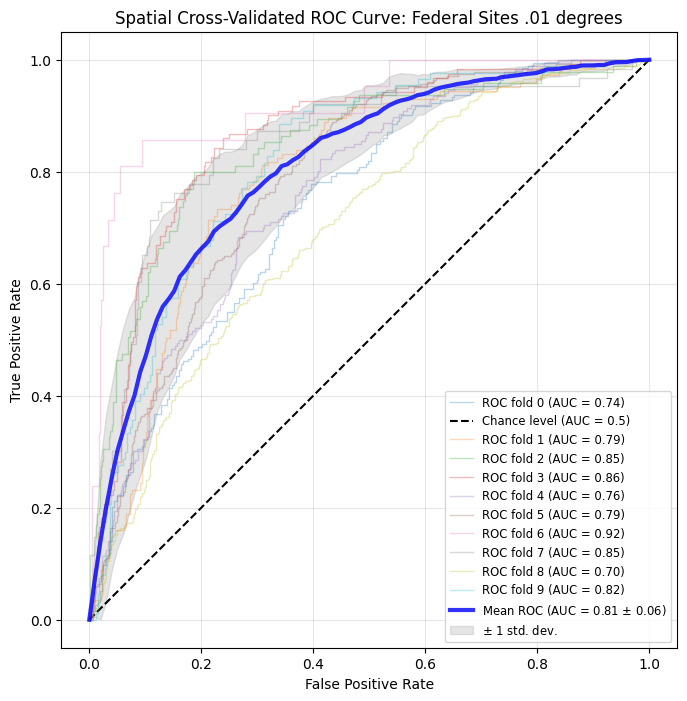

In [121]:
plt.close('all')

# --- 1. SETUP ---
logo = LeaveOneGroupOut()
tprs = [] # True Positive Rates
aucs = [] # Area Under the Curves
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# Use the features (X), labels (y), and spatial groups defined earlier
print(f"Starting Spatial CV on {len(X)} samples with {len(groups.unique())} clusters...\n")

# --- 2. The Spatial LOGO Loop ---
for fold, (train_idx, test_idx) in enumerate(logo.split(X, y, groups=groups)):
    y_test = y.iloc[test_idx]
    if len(np.unique(y_test)) < 2:
        continue

    # Train on everything EXCEPT the current cluster
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # Plot individual fold curve (thin, pastel colors)
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test_idx],
        y.iloc[test_idx],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        # Plot the dotted chance level line ONLY for the first valid fold
        plot_chance_level=(len(tprs) == 0)
    )

    # 3. INTERPOLATION for averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0 # Force curve to start at 0,0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 4. CACLULATE SPATIAL MEAN & VARIANCE ---
if tprs:
    # Calculate the mean of the True Positive Rates across all spatial folds
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    # Calculate Area under the MEAN curve (a slightly more robust statistic)
    mean_auc = auc(mean_fpr, mean_tpr)
    # Calculate Standard Deviation of the AUC values
    std_auc = np.std(aucs)

    # Plot the thick blue Mean ROC line
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="blue",
        # Text from the example: AUC = Mean ± StdDev
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=3, # Thick line
        alpha=0.8,
    )

    # Calculate and Plot the Shaded Variance Region (Standard Deviation)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1) # Keep upper boundary <= 1
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0) # Keep lower boundary >= 0

    # Fill the region
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

# --- 5. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Spatial Cross-Validated ROC Curve: Federal Sites .01 degrees"
)

# Use small legend and multiple columns to fit all the folds, matching the look
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [122]:
# Assuming 'federal_prj_filtered' and 'federal_clusters' are available from previous cells.
# 'X' and 'y' are derived from 'federal_prj_filtered'.

# --- 0. Pre-filter data for cross_validate to avoid single-class test folds ---
# Identify groups that contain only one unique label (0 or 1)
# This is crucial for metrics like log_loss and roc_auc, which require at least two classes.
# We use federal_prj_filtered because X and y are based on it.
unique_labels_per_fold = federal_prj_filtered.groupby('folds')['indicator'].nunique()
problematic_folds_ids = unique_labels_per_fold[unique_labels_per_fold == 1].index.tolist()

# Filter X, y, and the groups array if problematic folds are found
if problematic_folds_ids:
    print(f"Warning: The following folds contain only one class and will be excluded from `cross_validate`: {problematic_folds_ids}")
    # Create a boolean mask for the rows to keep
    mask = ~federal_prj_filtered['folds'].isin(problematic_folds_ids)

    X_filtered = X[mask]
    y_filtered = y[mask]
    # Re-create spatial_folds_filtered to ensure it matches the filtered X and y
    spatial_folds_filtered = federal_prj_filtered[mask]['folds'].values.ravel()
else:
    X_filtered = X
    y_filtered = y
    spatial_folds_filtered = federal_prj_filtered['folds'].values.ravel() # Ensure this is always from federal_prj_filtered


# --- 1. Define the Estimator and Cross-Validator ---

# FIX: Use a fresh LogisticRegression estimator.
# We add stability settings (max_iter) and set regularization (C) to default.
clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# Initiate the Leave One Group Out cross-validator
group_cvs = LeaveOneGroupOut()

# --- 2. Evaluate the model and collect the results ---

# Use Classification Scoring
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss'
]

print("Starting Leave One Group Out (Spatial) Cross-Validation...")
# We pass the groups array directly to the 'groups' parameter of cross_validate.
spatial_cluster_scores = cross_validate(
    clf, # Uses the new LogisticRegression estimator
    X_filtered, # Use filtered X
    y_filtered.values.ravel(), # Use filtered y
    scoring=classification_scoring,
    cv=group_cvs,  # Pass the LOGO object
    groups=spatial_folds_filtered, # Pass the filtered spatial group IDs
    n_jobs=-1,
    error_score='raise'
)

print("\n--- Spatial Cross-Validation Complete ---")
print(f"Number of folds run: {len(spatial_cluster_scores['test_roc_auc'])}")
print("Results Summary:")
print(spatial_cluster_scores)

Starting Leave One Group Out (Spatial) Cross-Validation...

--- Spatial Cross-Validation Complete ---
Number of folds run: 10
Results Summary:
{'fit_time': array([0.74970436, 0.7354095 , 0.53652716, 0.78619528, 0.57411647,
       0.52254629, 0.65015936, 0.68385983, 0.53639936, 0.49891973]), 'score_time': array([0.03371644, 0.03353953, 0.0364089 , 0.03566742, 0.03864408,
       0.04217792, 0.03505254, 0.03725934, 0.03882456, 0.01879573]), 'test_roc_auc': array([0.74259458, 0.79251201, 0.84681067, 0.86178847, 0.76450938,
       0.78926318, 0.91754018, 0.84826263, 0.70233762, 0.81912226]), 'test_accuracy': array([0.67710372, 0.75675676, 0.85830619, 0.83392226, 0.75      ,
       0.73194748, 0.95381526, 0.890625  , 0.66321731, 0.80095923]), 'test_precision': array([0.57608696, 0.43902439, 0.78571429, 0.63636364, 0.57352941,
       0.56055363, 0.41666667, 0.5       , 0.59173127, 0.54166667]), 'test_neg_log_loss': array([-0.57647301, -0.45064153, -0.33040481, -0.36098972, -0.50541924,
      

In [123]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.8085     0.5621    0.7917    0.4174
Median       0.8058     0.5670    0.7789    0.4277
Std Dev      0.0633     0.1040    0.0934    0.1435
Min (Worst)  0.7023     0.4167    0.6632    0.1412
Max (Best)   0.9175     0.7857    0.9538    0.6178
Q1 (25%)     0.7707     0.5104    0.7365    0.3381
Q3 (75%)     0.8479     0.5878    0.8522    0.5039


In [124]:
# The global list 'all_results_data' and 'add_result_row' function are defined in a previous cell.

# --- Calculate summary statistics for Random CV (200% case) ---
df_random_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Random CV'
})
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
random_summary_200 = df_random_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
random_summary_200.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# spatial_summary is already available from previous cell
# Re-create it here for clarity and to ensure it uses the correct data
df_spatial_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})
spatial_summary_200 = df_spatial_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
spatial_summary_200.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# --- POPULATING WITH YOUR PROVIDED NUMBERS (200% data) --- (using global add_result_row)
# Percentage refers to number of 0s compared to 1s

# 200% - Auto-populated with current run results
add_result_row(200, 'Random', 'auc', random_summary_200.loc['Mean', 'auc'], random_summary_200.loc['Median', 'auc'], random_summary_200.loc['Std Dev', 'auc'], random_summary_200.loc['Min (Worst)', 'auc'], random_summary_200.loc['Max (Best)', 'auc'], random_summary_200.loc['Q1 (25%)', 'auc'], random_summary_200.loc['Q3 (75%)', 'auc'])
add_result_row(200, 'Random', 'precision', random_summary_200.loc['Mean', 'precision'], random_summary_200.loc['Median', 'precision'], random_summary_200.loc['Std Dev', 'precision'], random_summary_200.loc['Min (Worst)', 'precision'], random_summary_200.loc['Max (Best)', 'precision'], random_summary_200.loc['Q1 (25%)', 'precision'], random_summary_200.loc['Q3 (75%)', 'precision'])
add_result_row(200, 'Random', 'accuracy', random_summary_200.loc['Mean', 'accuracy'], random_summary_200.loc['Median', 'accuracy'], random_summary_200.loc['Std Dev', 'accuracy'], random_summary_200.loc['Min (Worst)', 'accuracy'], random_summary_200.loc['Max (Best)', 'accuracy'], random_summary_200.loc['Q1 (25%)', 'accuracy'], random_summary_200.loc['Q3 (75%)', 'accuracy'])
add_result_row(200, 'Random', 'log_loss', random_summary_200.loc['Mean', 'log_loss'], random_summary_200.loc['Median', 'log_loss'], random_summary_200.loc['Std Dev', 'log_loss'], random_summary_200.loc['Min (Worst)', 'log_loss'], random_summary_200.loc['Max (Best)', 'log_loss'], random_summary_200.loc['Q1 (25%)', 'log_loss'], random_summary_200.loc['Q3 (75%)', 'log_loss'])
add_result_row(200, 'K fold', 'auc', spatial_summary_200.loc['Mean', 'auc'], spatial_summary_200.loc['Median', 'auc'], spatial_summary_200.loc['Std Dev', 'auc'], spatial_summary_200.loc['Min (Worst)', 'auc'], spatial_summary_200.loc['Max (Best)', 'auc'], spatial_summary_200.loc['Q1 (25%)', 'auc'], spatial_summary_200.loc['Q3 (75%)', 'auc'])
add_result_row(200, 'K fold', 'precision', spatial_summary_200.loc['Mean', 'precision'], spatial_summary_200.loc['Median', 'precision'], spatial_summary_200.loc['Std Dev', 'precision'], spatial_summary_200.loc['Min (Worst)', 'precision'], spatial_summary_200.loc['Max (Best)', 'precision'], spatial_summary_200.loc['Q1 (25%)', 'precision'], spatial_summary_200.loc['Q3 (75%)', 'precision'])
add_result_row(200, 'K fold', 'accuracy', spatial_summary_200.loc['Mean', 'accuracy'], spatial_summary_200.loc['Median', 'accuracy'], spatial_summary_200.loc['Std Dev', 'accuracy'], spatial_summary_200.loc['Min (Worst)', 'accuracy'], spatial_summary_200.loc['Max (Best)', 'accuracy'], spatial_summary_200.loc['Q1 (25%)', 'accuracy'], spatial_summary_200.loc['Q3 (75%)', 'accuracy'])
add_result_row(200, 'K fold', 'log_loss', spatial_summary_200.loc['Mean', 'log_loss'], spatial_summary_200.loc['Median', 'log_loss'], spatial_summary_200.loc['Std Dev', 'log_loss'], spatial_summary_200.loc['Min (Worst)', 'log_loss'], spatial_summary_200.loc['Max (Best)', 'log_loss'], spatial_summary_200.loc['Q1 (25%)', 'log_loss'], spatial_summary_200.loc['Q3 (75%)', 'log_loss'])

df_long = pd.DataFrame(all_results_data)

# Display the head and tail of the DataFrame to verify its content
display(df_long.head())
display(df_long.tail())

,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
0,0,Random,auc,0.599283,0.606855,0.033723,0.539208,0.648758,0.577315,0.620303
1,0,Random,precision,0.580127,0.580684,0.021568,0.549133,0.605263,0.560630,0.600631
2,0,Random,accuracy,0.578659,0.578535,0.019899,0.551402,0.608696,0.560559,0.595497
3,0,Random,log_loss,0.686363,0.679231,0.019394,0.657093,0.715019,0.676339,0.704478
4,0,K fold,auc,0.610727,0.605958,0.042650,0.556612,0.686356,0.585170,0.635894


,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
59,200,Random,log_loss,0.432616,0.432422,0.015632,0.407493,0.457084,0.421096,0.440970
60,200,K fold,auc,0.808474,0.805817,0.063303,0.702338,0.917540,0.770698,0.847900
61,200,K fold,precision,0.562134,0.567042,0.103975,0.416667,0.785714,0.510417,0.587820
62,200,K fold,accuracy,0.791665,0.778858,0.093418,0.663217,0.953815,0.736461,0.852210
63,200,K fold,log_loss,0.417400,0.427666,0.143461,0.141208,0.617808,0.338051,0.503902


#For 400% 0s

In [125]:
#For 400%
#------USER INPUT--------#
#input the folder path where your GEE .csv files are stored
folder_path = '/content/drive/MyDrive/Research/Young/MOSAIKS/superfund_project_summer2026/Data/Intermediate/Spatial K Folds/Federal/400/'
file_pattern = os.path.join(folder_path, 'GEE_featurization_federal_*.csv') #name pattern of files from GEE
file_list = glob.glob(file_pattern)

print(f"Found {len(file_list)} files to combine.")

# 3. Read each file into a list of DataFrames
df_list = [pd.read_csv(f) for f in file_list]

# 4. Concatenate (stack) them into one master DataFrame
full_df = pd.concat(df_list, ignore_index=True)

# 5. Check the final count to make sure it matches your # of points
print(f"Final combined row count: {len(full_df)}")
full_df.head()

gdf_test=full_df

today_date = datetime.date.today().strftime("%Y-%m-%d")
output_folder = '/content/drive/MyDrive/MOSAIKS/superfund_project_summer2026/Results/Figures/Testing Phase' #output folder path

Found 20 files to combine.
Final combined row count: 9688


FIXING: Converting gdf_test from DataFrame to GeoDataFrame.
Re-projecting data to UTM for accurate clustering...
Starting spatial clustering into 10 folds (9688 points)...


/tmp/ipykernel_2629/2168819861.py:52: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cols_tab = cm.get_cmap('tab20', 10)


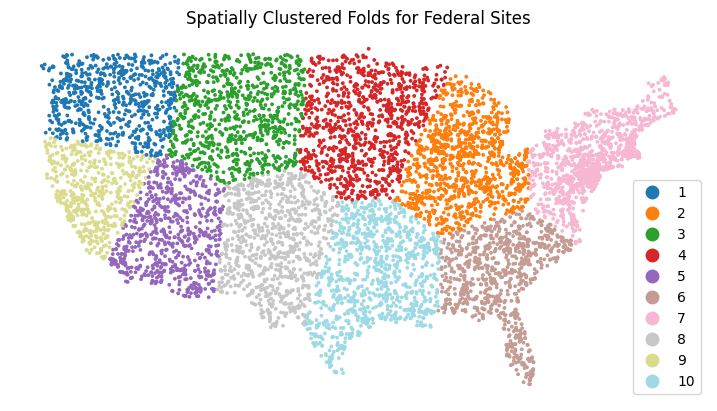

Clustering complete. Found 10 unique folds.


In [126]:
#Spatial Clustering

# 0. Re-initialize gdf_test from the original full_df, ensuring 'indicator' is present
#    and it is a pandas DataFrame, so the subsequent `if` block correctly converts it.
gdf_test = full_df.copy()

# Assuming 'gdf_test' currently exists as a Pandas DataFrame with 'lon'/'lat'
# First, ensure gdf_test is a GeoDataFrame, potentially converting it.
if not isinstance(gdf_test, gpd.GeoDataFrame) or 'geometry' not in gdf_test.columns:
    print("FIXING: Converting gdf_test from DataFrame to GeoDataFrame.")

    # 1. Define bands (assuming they start with 'A')
    bands = [col for col in gdf_test.columns if col.startswith('A')]

    # 2. DROP NaN ROWS HERE
    initial_len = len(gdf_test)
    gdf_test = gdf_test.dropna(subset=bands).reset_index(drop=True)
    dropped = initial_len - len(gdf_test)
    if dropped > 0:
        print(f"Dropped {dropped} rows with NaN satellite features.")

    # 3. Recreate the GeoDataFrame structure
    gdf_test = gpd.GeoDataFrame(
        gdf_test,
        geometry=gpd.points_from_xy(gdf_test['lon'], gdf_test['lat']),
        crs="EPSG:4326"
    )

# 4. Add an 'id' column: This MUST be done after gdf_test is definitively a GeoDataFrame
# and before it's used for clustering, as previous map cells don't add it.
gdf_test['id'] = range(len(gdf_test))

# --- 1. PREPARE GEODATAFRAME for Clustering ---
# The estimate_utm_crs() requires a GeoDataFrame input.
print("Re-projecting data to UTM for accurate clustering...")
federal_prj = gdf_test.copy().to_crs(gdf_test.estimate_utm_crs())

# --- 2. SPATIAL CLUSTER RESAMPLING ---
print(f"Starting spatial clustering into 10 folds ({len(federal_prj)} points)...")

federal_clusters = spatial_kfold_clusters(
  gdf=federal_prj,
  name='id',
  nfolds=10,
  algorithm='kmeans',
  n_init="auto",
  random_state=569
  )

# --- 3. PLOTTING ---
# Get the 'tab20' colormap
cols_tab = cm.get_cmap('tab20', 10)
cols = [cols_tab(i) for i in range(10)]
color_ramp = ListedColormap(cols)

# Create a final GeoDataFrame containing the original CRS and the new fold information
federal_clusters_map = gdf_test.merge(
    federal_clusters[['id', 'folds']],
    left_on='id',
    right_on='id'
)

fig, ax = plt.subplots(1,1 , figsize=(9, 9))
federal_clusters_map.plot(
    column='folds',
    ax=ax,
    cmap=color_ramp,
    markersize=3,
    legend=True,
    categorical=True
)
ax.set_title('Spatially Clustered Folds for Federal Sites')
ax.set_axis_off()

plt.show()

print(f"Clustering complete. Found {federal_clusters['folds'].nunique()} unique folds.")

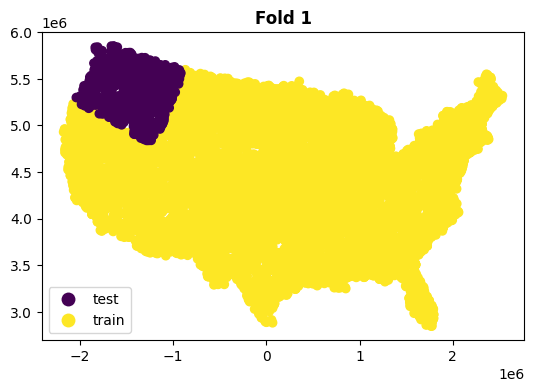

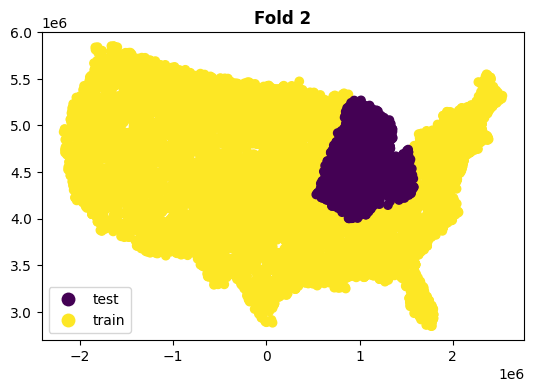

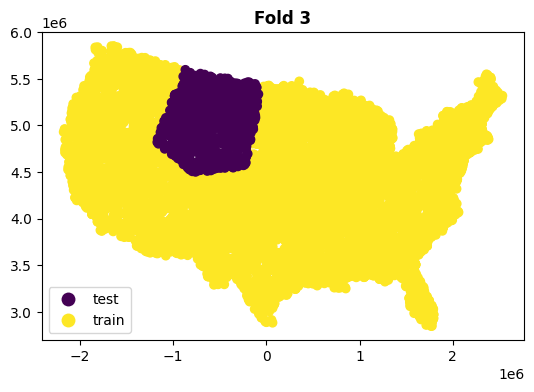

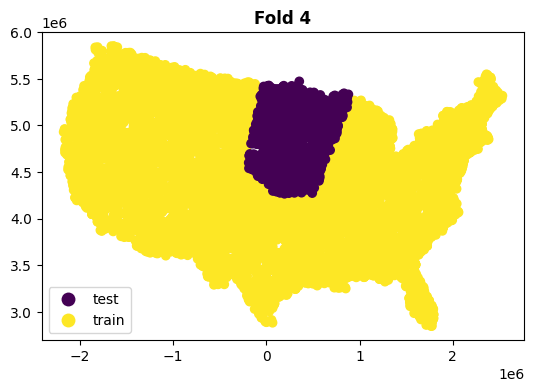

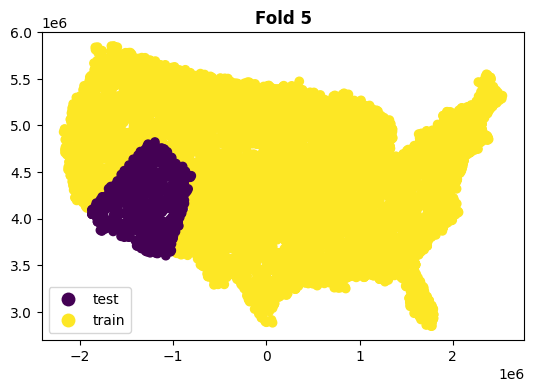

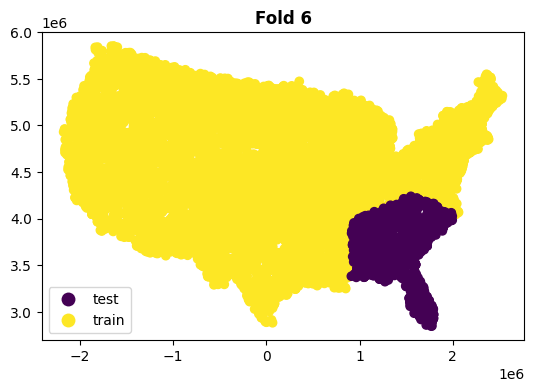

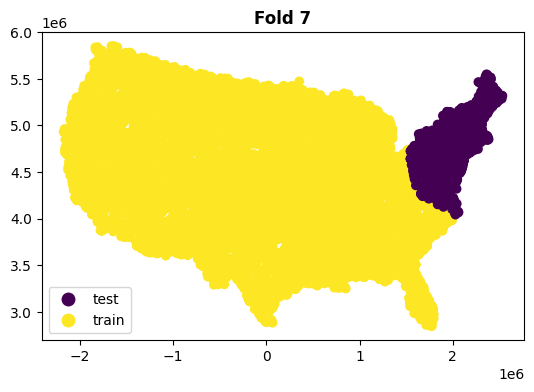

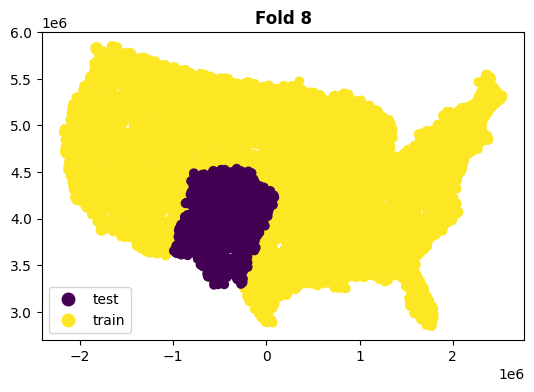

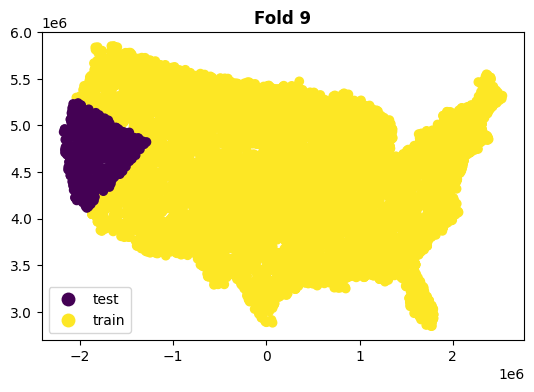

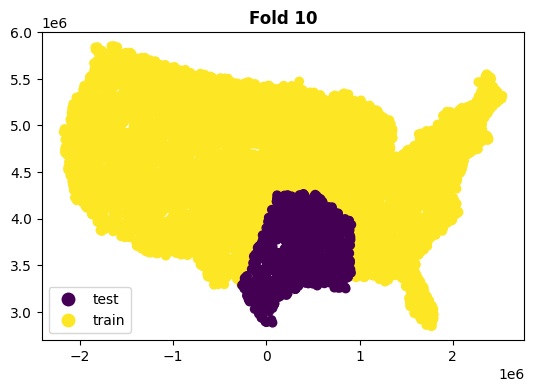

In [127]:
#Split for Spatial Clustering
for i in range(1,11):
    fig, ax = plt.subplots(1, 1 ,figsize=(9, 4))

    spatial_kfold_plot(X=federal_clusters,
                       geometry=federal_clusters.geometry,
                       groups=federal_clusters.folds,
                       fold_num=i, cmap='viridis', ax=ax)

In [128]:
# 1. Define the percentiles exported in the GEE .csv files
percentiles = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]

# 2. Create the list of feature columns matching the Axx_pxx format
feature_cols = []
for i in range(64):
    # Format band name to A00, A01... A63
    band_name = f"A0{i}" if i < 10 else f"A{i}"

    for p in percentiles:
        # Construct the column name like A00_p30
        col_name = f"{band_name}_p{p}"

        # Only add it if it actually exists in your merged dataframe
        if col_name in federal_prj.columns:
            feature_cols.append(col_name)

# 3. Define your target variable
y = federal_prj['indicator']

# 4. Filter your features to only include those in the list
X = federal_prj[feature_cols]

print(f"Total features identified: {len(feature_cols)}")

Total features identified: 704


In [129]:
#Check:
print(feature_cols)

['A00_p0', 'A00_p10', 'A00_p20', 'A00_p30', 'A00_p40', 'A00_p50', 'A00_p60', 'A00_p70', 'A00_p80', 'A00_p90', 'A00_p100', 'A01_p0', 'A01_p10', 'A01_p20', 'A01_p30', 'A01_p40', 'A01_p50', 'A01_p60', 'A01_p70', 'A01_p80', 'A01_p90', 'A01_p100', 'A02_p0', 'A02_p10', 'A02_p20', 'A02_p30', 'A02_p40', 'A02_p50', 'A02_p60', 'A02_p70', 'A02_p80', 'A02_p90', 'A02_p100', 'A03_p0', 'A03_p10', 'A03_p20', 'A03_p30', 'A03_p40', 'A03_p50', 'A03_p60', 'A03_p70', 'A03_p80', 'A03_p90', 'A03_p100', 'A04_p0', 'A04_p10', 'A04_p20', 'A04_p30', 'A04_p40', 'A04_p50', 'A04_p60', 'A04_p70', 'A04_p80', 'A04_p90', 'A04_p100', 'A05_p0', 'A05_p10', 'A05_p20', 'A05_p30', 'A05_p40', 'A05_p50', 'A05_p60', 'A05_p70', 'A05_p80', 'A05_p90', 'A05_p100', 'A06_p0', 'A06_p10', 'A06_p20', 'A06_p30', 'A06_p40', 'A06_p50', 'A06_p60', 'A06_p70', 'A06_p80', 'A06_p90', 'A06_p100', 'A07_p0', 'A07_p10', 'A07_p20', 'A07_p30', 'A07_p40', 'A07_p50', 'A07_p60', 'A07_p70', 'A07_p80', 'A07_p90', 'A07_p100', 'A08_p0', 'A08_p10', 'A08_p20',

In [130]:
#Check:
print(gdf_test['indicator'].value_counts())

indicator
0    8070
1    1618
Name: count, dtype: int64


In [131]:
# 1. Define your base model
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)

# Wrap it with FixedThresholdClassifier -- changes by what share of random zeros we have
custom_threshold_clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# --- 2. Keep the Cross-Validation Split ---
# kf remains the same (Random KFold)
# Fix: Use StratifiedKFold to ensure each fold has both classes, especially with imbalanced data.
from sklearn.model_selection import StratifiedKFold
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=123)

# --- 3. Change Scoring to Classificationa Metrics ---
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss' # A classification equivalent of mean squared error
]

# --- 4. Evaluate the model and collect the results ---
random_n_scores = cross_validate(
    custom_threshold_clf,
    X,
    y.values.ravel(),
    scoring=classification_scoring,
    cv=kf,
    n_jobs=-1,
    error_score='raise'
)

# Output the results dictionary
print("--- Cross-Validation Results (Classification) ---")
print(random_n_scores)

--- Cross-Validation Results (Classification) ---
{'fit_time': array([0.89703631, 0.99821281, 0.94845343, 1.03175473, 0.92648435,
       1.07129884, 1.01430416, 1.06375813, 0.92832494, 0.87909865]), 'score_time': array([0.04061317, 0.03599811, 0.0418849 , 0.041991  , 0.05401373,
       0.03995895, 0.04634666, 0.04139233, 0.04203248, 0.02445793]), 'test_roc_auc': array([0.88849878, 0.87256567, 0.87594658, 0.84502884, 0.84670399,
       0.87251212, 0.87525051, 0.85851424, 0.87690011, 0.85294819]), 'test_accuracy': array([0.85139319, 0.84932921, 0.85139319, 0.84726522, 0.8245614 ,
       0.84932921, 0.84520124, 0.84829721, 0.85743802, 0.84710744]), 'test_precision': array([0.59      , 0.57843137, 0.58035714, 0.55645161, 0.46428571,
       0.57692308, 0.55660377, 0.56521739, 0.59663866, 0.56074766]), 'test_neg_log_loss': array([-0.29817043, -0.31283753, -0.30972938, -0.33994905, -0.33965473,
       -0.31459402, -0.30843321, -0.32407487, -0.30625335, -0.33154456])}


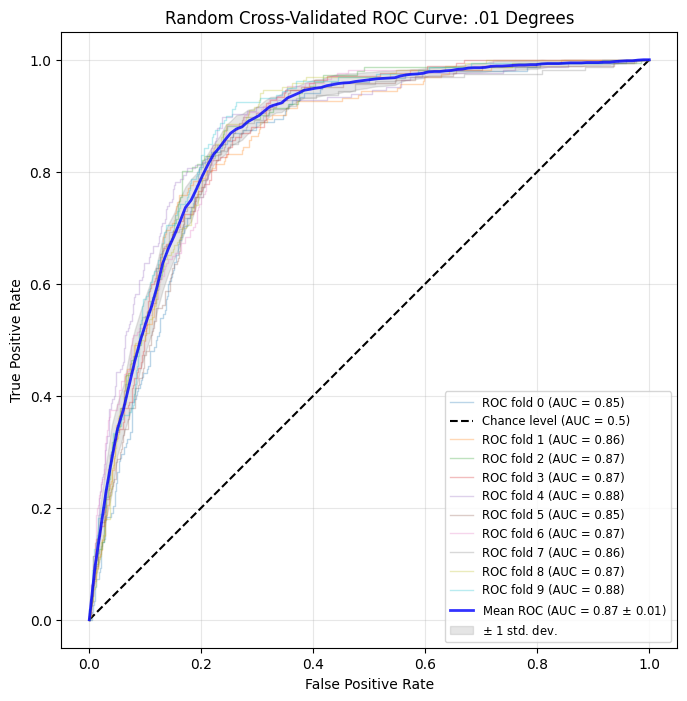

In [132]:
plt.close('all')
# --- 1. Setup ---
base_clf = LogisticRegression(max_iter=1000, C=1.0, random_state=123)
clf = FixedThresholdClassifier(base_clf, threshold=0.5)
cv = KFold(n_splits=10, shuffle=True, random_state=123)

tprs = []
aucs = []
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# --- 2. The Cross-Validation Loop ---
for fold, (train, test) in enumerate(cv.split(X, y)):
    # Fit on training data
    clf.fit(X.iloc[train], y.iloc[train].values.ravel())

    # Generate the curve for this fold
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test],
        y.iloc[test],
        name=f"ROC fold {fold}",
        alpha=0.3, # Faded lines for individual folds
        lw=1,
        ax=ax,
        plot_chance_level=(fold == 0) # Only plot the 'Luck' line once
    )

    # Interpolate TPR to a common FPR grid to allow averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 3. Calculate Mean and Std Dev  ---
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
std_auc = np.std(aucs)

# Plot the strong Mean ROC line
ax.plot(
    mean_fpr,
    mean_tpr,
    color="b",
    label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
    lw=2,
    alpha=0.8,
)

# Add the shaded confidence interval (Standard Deviation)
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
ax.fill_between(
    mean_fpr,
    tprs_lower,
    tprs_upper,
    color="grey",
    alpha=0.2,
    label=r"$\pm$ 1 std. dev.",
)

# --- 4. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Random Cross-Validated ROC Curve: .01 Degrees"
)
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [133]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Random Results: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Random Results: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.8665     0.5626    0.8471    0.3185
Median       0.8725     0.5711    0.8488    0.3137
Std Dev      0.0146     0.0372    0.0086    0.0145
Min (Worst)  0.8450     0.4643    0.8246    0.2982
Max (Best)   0.8885     0.5966    0.8574    0.3399
Q1 (25%)     0.8543     0.5576    0.8471    0.3088
Q3 (75%)     0.8758     0.5799    0.8509    0.3297


In [134]:
# --- RE-ESTABLISHING federal_prj_filtered ---

# 1. Merge the cluster/fold info into your main data
federal_prj = gdf_test.merge(federal_clusters[['id', 'folds']], on='id')

# 2. Identify and Drop empty folds (Option 1)
fold_summary = federal_prj.groupby('folds')['indicator'].sum()
empty_folds = fold_summary[fold_summary == 0].index.tolist()

print(f"Empty folds found: {empty_folds}")

# 3. Create the variable the model is looking for
federal_prj_filtered = federal_prj[~federal_prj['folds'].isin(empty_folds)].copy()

print(f"Variable 'federal_prj_filtered' is now defined with {len(federal_prj_filtered)} rows.")

Empty folds found: []
Variable 'federal_prj_filtered' is now defined with 9688 rows.


In [135]:
X = federal_prj_filtered[feature_cols]
y = federal_prj_filtered['indicator']
groups = federal_prj_filtered['folds']

logo = LeaveOneGroupOut()
clf = LogisticRegression(max_iter=5000, C=1.0, random_state=123)

# Lists to store metrics for each fold
aucs, accs, precs, log_losses = [], [], [], []
skipped_folds = []

print(f"Starting Spatial CV on {len(X)} samples...\n")

for train_idx, test_idx in logo.split(X, y, groups=groups):
    current_fold = groups.iloc[test_idx].unique()[0]
    y_test = y.iloc[test_idx]

    # 1. Skip check for single-label test sets
    if len(np.unique(y_test)) < 2:
        print(f"Fold {current_fold}: SKIPPED (No variance in test labels)")
        skipped_folds.append(current_fold)
        continue

    # 2. Train
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # 3. Predict (Probabilities for AUC/Log-Loss, Classes for Acc/Precision)
    y_probs = clf.predict_proba(X.iloc[test_idx])[:, 1]
    y_pred = clf.predict(X.iloc[test_idx])

    # 4. Calculate and store metrics
    aucs.append(roc_auc_score(y_test, y_probs))
    accs.append(accuracy_score(y_test, y_pred))
    precs.append(precision_score(y_test, y_pred, zero_division=0))
    # neg_log_loss is -1 * log_loss
    log_losses.append(-log_loss(y_test, clf.predict_proba(X.iloc[test_idx])))

    print(f"Fold {current_fold}: PROCESSED (AUC: {aucs[-1]:.4f})")

# --- Final Summary Table ---
print(f"\n--- Final Results (Averages across {len(aucs)} folds) ---")
print(f"ROC-AUC:       {np.mean(aucs):.4f}")
print(f"Accuracy:      {np.mean(accs):.4f}")
print(f"Precision:     {np.mean(precs):.4f}")
print(f"Neg. Log Loss: {np.mean(log_losses):.4f}")

if skipped_folds:
    print(f"\nNote: Folds {skipped_folds} were excluded from these averages.")

Starting Spatial CV on 9688 samples...

Fold 1: PROCESSED (AUC: 0.8953)
Fold 2: PROCESSED (AUC: 0.8092)
Fold 3: PROCESSED (AUC: 0.7961)
Fold 4: PROCESSED (AUC: 0.8881)
Fold 5: PROCESSED (AUC: 0.8956)
Fold 6: PROCESSED (AUC: 0.7976)
Fold 7: PROCESSED (AUC: 0.7435)
Fold 8: PROCESSED (AUC: 0.8138)
Fold 9: PROCESSED (AUC: 0.8528)
Fold 10: PROCESSED (AUC: 0.8488)

--- Final Results (Averages across 10 folds) ---
ROC-AUC:       0.8341
Accuracy:      0.8649
Precision:     0.5631
Neg. Log Loss: -0.2935


Starting Spatial CV on 9688 samples with 10 clusters...



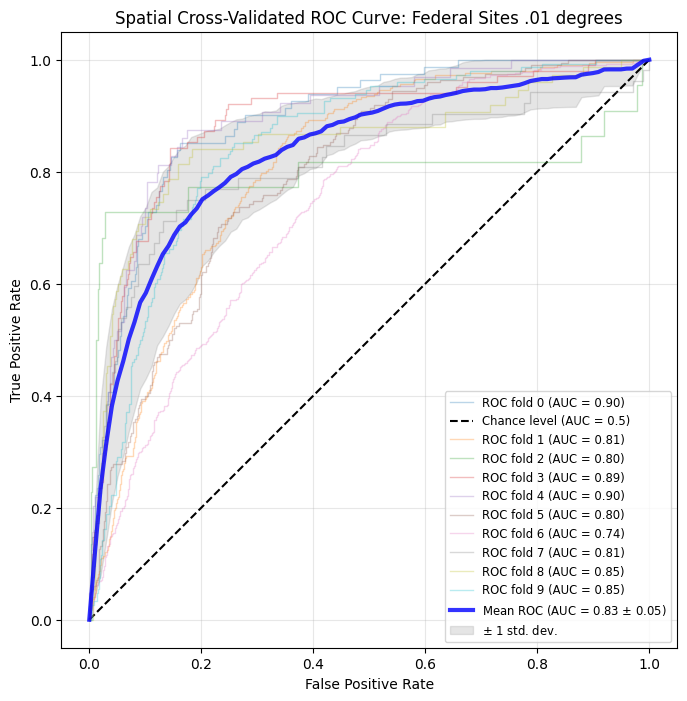

In [136]:
plt.close('all')

# --- 1. SETUP ---
logo = LeaveOneGroupOut()
tprs = [] # True Positive Rates
aucs = [] # Area Under the Curves
mean_fpr = np.linspace(0, 1, 100)

fig, ax = plt.subplots(figsize=(8, 8))

# Use the features (X), labels (y), and spatial groups defined earlier
print(f"Starting Spatial CV on {len(X)} samples with {len(groups.unique())} clusters...\n")

# --- 2. The Spatial LOGO Loop ---
for fold, (train_idx, test_idx) in enumerate(logo.split(X, y, groups=groups)):
    y_test = y.iloc[test_idx]
    if len(np.unique(y_test)) < 2:
        continue

    # Train on everything EXCEPT the current cluster
    clf.fit(X.iloc[train_idx], y.iloc[train_idx])

    # Plot individual fold curve (thin, pastel colors)
    viz = RocCurveDisplay.from_estimator(
        clf,
        X.iloc[test_idx],
        y.iloc[test_idx],
        name=f"ROC fold {fold}",
        alpha=0.3,
        lw=1,
        ax=ax,
        # Plot the dotted chance level line ONLY for the first valid fold
        plot_chance_level=(len(tprs) == 0)
    )

    # 3. INTERPOLATION for averaging
    interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
    interp_tpr[0] = 0.0 # Force curve to start at 0,0
    tprs.append(interp_tpr)
    aucs.append(viz.roc_auc)

# --- 4. CACLULATE SPATIAL MEAN & VARIANCE ---
if tprs:
    # Calculate the mean of the True Positive Rates across all spatial folds
    mean_tpr = np.mean(tprs, axis=0)
    mean_tpr[-1] = 1.0
    # Calculate Area under the MEAN curve (a slightly more robust statistic)
    mean_auc = auc(mean_fpr, mean_tpr)
    # Calculate Standard Deviation of the AUC values
    std_auc = np.std(aucs)

    # Plot the thick blue Mean ROC line
    ax.plot(
        mean_fpr,
        mean_tpr,
        color="blue",
        # Text from the example: AUC = Mean ± StdDev
        label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
        lw=3, # Thick line
        alpha=0.8,
    )

    # Calculate and Plot the Shaded Variance Region (Standard Deviation)
    std_tpr = np.std(tprs, axis=0)
    tprs_upper = np.minimum(mean_tpr + std_tpr, 1) # Keep upper boundary <= 1
    tprs_lower = np.maximum(mean_tpr - std_tpr, 0) # Keep lower boundary >= 0

    # Fill the region
    ax.fill_between(
        mean_fpr,
        tprs_lower,
        tprs_upper,
        color="grey",
        alpha=0.2,
        label=r"$\pm$ 1 std. dev.",
    )

# --- 5. Final Formatting ---
ax.set(
    xlim=[-0.05, 1.05],
    ylim=[-0.05, 1.05],
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Spatial Cross-Validated ROC Curve: Federal Sites .01 degrees"
)

# Use small legend and multiple columns to fit all the folds, matching the look
ax.legend(loc="lower right", fontsize='small')
plt.grid(alpha=0.3)

plt.show()

In [137]:
# Assuming 'federal_prj_filtered' and 'federal_clusters' are available from previous cells.
# 'X' and 'y' are derived from 'federal_prj_filtered'.

# --- 0. Pre-filter data for cross_validate to avoid single-class test folds ---
# Identify groups that contain only one unique label (0 or 1)
# This is crucial for metrics like log_loss and roc_auc, which require at least two classes.
# We use federal_prj_filtered because X and y are based on it.
unique_labels_per_fold = federal_prj_filtered.groupby('folds')['indicator'].nunique()
problematic_folds_ids = unique_labels_per_fold[unique_labels_per_fold == 1].index.tolist()

# Filter X, y, and the groups array if problematic folds are found
if problematic_folds_ids:
    print(f"Warning: The following folds contain only one class and will be excluded from `cross_validate`: {problematic_folds_ids}")
    # Create a boolean mask for the rows to keep
    mask = ~federal_prj_filtered['folds'].isin(problematic_folds_ids)

    X_filtered = X[mask]
    y_filtered = y[mask]
    # Re-create spatial_folds_filtered to ensure it matches the filtered X and y
    spatial_folds_filtered = federal_prj_filtered[mask]['folds'].values.ravel()
else:
    X_filtered = X
    y_filtered = y
    spatial_folds_filtered = federal_prj_filtered['folds'].values.ravel() # Ensure this is always from federal_prj_filtered


# --- 1. Define the Estimator and Cross-Validator ---

# FIX: Use a fresh LogisticRegression estimator.
# We add stability settings (max_iter) and set regularization (C) to default.
clf = FixedThresholdClassifier(base_clf, threshold=0.5)

# Initiate the Leave One Group Out cross-validator
group_cvs = LeaveOneGroupOut()

# --- 2. Evaluate the model and collect the results ---

# Use Classification Scoring
classification_scoring = [
    'roc_auc',
    'accuracy',
    'precision',
    'neg_log_loss'
]

print("Starting Leave One Group Out (Spatial) Cross-Validation...")
# We pass the groups array directly to the 'groups' parameter of cross_validate.
spatial_cluster_scores = cross_validate(
    clf, # Uses the new LogisticRegression estimator
    X_filtered, # Use filtered X
    y_filtered.values.ravel(), # Use filtered y
    scoring=classification_scoring,
    cv=group_cvs,  # Pass the LOGO object
    groups=spatial_folds_filtered, # Pass the filtered spatial group IDs
    n_jobs=-1,
    error_score='raise'
)

print("\n--- Spatial Cross-Validation Complete ---")
print(f"Number of folds run: {len(spatial_cluster_scores['test_roc_auc'])}")
print("Results Summary:")
print(spatial_cluster_scores)

Starting Leave One Group Out (Spatial) Cross-Validation...

--- Spatial Cross-Validation Complete ---
Number of folds run: 10
Results Summary:
{'fit_time': array([1.01277304, 0.92887855, 1.39382672, 1.60810518, 1.13192892,
       1.31430817, 1.27827859, 1.47194004, 1.47561288, 0.91099167]), 'score_time': array([0.05103683, 0.08533692, 0.06814337, 0.04061151, 0.06785393,
       0.07070088, 0.04773402, 0.06986475, 0.03822589, 0.0215795 ]), 'test_roc_auc': array([0.89530713, 0.80923186, 0.79608111, 0.88812246, 0.89559659,
       0.79755092, 0.74353289, 0.81378081, 0.85284946, 0.84875899]), 'test_accuracy': array([0.90068027, 0.77629513, 0.97560976, 0.90518084, 0.91823056,
       0.80445795, 0.70078266, 0.93486128, 0.87915937, 0.85412668]), 'test_precision': array([0.75      , 0.52054795, 0.625     , 0.54901961, 0.52727273,
       0.51937984, 0.60301508, 0.42857143, 0.63636364, 0.47142857]), 'test_neg_log_loss': array([-0.23501669, -0.43781354, -0.08929064, -0.21969153, -0.19319208,
      

In [138]:
# --- 1. Organize the Spatial CV Results ---
df_sp_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})

# --- 2. Calculate Full Summary Statistics ---
# Order matters here!
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]

spatial_summary = df_sp_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)

# --- 3. Clean up the row names (MUST match the order in stats_to_run) ---
spatial_summary.index = [
    'Mean',
    'Median',
    'Std Dev',
    'Min (Worst)',
    'Max (Best)',
    'Q1 (25%)',
    'Q3 (75%)'
]

# --- 4. Print the Results ---
print("--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---")
print(spatial_summary.round(4))

--- Spatial Clusters (LOGO) CV: Full Numerical Assessment ---
                auc  precision  accuracy  log_loss
Mean         0.8341     0.5631    0.8649    0.2935
Median       0.8313     0.5381    0.8899    0.2572
Std Dev      0.0506     0.0928    0.0828    0.1422
Min (Worst)  0.7435     0.4286    0.7008    0.0893
Max (Best)   0.8956     0.7500    0.9756    0.5686
Q1 (25%)     0.8005     0.5197    0.8169    0.1998
Q3 (75%)     0.8793     0.6195    0.9150    0.3857


In [139]:
# The global list 'all_results_data' and 'add_result_row' function are defined in a previous cell.

# --- Calculate summary statistics for Random CV (400% case) ---
df_random_cv_scores = pd.DataFrame({
    'auc': random_n_scores['test_roc_auc'],
    'accuracy': random_n_scores['test_accuracy'],
    'precision': random_n_scores['test_precision'],
    'log_loss': np.abs(random_n_scores['test_neg_log_loss']),
    'cv_type': 'Random CV'
})
stats_to_run = ['mean', 'median', 'std', 'min', 'max', lambda x: x.quantile(0.25), lambda x: x.quantile(0.75)]
random_summary_400 = df_random_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
random_summary_400.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# spatial_summary is already available from previous cell
# Re-create it here for clarity and to ensure it uses the correct data
df_spatial_cv_scores = pd.DataFrame({
    'auc': spatial_cluster_scores['test_roc_auc'],
    'accuracy': spatial_cluster_scores['test_accuracy'],
    'precision': spatial_cluster_scores['test_precision'],
    'log_loss': np.abs(spatial_cluster_scores['test_neg_log_loss']),
    'cv_type': 'Spatial CV'
})
spatial_summary_400 = df_spatial_cv_scores[['auc', 'precision','accuracy', 'log_loss']].agg(stats_to_run)
spatial_summary_400.index = ['Mean','Median','Std Dev','Min (Worst)','Max (Best)','Q1 (25%)','Q3 (75%)']

# --- POPULATING WITH YOUR PROVIDED NUMBERS (400% data) --- (using global add_result_row)
# Percentage refers to number of 0s compared to 1s

# 400% - Auto-populated with current run results
add_result_row(400, 'Random', 'auc', random_summary_400.loc['Mean', 'auc'], random_summary_400.loc['Median', 'auc'], random_summary_400.loc['Std Dev', 'auc'], random_summary_400.loc['Min (Worst)', 'auc'], random_summary_400.loc['Max (Best)', 'auc'], random_summary_400.loc['Q1 (25%)', 'auc'], random_summary_400.loc['Q3 (75%)', 'auc'])
add_result_row(400, 'Random', 'precision', random_summary_400.loc['Mean', 'precision'], random_summary_400.loc['Median', 'precision'], random_summary_400.loc['Std Dev', 'precision'], random_summary_400.loc['Min (Worst)', 'precision'], random_summary_400.loc['Max (Best)', 'precision'], random_summary_400.loc['Q1 (25%)', 'precision'], random_summary_400.loc['Q3 (75%)', 'precision'])
add_result_row(400, 'Random', 'accuracy', random_summary_400.loc['Mean', 'accuracy'], random_summary_400.loc['Median', 'accuracy'], random_summary_400.loc['Std Dev', 'accuracy'], random_summary_400.loc['Min (Worst)', 'accuracy'], random_summary_400.loc['Max (Best)', 'accuracy'], random_summary_400.loc['Q1 (25%)', 'accuracy'], random_summary_400.loc['Q3 (75%)', 'accuracy'])
add_result_row(400, 'Random', 'log_loss', random_summary_400.loc['Mean', 'log_loss'], random_summary_400.loc['Median', 'log_loss'], random_summary_400.loc['Std Dev', 'log_loss'], random_summary_400.loc['Min (Worst)', 'log_loss'], random_summary_400.loc['Max (Best)', 'log_loss'], random_summary_400.loc['Q1 (25%)', 'log_loss'], random_summary_400.loc['Q3 (75%)', 'log_loss'])
add_result_row(400, 'K fold', 'auc', spatial_summary_400.loc['Mean', 'auc'], spatial_summary_400.loc['Median', 'auc'], spatial_summary_400.loc['Std Dev', 'auc'], spatial_summary_400.loc['Min (Worst)', 'auc'], spatial_summary_400.loc['Max (Best)', 'auc'], spatial_summary_400.loc['Q1 (25%)', 'auc'], spatial_summary_400.loc['Q3 (75%)', 'auc'])
add_result_row(400, 'K fold', 'precision', spatial_summary_400.loc['Mean', 'precision'], spatial_summary_400.loc['Median', 'precision'], spatial_summary_400.loc['Std Dev', 'precision'], spatial_summary_400.loc['Min (Worst)', 'precision'], spatial_summary_400.loc['Max (Best)', 'precision'], spatial_summary_400.loc['Q1 (25%)', 'precision'], spatial_summary_400.loc['Q3 (75%)', 'precision'])
add_result_row(400, 'K fold', 'accuracy', spatial_summary_400.loc['Mean', 'accuracy'], spatial_summary_400.loc['Median', 'accuracy'], spatial_summary_400.loc['Std Dev', 'accuracy'], spatial_summary_400.loc['Min (Worst)', 'accuracy'], spatial_summary_400.loc['Max (Best)', 'accuracy'], spatial_summary_400.loc['Q1 (25%)', 'accuracy'], spatial_summary_400.loc['Q3 (75%)', 'accuracy'])
add_result_row(400, 'K fold', 'log_loss', spatial_summary_400.loc['Mean', 'log_loss'], spatial_summary_400.loc['Median', 'log_loss'], spatial_summary_400.loc['Std Dev', 'log_loss'], spatial_summary_400.loc['Min (Worst)', 'log_loss'], spatial_summary_400.loc['Max (Best)', 'log_loss'], spatial_summary_400.loc['Q1 (25%)', 'log_loss'], spatial_summary_400.loc['Q3 (75%)', 'log_loss'])

df_long = pd.DataFrame(all_results_data)

# Display the head and tail of the DataFrame to verify its content
display(df_long.head())
display(df_long.tail())

,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
0,0,Random,auc,0.599283,0.606855,0.033723,0.539208,0.648758,0.577315,0.620303
1,0,Random,precision,0.580127,0.580684,0.021568,0.549133,0.605263,0.560630,0.600631
2,0,Random,accuracy,0.578659,0.578535,0.019899,0.551402,0.608696,0.560559,0.595497
3,0,Random,log_loss,0.686363,0.679231,0.019394,0.657093,0.715019,0.676339,0.704478
4,0,K fold,auc,0.610727,0.605958,0.042650,0.556612,0.686356,0.585170,0.635894


,Pct,Type,Metric,Mean,Median,Std,Min,Max,Q1,Q3
67,400,Random,log_loss,0.318524,0.313716,0.014521,0.298170,0.339949,0.308757,0.329677
68,400,K fold,auc,0.834081,0.831270,0.050583,0.743533,0.895597,0.800471,0.879304
69,400,K fold,precision,0.563060,0.538146,0.092754,0.428571,0.750000,0.519672,0.619504
70,400,K fold,accuracy,0.864938,0.889920,0.082769,0.700783,0.975610,0.816875,0.914968
71,400,K fold,log_loss,0.293481,0.257231,0.142204,0.089291,0.568598,0.199817,0.385713


#Figure Creation

Each block of code below features a different type of figure. The first block is the one we prefer.

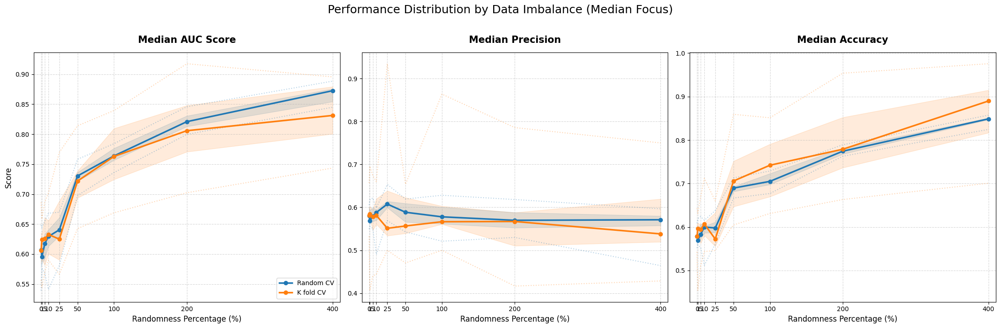

In [140]:
#Primary figure!

import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter
import seaborn as sns

# --- Plotting Logic (from user's prompt) ---
metrics = ['auc', 'precision', 'accuracy']
titles = ['Median AUC Score', 'Median Precision', 'Median Accuracy']
colors = {'Random': '#1f77b4', 'K fold': '#ff7f0e'}
percentages = [0, 1, 5, 10, 25, 50, 100, 200, 400]

fig, axes = plt.subplots(1, 3, figsize=(22, 7))

for i, metric in enumerate(metrics):
    ax = axes[i]
    for cv_type in ['Random', 'K fold']:
        subset = df_long[(df_long['Metric'] == metric) & (df_long['Type'] == cv_type)].sort_values('Pct')

        # Main Median Line
        ax.plot(subset['Pct'], subset['Median'], label=f'{cv_type} CV', marker='o', color=colors[cv_type], linewidth=2.5)
        #Primary thick lines representing median data from results

        # Shaded IQR (Q1 to Q3)
        ax.fill_between(subset['Pct'], subset['Q1'], subset['Q3'], color=colors[cv_type], alpha=0.15)
        #shaded area on graph representing standard deviation

        # Dotted Min/Max
        ax.plot(subset['Pct'], subset['Min'], linestyle=':', alpha=0.3, color=colors[cv_type])
        ax.plot(subset['Pct'], subset['Max'], linestyle=':', alpha=0.3, color=colors[cv_type])
        #Dotted lines represent minimum and maximum

    # Axis Formatting
    ax.set_title(titles[i], fontsize=15, fontweight='bold', pad=15)
    ax.set_xlabel('Randomness Percentage (%)', fontsize=12)
    ax.set_xlim(-10, 410)
    ax.set_xticks(percentages)
    ax.xaxis.set_major_formatter(ScalarFormatter())
    ax.grid(True, linestyle='--', alpha=0.5)
    if i == 0: ax.set_ylabel('Score', fontsize=12)

axes[0].legend(loc='lower right')
plt.suptitle('Performance Distribution by Data Imbalance (Median Focus)', fontsize=18, y=1.02)
plt.tight_layout()

#-----USER INPUT-----#
# Save plot
output_filename = f'{today_date}_Performance_Distribution_by_Data_Imbalance_MedianFocus_.01_Federal.pdf' #name of pdf
full_path = os.path.join(output_folder, output_filename)
plt.savefig(full_path, dpi=300, bbox_inches='tight')

plt.show()



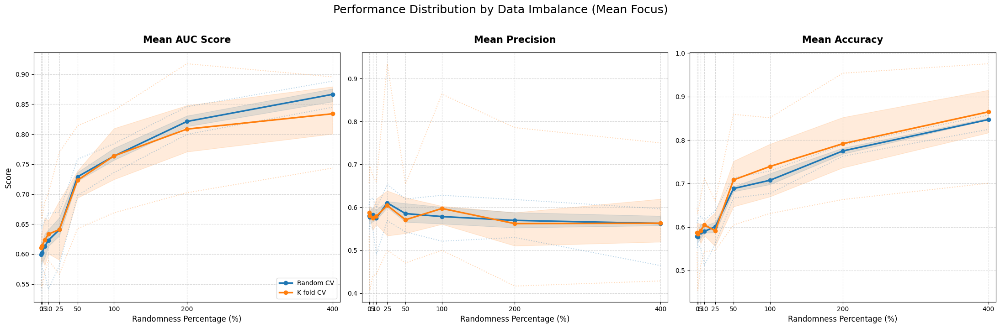

In [141]:
#Same as above except Mean instead of Median
# --- Plotting Logic (from user's prompt) ---
metrics = ['auc', 'precision', 'accuracy']
titles = ['Mean AUC Score', 'Mean Precision', 'Mean Accuracy']
colors = {'Random': '#1f77b4', 'K fold': '#ff7f0e'}
percentages = [0, 1, 5, 10, 25, 50, 100, 200, 400]

fig, axes = plt.subplots(1, 3, figsize=(22, 7))

for i, metric in enumerate(metrics):
    ax = axes[i]
    for cv_type in ['Random', 'K fold']:
        subset = df_long[(df_long['Metric'] == metric) & (df_long['Type'] == cv_type)].sort_values('Pct')

        # Main Mean Line
        ax.plot(subset['Pct'], subset['Mean'], label=f'{cv_type} CV', marker='o', color=colors[cv_type], linewidth=2.5)

        # Shaded IQR (Q1 to Q3)
        ax.fill_between(subset['Pct'], subset['Q1'], subset['Q3'], color=colors[cv_type], alpha=0.15)

        # Dotted Min/Max
        ax.plot(subset['Pct'], subset['Min'], linestyle=':', alpha=0.3, color=colors[cv_type])
        ax.plot(subset['Pct'], subset['Max'], linestyle=':', alpha=0.3, color=colors[cv_type])

    # Axis Formatting
    ax.set_title(titles[i], fontsize=15, fontweight='bold', pad=15)
    ax.set_xlabel('Randomness Percentage (%)', fontsize=12)
    ax.set_xlim(-10, 410)
    ax.set_xticks(percentages)
    ax.xaxis.set_major_formatter(ScalarFormatter())
    ax.grid(True, linestyle='--', alpha=0.5)
    if i == 0: ax.set_ylabel('Score', fontsize=12)

axes[0].legend(loc='lower right')
plt.suptitle('Performance Distribution by Data Imbalance (Mean Focus)', fontsize=18, y=1.02)
plt.tight_layout()

#-----USER INPUT-----#
# Save plot
output_filename = f'{today_date}_Performance_Distribution_by_Data_Imbalance_MeanFocus_.01_Federal.pdf'
full_path = os.path.join(output_folder, output_filename)
plt.savefig(full_path, dpi=300, bbox_inches='tight')

plt.show()



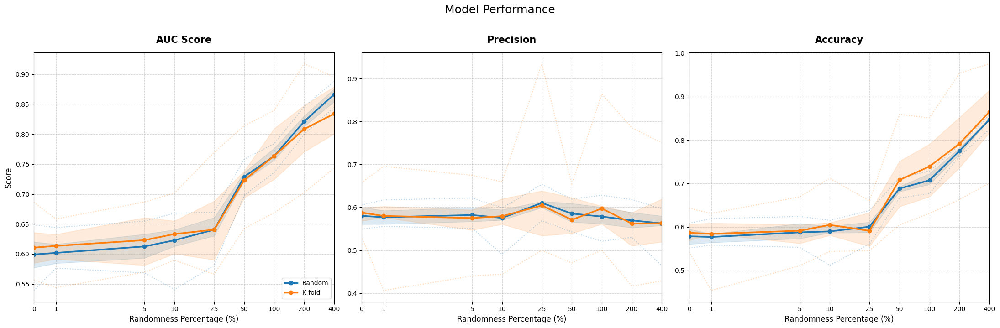

In [143]:
#Mean model performance results, logged

import matplotlib.pyplot as plt
from matplotlib.ticker import ScalarFormatter

# --- Graphing Portion ---
metrics = ['auc', 'precision', 'accuracy']
titles = ['Mean AUC Score', 'Mean Precision', 'Mean Accuracy']
colors = {'Random': '#1f77b4', 'K fold': '#ff7f0e'}
percentages = [0, 1, 5, 10, 25, 50, 100, 200, 400]

fig, axes = plt.subplots(1, 3, figsize=(22, 7))

for i, metric in enumerate(metrics):
    ax = axes[i]
    for cv_type in ['Random', 'K fold']:
        subset = df_long[(df_long['Metric'] == metric) & (df_long['Type'] == cv_type)].sort_values('Pct')

        # Plot Mean, Shaded IQR, and Min/Max range
        ax.plot(subset['Pct'], subset['Mean'], label=f'{cv_type}', marker='o', color=colors[cv_type], linewidth=2.5)
        ax.fill_between(subset['Pct'], subset['Q1'], subset['Q3'], color=colors[cv_type], alpha=0.15)
        ax.plot(subset['Pct'], subset['Min'], linestyle=':', alpha=0.3, color=colors[cv_type])
        ax.plot(subset['Pct'], subset['Max'], linestyle=':', alpha=0.3, color=colors[cv_type])

    # --- Axis Formatting ---
    ax.set_title(titles[i], fontsize=15, fontweight='bold', pad=15)
    ax.set_xlabel('Randomness Percentage (%)', fontsize=12)

    # Scale and Limits - logs the x axis
    ax.set_xscale('symlog', linthresh=5)
    ax.set_xlim(0, 400)

    # FORCE LABELS TO BE NUMBERS:
    ax.set_xticks(percentages)
    ax.xaxis.set_major_formatter(ScalarFormatter())

    ax.grid(True, which="both", linestyle='--', alpha=0.5)
    if i == 0: ax.set_ylabel('Score', fontsize=12)

axes[0].legend(loc='lower right')
plt.suptitle('Mean Model Performance Results, Logged', fontsize=18, y=1.02)
plt.tight_layout()

#-----USER INPUT-----#
# Save plot
output_filename = f'{today_date}_Mean_Model_Performance_Logged_.01_Federal.pdf'
full_path = os.path.join(output_folder, output_filename)
plt.savefig(full_path, dpi=300, bbox_inches='tight')

plt.show()

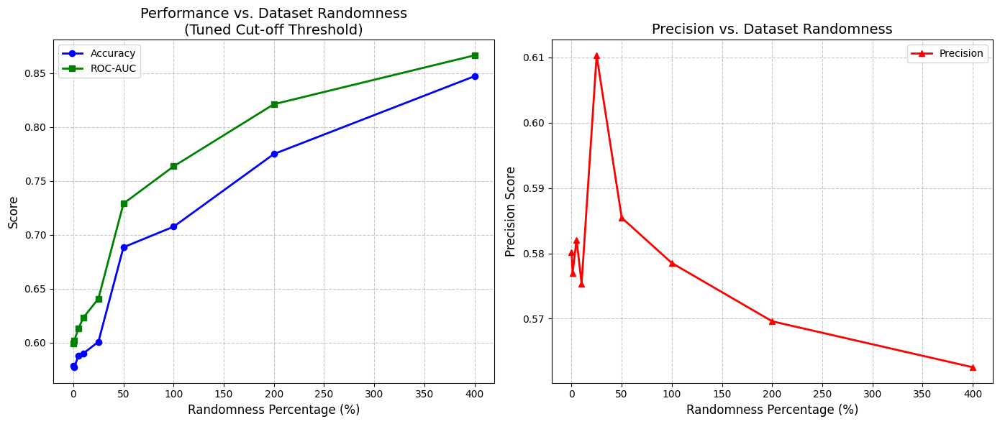

In [144]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Dynamically generate results_data from df_long for 'Random' CV type
df_random = df_long[df_long['Type'] == 'Random'].sort_values('Pct')

results_data = {
    'Randomness_%': df_random[df_random['Metric'] == 'auc']['Pct'].tolist(),
    'AUC': df_random[df_random['Metric'] == 'auc']['Mean'].tolist(),
    'Precision': df_random[df_random['Metric'] == 'precision']['Mean'].tolist(),
    'Accuracy': df_random[df_random['Metric'] == 'accuracy']['Mean'].tolist()
}

df_results = pd.DataFrame(results_data)


plt.figure(figsize=(14, 6))

# Figure 1: AUC and Accuracy (The "Steepening" Check)
plt.subplot(1, 2, 1)
plt.plot(df_results['Randomness_%'], df_results['Accuracy'], marker='o', label='Accuracy', color='blue', linewidth=2)
plt.plot(df_results['Randomness_%'], df_results['AUC'], marker='s', label='ROC-AUC', color='green', linewidth=2)
plt.title('Performance vs. Dataset Randomness\n(Tuned Cut-off Threshold)', fontsize=14)
plt.xlabel('Randomness Percentage (%)', fontsize=12)
plt.ylabel('Score', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

# Figure 2: Precision (The "Trade-off" Check)
plt.subplot(1, 2, 2)
plt.plot(df_results['Randomness_%'], df_results['Precision'], marker='^', label='Precision', color='red', linewidth=2)
plt.title('Precision vs. Dataset Randomness', fontsize=14)
plt.xlabel('Randomness Percentage (%)', fontsize=12)
plt.ylabel('Precision Score', fontsize=12)
plt.legend()
plt.grid(True, linestyle='--', alpha=0.7)

plt.tight_layout()

#-----USER INPUT-----#
# Save plot
output_filename = f'{today_date}_Research_Curve_.01_Federal.pdf'
full_path = os.path.join(output_folder, output_filename)
plt.savefig(full_path, dpi=300, bbox_inches='tight')

plt.show()